# Computation of water vapor from atmosphere observations

In this notebook we outline a process to estimate the zenithal water vapor column from observations of a few water atmospheric lines.

## Read ATRAN data

In [1]:
swalpha = []; lwalpha = []
from fifipy.calib import readAtran
atran2 = readAtran('BLUE', 2)
atran1 = readAtran('RED', 1)

# Adjust ZA of a few files in Flight 633

In [2]:
from astropy.io import fits

file1lw = '00466_090251_000001a_atm_w40_lw.fits'  # add ZA_START, ZA_END 48.4254
file2lw =  '00467_090301_000001b_atm_w40_lw.fits' # add ZA_START 48.4254
file1sw = '00466_090251_000001a_atm_w40_sw.fits'  # add ZA_START, ZA_END 48.4254
file2sw =  '00467_090301_000001b_atm_w40_sw.fits' # add ZA_START 48.4254

path = '/Users/dfadda/sofia/FIFI-LS/WaterVapor/FLT633/'

f = fits.open(path+file1sw, mode='update')
f[0].header['ZA_END'] = 48.4254
f[0].header['ZA_START'] = 48.4254
f.flush()
f.close()
f = fits.open(path+file1lw, mode='update')
f[0].header['ZA_END'] = 48.4254
f[0].header['ZA_START'] = 48.4254
f.flush()
f.close()
f = fits.open(path+file2sw, mode='update')
f[0].header['ZA_END'] = 48.4254
f[0].header['ZA_START'] = 48.4254
f.flush()
f.close()
f = fits.open(path+file2lw, mode='update')
f[0].header['ZA_END'] = 48.4254
f[0].header['ZA_START'] = 48.4254
f.flush()
f.close()


# Flight 633

In [50]:
%matplotlib inline
import numpy as np
from fifipy.wvz import computeMeanFlux, computeAtran, getGroups, flightPlots, computeAtranTot
import time
import os
wvzdir = '/Users/dfadda/sofia/FIFI-LS/WaterVapor/'

flight = '631'
swgroups, lwgroups = getGroups(wvzdir, 'FLT'+flight)
swgroup = swgroups[0]
print(swgroup[0])
fileparts = os.path.basename(swgroup[0]).split('_')
print(fileparts[0])

/Users/dfadda/sofia/FIFI-LS/WaterVapor//FLT631/00005_042542_000001a_atm_w40_sw.fits
00005


1  /  17


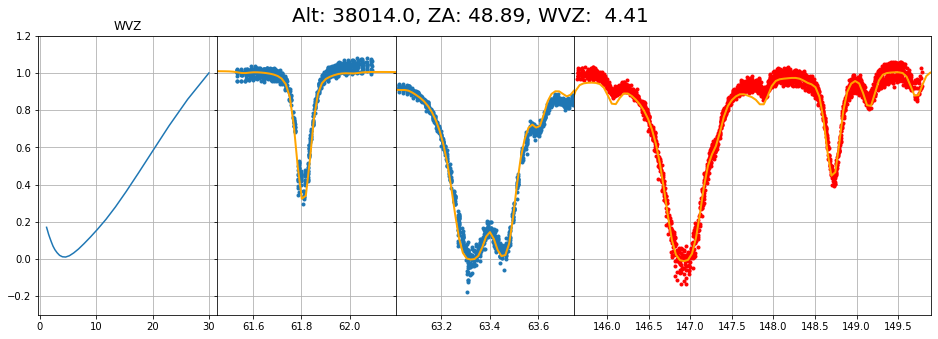

2  /  17


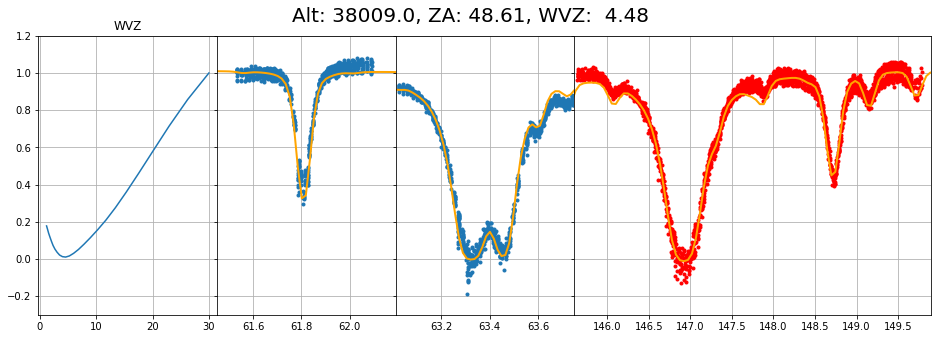

3  /  17


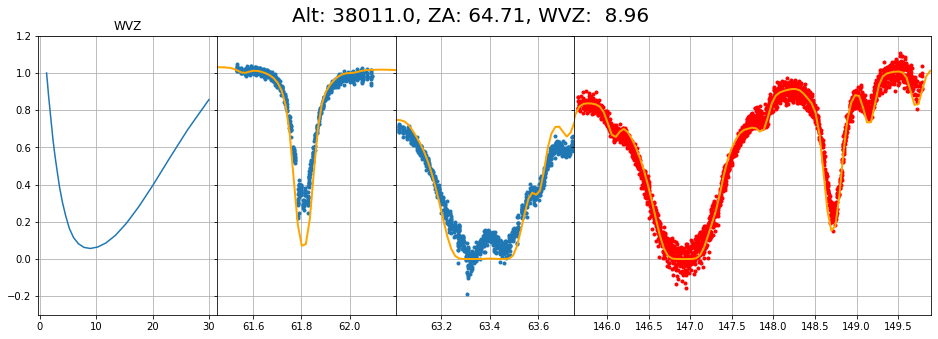

4  /  17


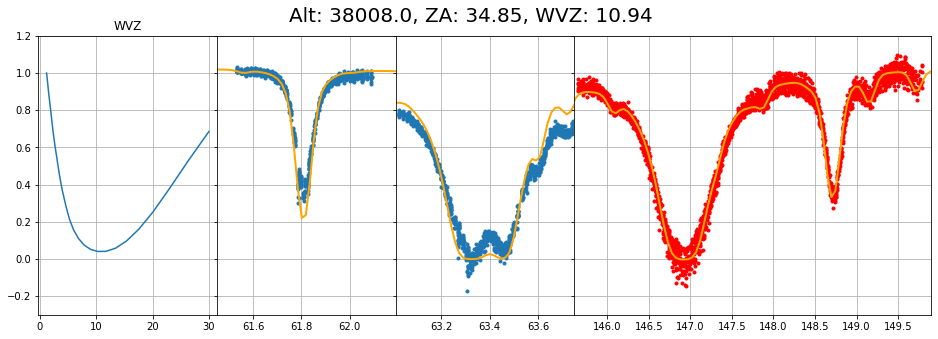

5  /  17


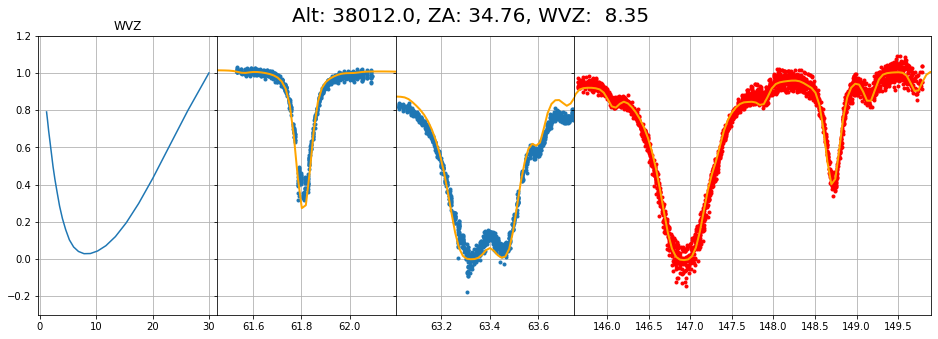

6  /  17


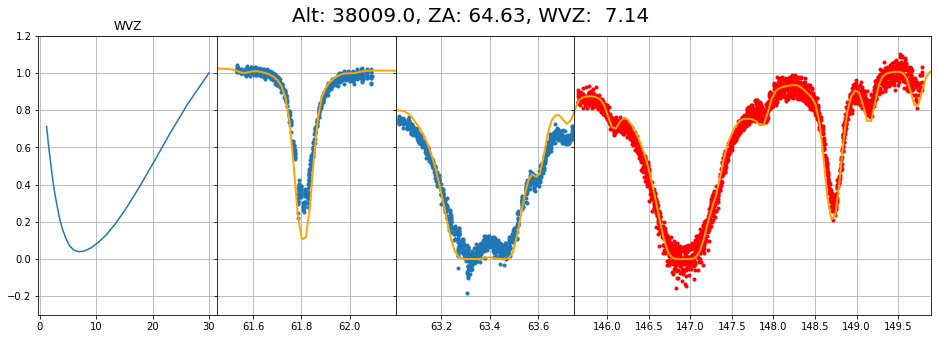

7  /  17


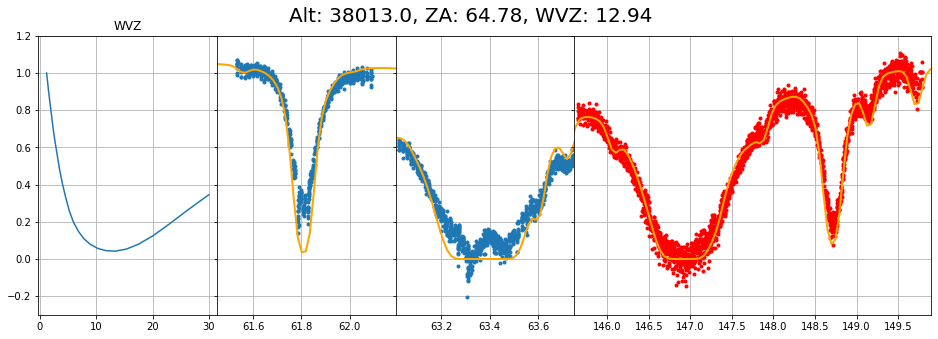

8  /  17


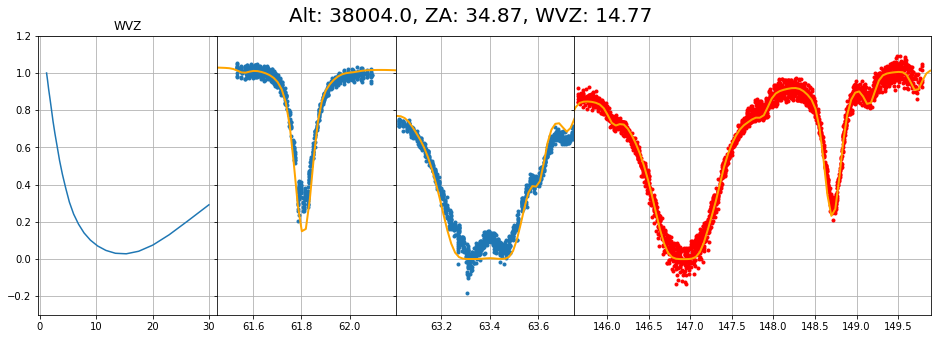

9  /  17


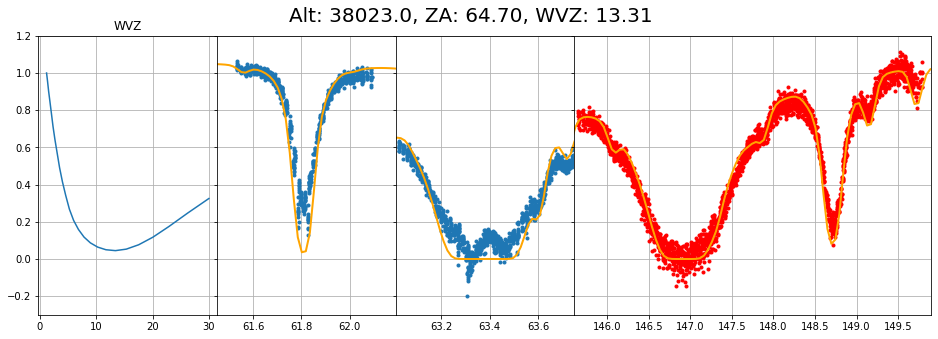

10  /  17


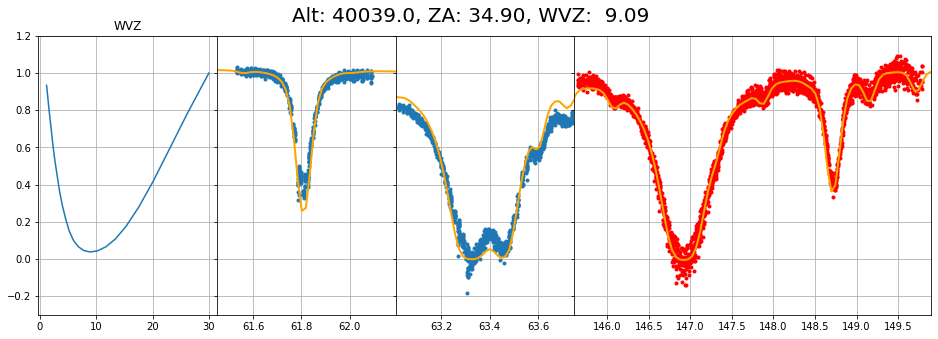

11  /  17


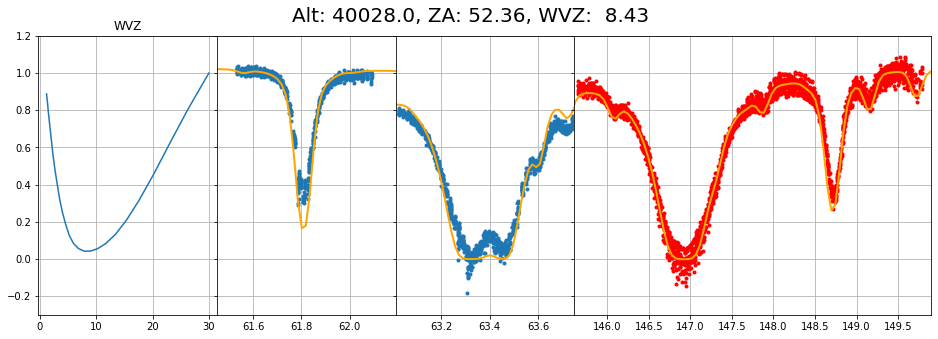

12  /  17


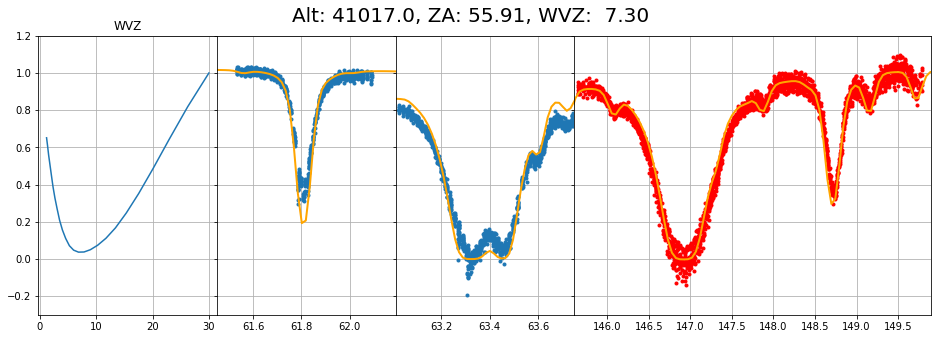

13  /  17


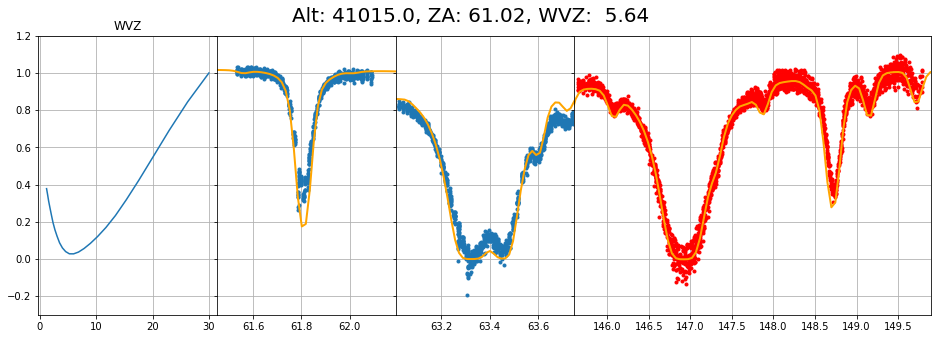

14  /  17


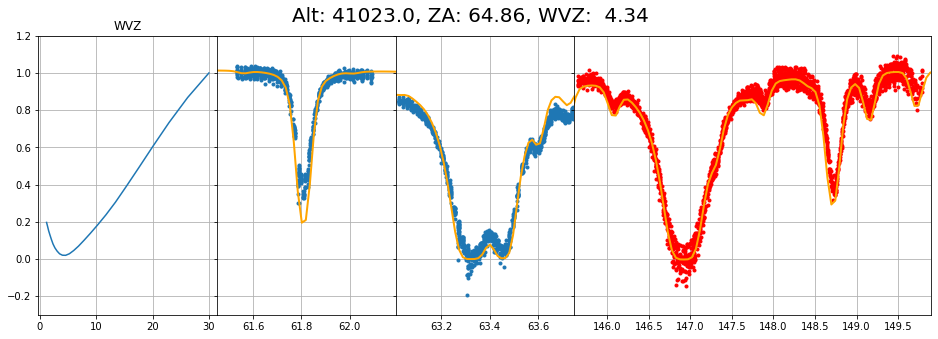

15  /  17


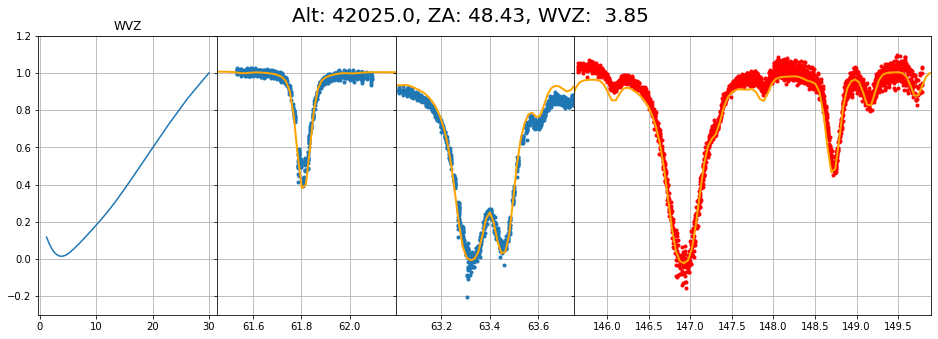

16  /  17


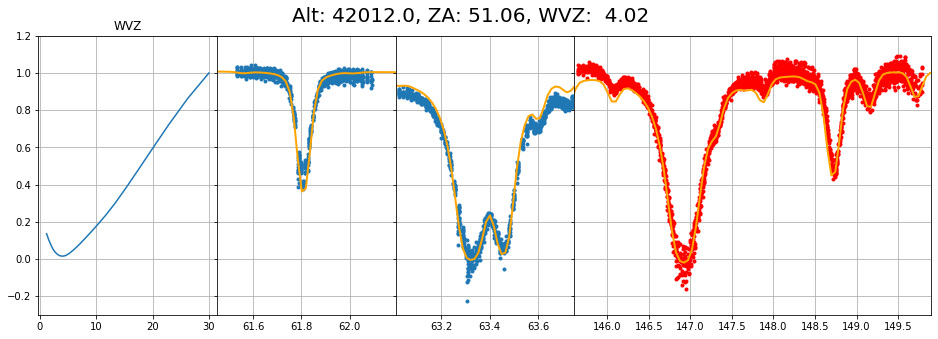

17  /  17


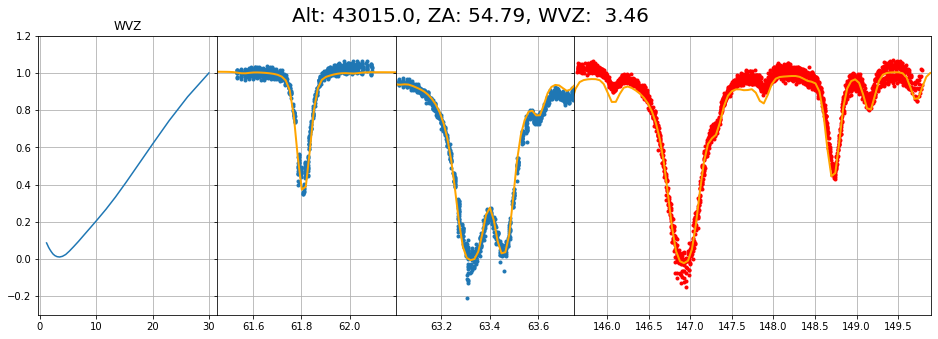

In [2]:
%matplotlib inline
import numpy as np
from fifipy.wvz import computeMeanFlux, computeAtran, getGroups, flightPlots, computeAtranTot
import time
import os
wvzdir = '/Users/dfadda/sofia/FIFI-LS/WaterVapor/'

flight = '633'
swgroups, lwgroups = getGroups(wvzdir, 'FLT'+flight)
ngroups = len(lwgroups)
alt = []
wmblue = []
wmred = []
wmtot = []
numfile = []
for i, (swgroup, lwgroup) in enumerate(zip(swgroups, lwgroups)):
    print(i+1 ,' / ', ngroups)
    fileparts = os.path.basename(swgroup[0]).split('_')
    numfile.append(fileparts[0])
    t0 = time.process_time()
    wavesb, fluxesb, detchanb, orderb, zab, altitudeb = computeMeanFlux(swgroup)
    wvmin, alpha, wblue, fblue = computeAtran(wavesb, fluxesb, detchanb, orderb, zab, altitudeb, atrandata=atran2, plot=False)
    wmblue.append(wvmin)
    wavesr, fluxesr, detchanr, orderr, zar, altituder = computeMeanFlux(lwgroup)
    wvmin, alpha, wred, fred = computeAtran(wavesr, fluxesr, detchanr, orderr, zar, altituder, atrandata=atran1, plot=False)
    wmred.append(wvmin)
    # Two fluxes at same time
    wvmin = computeAtranTot(wred, fred, wblue ,fblue, zar, altituder, atran1, atran2)
    wmtot.append(wvmin)
    t1 = time.process_time()
    #print('Data processed in ', t1-t0, ' s.')
    alt.append(altitudeb)
alt = np.array(alt)
wmblue = np.array(wmblue)
wmred = np.array(wmred)
wmtot = np.array(wmtot)
numfile = np.array(numfile)

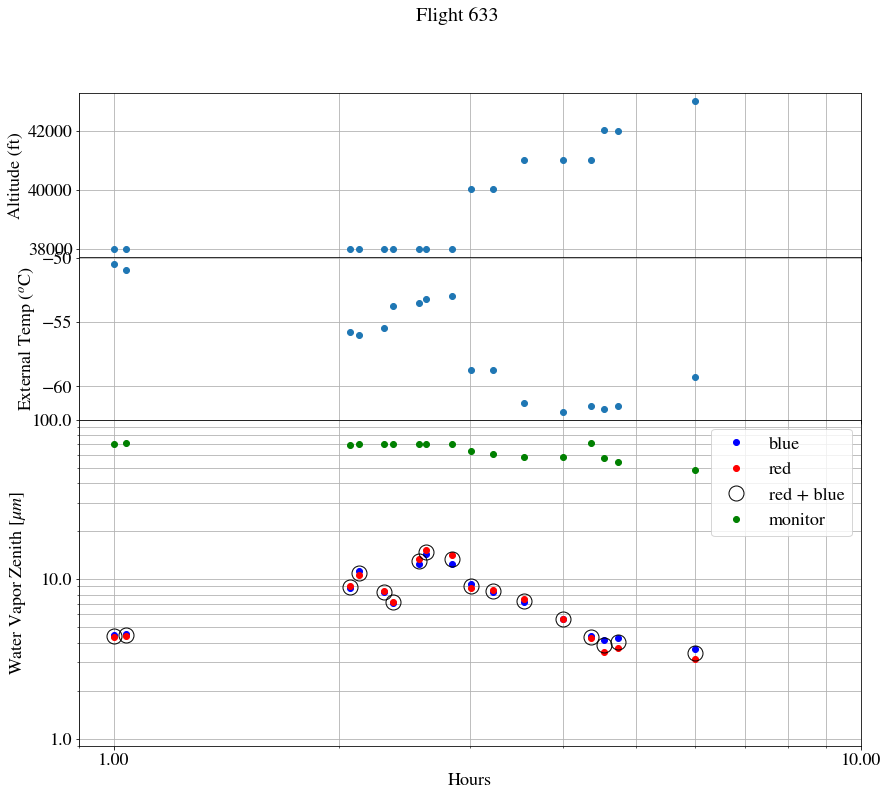

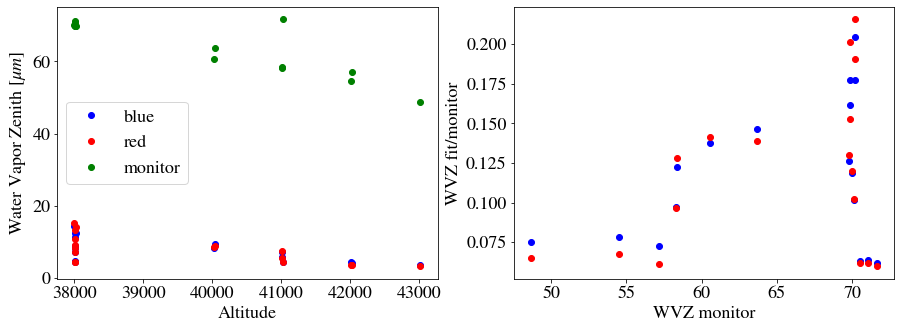

File  00014  Alt  38014.0 ft, WVZ: Blue  4.5  Red  4.4   Tot  4.4 
File  00019  Alt  38009.0 ft, WVZ: Blue  4.5  Red  4.4   Tot  4.5 
File  00181  Alt  38011.0 ft, WVZ: Blue  8.8  Red  9.1   Tot  9.0 
File  00192  Alt  38008.0 ft, WVZ: Blue 11.3  Red 10.7   Tot 10.9 
File  00222  Alt  38012.0 ft, WVZ: Blue  8.3  Red  8.4   Tot  8.3 
File  00233  Alt  38009.0 ft, WVZ: Blue  7.1  Red  7.2   Tot  7.1 
File  00268  Alt  38013.0 ft, WVZ: Blue 12.4  Red 13.4   Tot 12.9 
File  00279  Alt  38004.0 ft, WVZ: Blue 14.4  Red 15.1   Tot 14.8 
File  00317  Alt  38023.0 ft, WVZ: Blue 12.4  Red 14.1   Tot 13.3 
File  00352  Alt  40039.0 ft, WVZ: Blue  9.3  Red  8.8   Tot  9.1 
File  00357  Alt  40028.0 ft, WVZ: Blue  8.3  Red  8.5   Tot  8.4 
File  00386  Alt  41017.0 ft, WVZ: Blue  7.1  Red  7.5   Tot  7.3 
File  00428  Alt  41015.0 ft, WVZ: Blue  5.6  Red  5.6   Tot  5.6 
File  00455  Alt  41023.0 ft, WVZ: Blue  4.4  Red  4.3   Tot  4.3 
File  00466  Alt  42025.0 ft, WVZ: Blue  4.1  Red  3.5   Tot  

In [3]:
date, time, temp, wmon, fig = flightPlots(lwgroups, alt, wmblue, wmred, wmtot, 'Flight '+flight)
fig.savefig('WVZ_FLT'+flight+'.pdf')

for n, a, wb, wr, wt in zip(numfile, alt, wmblue, wmred, wmtot):
    print('File ',n,' Alt ', a, 'ft, WVZ: Blue {0:4.1f}'.format(wb),
          ' Red {0:4.1f} '.format(wr), ' Tot {0:4.1f} '.format(wt))
    
# Save in a csv file
import pandas as pd
df = pd.DataFrame({'Date': date, 'NumFile': numfile, 'Altitude': alt, 'ExtTemp': temp,
                   'WmzBlue': wmblue, 'WmzRed': wmred, 'WmzTot': wmtot})
df.to_csv('FLT'+flight+'.csv')

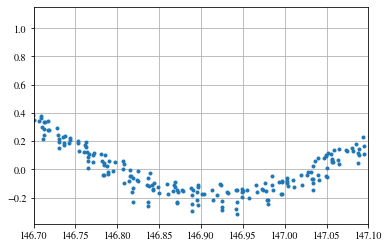

In [9]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.plot(wred, fred, '.')
plt.xlim(146.7,147.1)
plt.grid()

### Double check

In [20]:
def computeBB(wavesb, wavesr, fluxesb,fluxesr):
    from astropy.constants import c
    import numpy as np
    from astropy import units as u
    from astropy.modeling.blackbody import blackbody_lambda, blackbody_nu
    
    # Red
    good = [0,6,7,8,10,11,13,14,15,16,19,23]
    wtot = np.ravel(wavesr[:,good,:])
    ftot = np.ravel(fluxesr[:,good,:])
    idx = (ftot > 0.01e-8)
    wtot = wtot[idx]
    ftot = ftot[idx]
            
    lc1 = [145.65, 145.85]
    lc2 = [149.3, 149.6]
    id1 = ((wtot > lc1[0]) & (wtot < lc1[1])) 
    id2 = ((wtot > lc2[0]) & (wtot < lc2[1]))
    f1 = np.nanmean(ftot[id1])
    f2 = np.nanmean(ftot[id2])
    w1 = 0.5 * (lc1[0] + lc1[1])
    w2 = 0.5 * (lc2[0] + lc2[1])
    for i in range(16):
        for j in range(25):
            fluxesr[:,j,i] -= np.interp(wavesr[:,j,i], [w1,w2], [f1,f2])        
    lc = [149.3, 149.6]
    idmin = (wtot > lc[0]) & (wtot < lc[1])
    B2 = np.nanmean(ftot[idmin])  # Black body in the red
    print('value at 149.45: ', B2)
    nu2 = c/(149.45e-6*u.m)
    # Blue
    good = [1,2,6,7,8,11,12,13,16,17,20,21,22]
    wtot = np.ravel(wavesb[:,good,:])
    ftot = np.ravel(fluxesb[:,good,:])
    idx = (ftot > 0.01e-8)
    wtot = wtot[idx]
    ftot = ftot[idx] 
    
    lc1 = [61.55,61.70]
    lc2 = [62.00,62.10]
    id1 = ((wtot > lc1[0]) & (wtot < lc1[1])) 
    id2 = ((wtot > lc2[0]) & (wtot < lc2[1]))
    f1 = np.nanmean(ftot[id1])
    f2 = np.nanmean(ftot[id2])
    w1 = 0.5 * (lc1[0] + lc1[1])
    w2 = 0.5 * (lc2[0] + lc2[1])
    for i in range(16):
        for j in range(25):
            fluxesb[:,j,i] -= np.interp(wavesb[:,j,i], [w1,w2], [f1,f2])    
    lc = [61.55,61.70]
    idmin = (wtot > lc[0]) & (wtot < lc[1])
    B1 = np.nanmean(ftot[idmin]*4)  # Black body in the red
    print('value at 61.625: ', B1)
    nu1 = c/(61.625e-6*u.m)

    T = np.arange(20,150,10)*u.K
    eratio = []
    for T_ in T:
        er = B2/blackbody_nu(149.45*u.micron, T_).value
        eb = B1/blackbody_nu(61.625*u.micron, T_).value
        eratio.append(er/eb)
    Topt = np.interp(1., np.array(eratio),T)
    emissivity = B2/blackbody_nu(149.45*u.micron, Topt).value
    print('T , emissivity ', Topt, emissivity)
    
    # Apply to fluxes
    
    #for i in range(16):
    #    for j in range(25):
    #        w = wavesr[:,j,i]*u.micron
    #        bb = emissivity * blackbody_nu(w, Topt)
    #        fluxesr[:,j,i] -= bb.value
    #        w = wavesb[:,j,i]*u.micron
    #        bb = emissivity * blackbody_nu(w, Topt)
    #        fluxesb[:,j,i] = fluxesb[:,j,i]*4 - bb.value
            
    return fluxesr, fluxesb

In [21]:
%matplotlib inline
import numpy as np
from fifipy.wvz import computeMeanFlux, computeAtran, getGroups, flightPlots #, computeFluxes
import time
import os
wvzdir = '/Users/dfadda/sofia/FIFI-LS/WaterVapor/'
flight = '633'
swgroups, lwgroups = getGroups(wvzdir, 'FLT'+flight)
ngroups = len(lwgroups)

swgroup = swgroups[14]
lwgroup = lwgroups[14]
fileparts = os.path.basename(swgroup[0]).split('_')
wavesb, fluxesb, detchanb, orderb, zab, altitudeb = computeMeanFlux(swgroup)
wavesr, fluxesr, detchanr, orderr, zar, altituder = computeMeanFlux(lwgroup)

fr, fb = computeBB(wavesb, wavesr, fluxesb,fluxesr)
#em, T = computeBB(wavesb, wavesr, fluxesb,fluxesr)

#wvmin, alpha = computeAtran(wavesb, fluxesb, detchanb, orderb, zab, altitudeb, atrandata=atran2)
#wvmin, alpha = computeAtran(wavesr, fluxesr, detchanr, orderr, zar, altituder, atrandata=atran1)


value at 149.45:  7.561336188001732e-09
value at 61.625:  1.9712054033966305e-08
T , emissivity  105.49007067183824 94.71192994044776


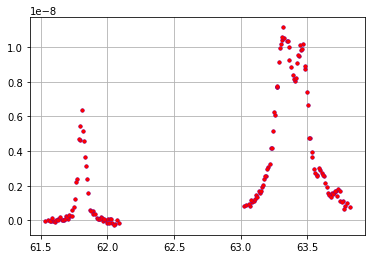

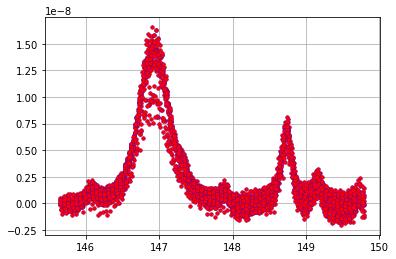

In [24]:
%matplotlib inline
import matplotlib.pyplot as plt
from astropy import units as u
from astropy.modeling.blackbody import blackbody_lambda, blackbody_nu

#print(blackbody_nu(149.45*u.micron, T).value * emissivity)
    
j = 12
for i in range(16):
    plt.plot(wavesb[:,j,i], fluxesb[:,j,i],'.', color='blue')
    plt.plot(wavesb[:,j,i], fb[:,j,i],'.', color='red')
    
wbb = np.arange(61,64,0.1) * u.micron
#bb = em * blackbody_nu(wbb, T)
#plt.plot(wbb, bb.value)
plt.grid()

plt.show()

for i in range(16):
    for j in range(25):
        plt.plot(wavesr[:,j,i], fluxesr[:,j,i],'.',color='blue')
        plt.plot(wavesr[:,j,i], fr[:,j,i],'.',color='red')
wbb = np.arange(145,150,.1) * u.micron
#bb = em * blackbody_nu(wbb, T)
#plt.plot(wbb, bb.value)
#plt.xlim([145.5,146])
plt.grid()


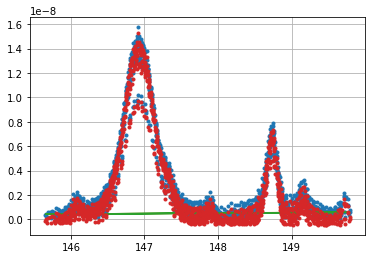

In [19]:
good = [0,6,7,8,10,11,13,14,15,16,19,23]
wtot = np.ravel(wavesr[:,good,:])
ftot = np.ravel(fluxesr[:,good,:])
idx = (ftot > 0.01e-8)
wtot = wtot[idx]
ftot = ftot[idx]

plt.plot(wtot, ftot,'.')

lc1 = [145.65, 145.85]
lc2 = [149.3, 149.6]
id1 = ((wtot > lc1[0]) & (wtot < lc1[1])) 
id2 = ((wtot > lc2[0]) & (wtot < lc2[1]))
f1 = np.nanmean(ftot[id1])
f2 = np.nanmean(ftot[id2])
w1 = 0.5 * (lc1[0] + lc1[1])
w2 = 0.5 * (lc2[0] + lc2[1])

plt.plot([w1,w2],[f1,f2])
plt.plot(wtot, np.interp(wtot, [w1,w2], [f1,f2]))
plt.plot(wtot, ftot -np.interp(wtot, [w1,w2], [f1,f2]),'.' )
plt.grid()

In [ ]:
import statsmodels.api as sm
from scipy.interpolate import interp1d

waves, fluxes, detchan, order, za, altitude = computeMeanFlux(lwgroup)

good = [0,1,6,7,8,10,11,13,14,15,16,19,23]

wtot = np.ravel(waves[:,good,:])
ftot = np.ravel(fluxes[:,good,:])
idx = (ftot > 0.1e-8)
wtot = wtot[idx]
ftot = ftot[idx]
lspec = sm.nonparametric.lowess(ftot,wtot, frac=0.03)
wlow = lspec[:,0]
flow = lspec[:,1]
f_ = interp1d(wlow, flow, fill_value='extrapolate')




import matplotlib.pyplot as plt
for j in range(25):
    plt.plot(waves[:,j,:], fluxes[:,j,:],'.',markersize=2,color='blue')
plt.plot(wlow,flow,color='red')
plt.show()


alpha = np.ones(25)    
for i in range(25):
    wi = np.ravel(waves[:,i,:])
    #f_ = np.interp(wi, wlow, flow)
    fi = np.ravel(fluxes[:,i,:])
    #alpha[i] = np.nansum(fi*f_)/np.nansum(fi*fi)
    alpha[i] = np.nansum(fi*f_(wi))/np.nansum(fi*fi)

fig=plt.subplots(figsize=(14,6))
for j in range(25):
    plt.plot(waves[:,j,:], fluxes[:,j,:]*alpha[j],'.',markersize=2,color='blue')
plt.plot(wlow,flow,color='red')
plt.show()
    
plt.plot(alpha)

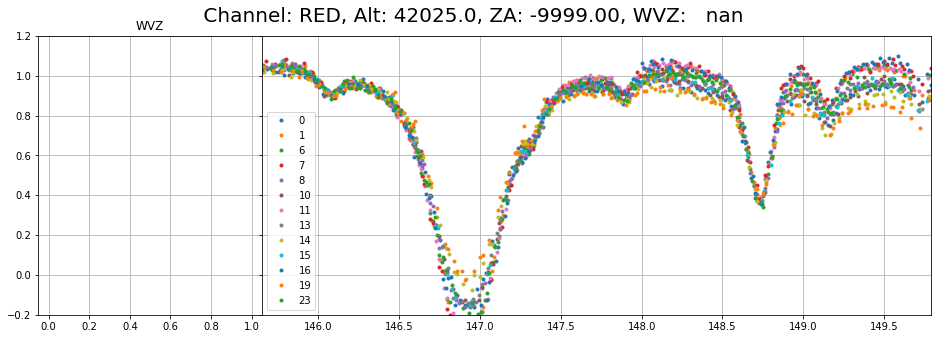

In [18]:
wt, atran, altitudes, wvs = atran2
imin = np.argmin(np.abs(altitudes-altitude))
at = atran[imin]
angle = za * np.pi/180.
cos_angle = np.cos(angle)
#depth = 1. / cos_angle  # Flat Earth approximation
r = 6383.5/50.  # assuming r_earth = 6371 km, altitude = 12.5 km, and 50 km of more stratosphere
rcos = r * cos_angle
depth = -rcos + np.sqrt(rcos * rcos + 1 + 2 * r) # Taking into account curvature of Earth


lc = [148.1,148.3]
lm = [146.7,146.9]
idmin = (wtot > lc[0]) & (wtot < lc[1])
idmax = (wtot > lm[0]) & (wtot < lm[1])
fmin = np.nanmean(ftot[idmin])
fmax = np.nanmean(ftot[idmax])
df = fmax - fmin
ftotabs = 1-(ftot-fmin)/df
# Normalize at the same way the ATRAN models
diff = []
idmin = (wt > lc[0]) & (wt < lc[1])
idmax = (wt > lm[0]) & (wt < lm[1])
for t,wv in zip(at,wvs):
    t = t**depth  # Apply the ZA
    tmax = np.nanmean(t[idmin])
    tmin = np.nanmean(t[idmax])
    t = (t-tmin)/(tmax-tmin)  # Normalize
    ti  = np.interp(wtot,wt,t)
    idx = ftotabs < 1.2
    diff.append(np.nansum((ti[idx] - ftotabs[idx])**2))
diff = np.array(diff)
imin = np.argmin(diff)
wvmin = wvs[imin]
try:
    x1=wvs[imin-1]
    x2=wvs[imin]
    x3=wvs[imin+1]
    y1=diff[imin-1]
    y2=diff[imin]   
    y3=diff[imin+1]
    b = np.array([[x1*x1,y1,1],[x2*x2,y2,1],[x3*x3,y3,1]])
    a = np.array([[y1,x1,1],[y2,x2,1],[y3,x3,1]])
    wvmin = -0.5 * np.linalg.det(b)/np.linalg.det(a)
except:
    pass

t = at[imin]**depth
tmax = np.nanmean(t[idmin])
tmin = np.nanmean(t[idmax])
t = (t-tmin)/(tmax-tmin) # Normalize
fig,axes = plt.subplots(1,2,figsize=(16,5),sharey=True, 
                            gridspec_kw = {'width_ratios': [2,6]})
ax=axes[0]
ax.set_title('WVZ')
ax.plot(wvs,diff/np.nanmax(diff))#,'o')
ax.grid()
ax=axes[1]
for j in good:
    ax.plot(np.ravel(waves[:,j,:]),1-(np.ravel(fluxes[:,j,:])-fmin)/df,'.',label=str(j))
    
ax.legend()
ax.set_ylim(-0.2,1.2)
        
ax.set_xlim(np.nanmin(wtot),np.nanmax(wtot))
ax.plot( wt,t,color='orange',linewidth=2)
ax.grid()
fig.suptitle(' Channel: '+str(detchan)+ ', Alt: '+str(altitude)+ ', ZA: '+'{:5.2f}'.format(za)+ 
                     ', WVZ: ' + '{:5.2f}'.format(wvmin), size=20)
plt.subplots_adjust(wspace=0)
fig.subplots_adjust(top=0.9) 
plt.show()





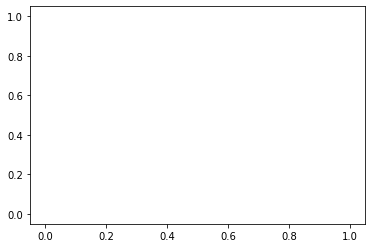

In [19]:
plt.plot(wt,t)

# Cycle for all flights

1  /  11


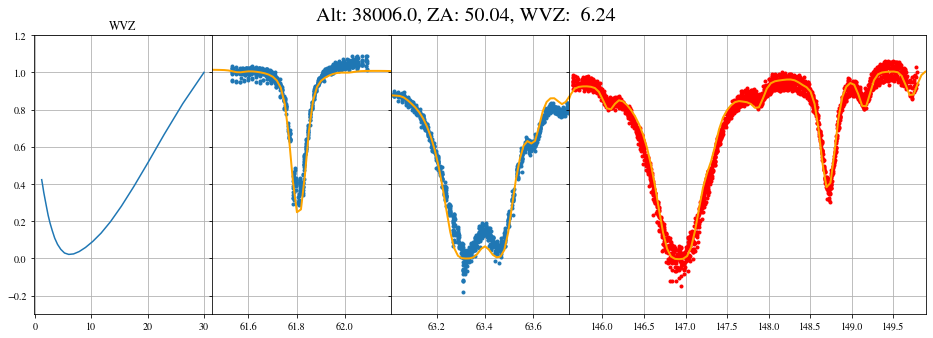

2  /  11


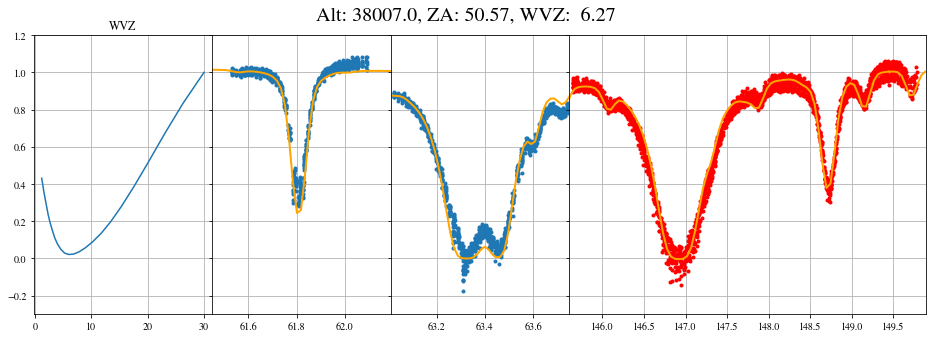

3  /  11


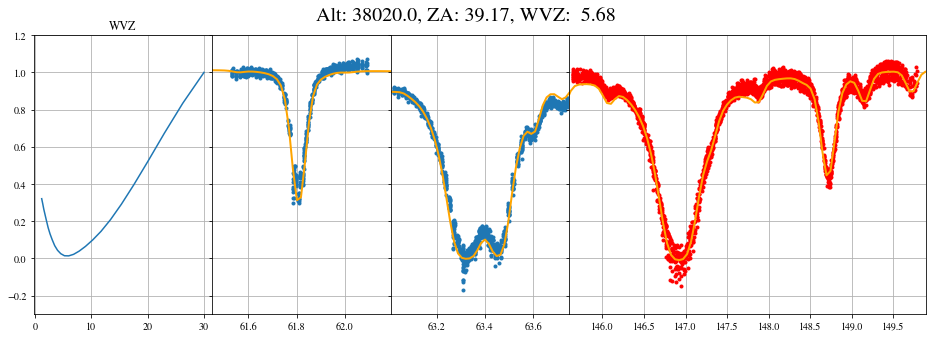

4  /  11


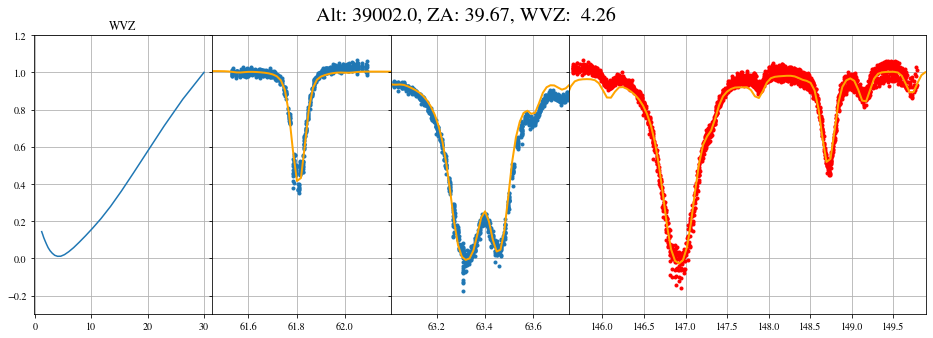

5  /  11


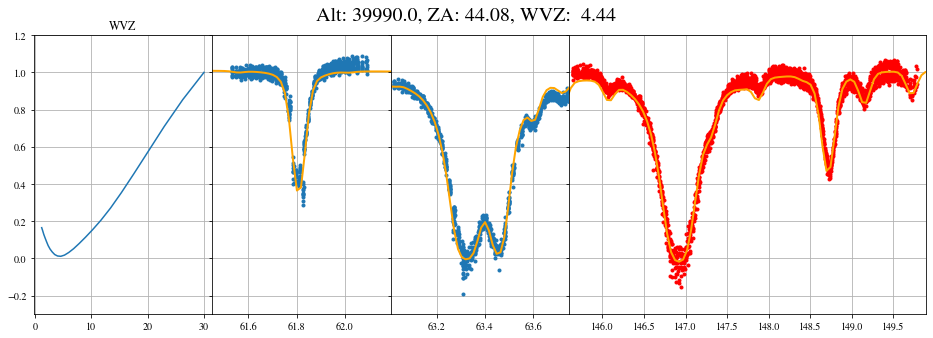

6  /  11


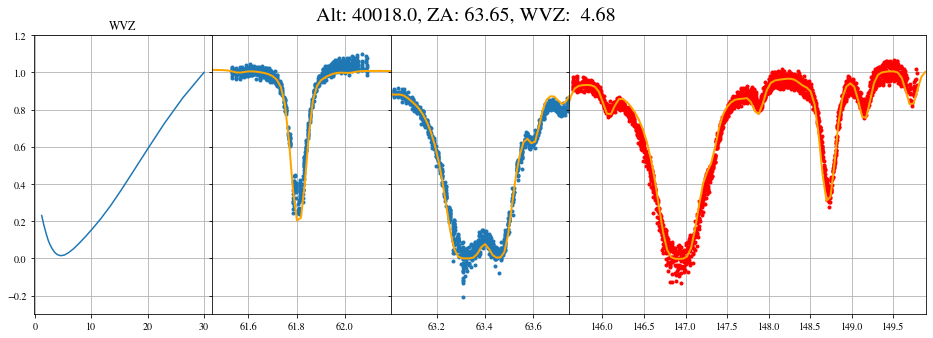

7  /  11


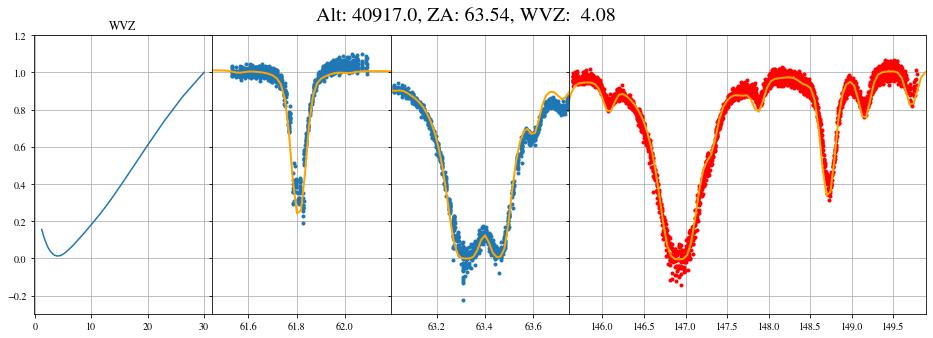

8  /  11


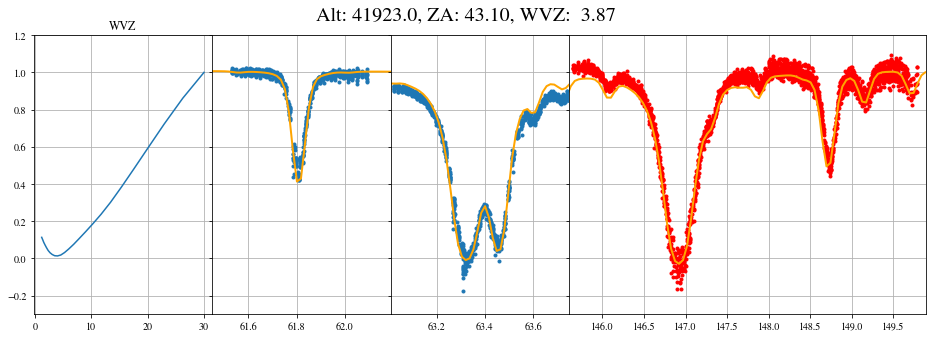

9  /  11


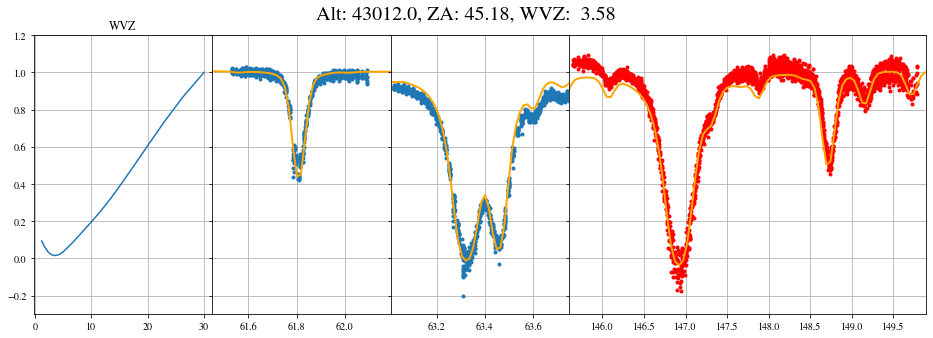

10  /  11


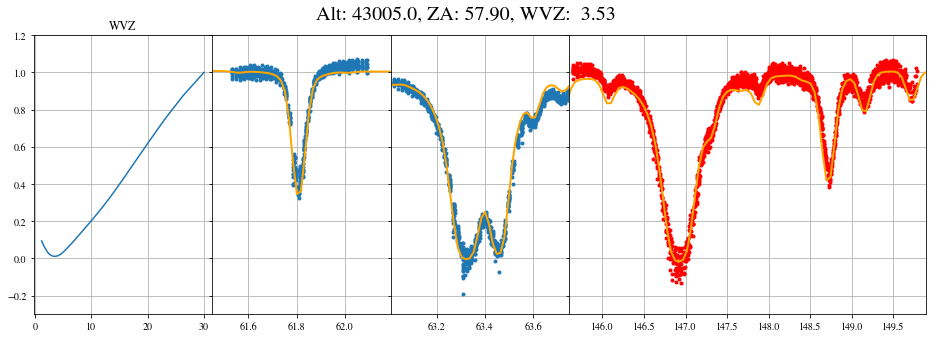

11  /  11


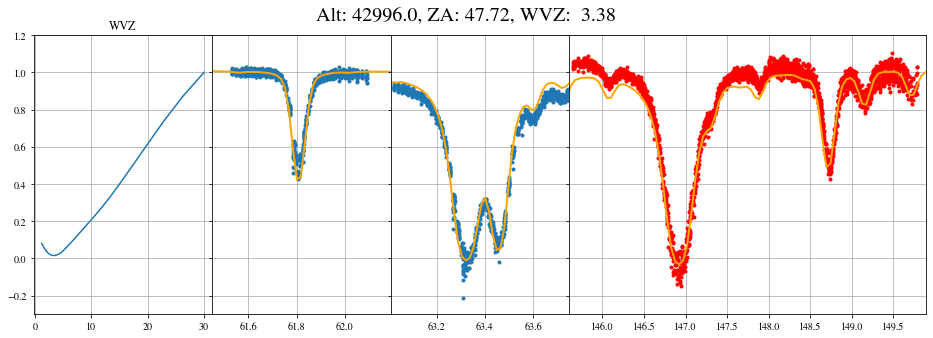

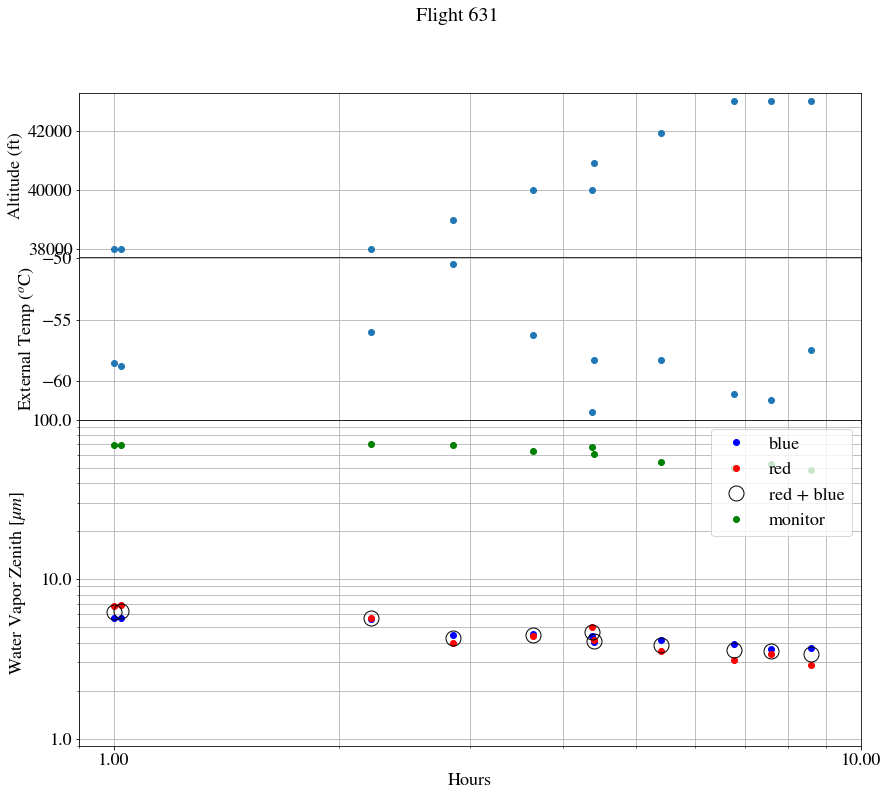

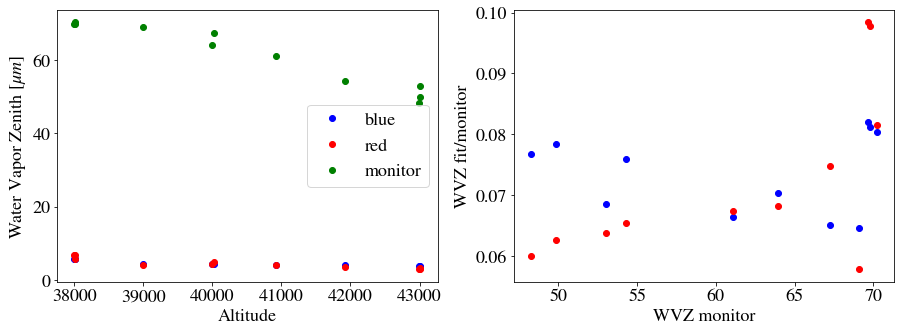

File  00005  Alt  38006.0 ft, WVZ: Blue  5.7  Red  6.8   Tot  6.2 
File  00010  Alt  38007.0 ft, WVZ: Blue  5.7  Red  6.9   Tot  6.3 
File  00102  Alt  38020.0 ft, WVZ: Blue  5.6  Red  5.7   Tot  5.7 
File  00233  Alt  39002.0 ft, WVZ: Blue  4.5  Red  4.0   Tot  4.3 
File  00300  Alt  39990.0 ft, WVZ: Blue  4.5  Red  4.4   Tot  4.4 
File  00305  Alt  40018.0 ft, WVZ: Blue  4.4  Red  5.0   Tot  4.7 
File  00310  Alt  40917.0 ft, WVZ: Blue  4.1  Red  4.1   Tot  4.1 
File  00375  Alt  41923.0 ft, WVZ: Blue  4.1  Red  3.6   Tot  3.9 
File  00489  Alt  43012.0 ft, WVZ: Blue  3.9  Red  3.1   Tot  3.6 
File  00552  Alt  43007.0 ft, WVZ: Blue  3.6  Red  3.4   Tot  3.5 
File  00631  Alt  42996.0 ft, WVZ: Blue  3.7  Red  2.9   Tot  3.4 
1  /  10


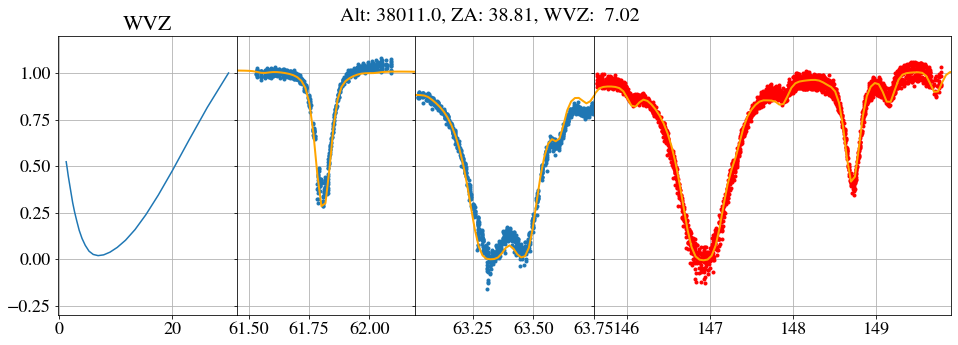

2  /  10


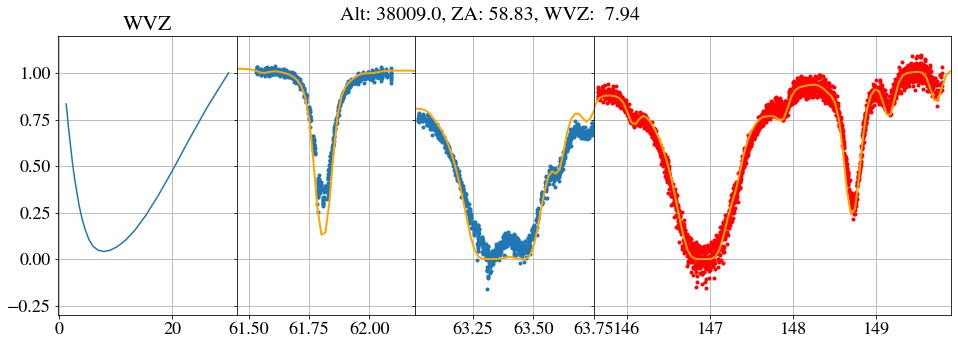

3  /  10


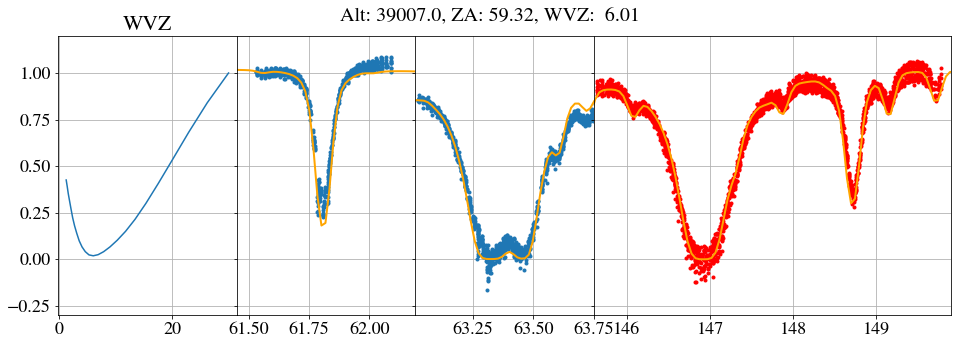

4  /  10


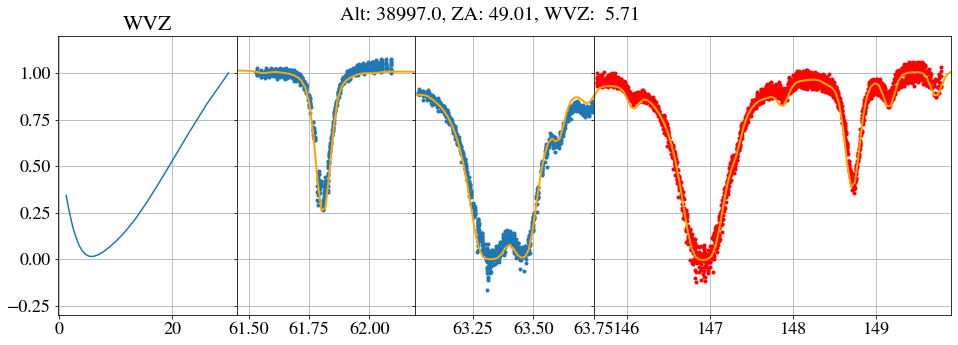

5  /  10


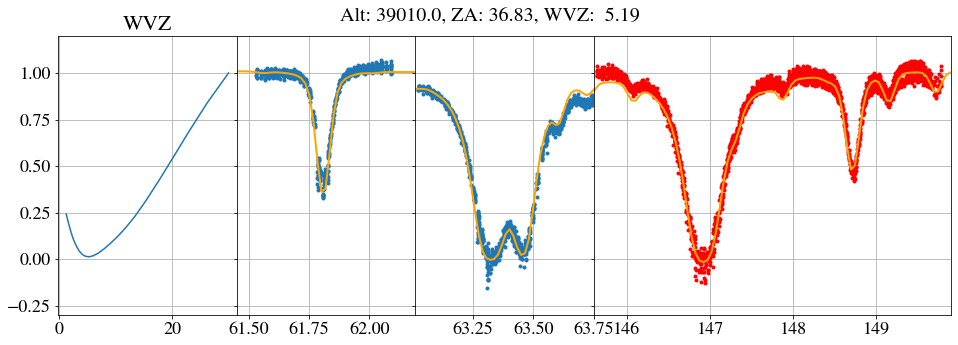

6  /  10


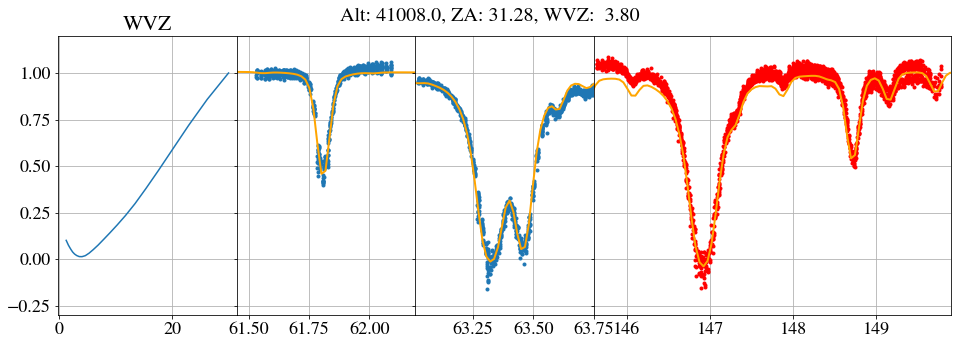

7  /  10


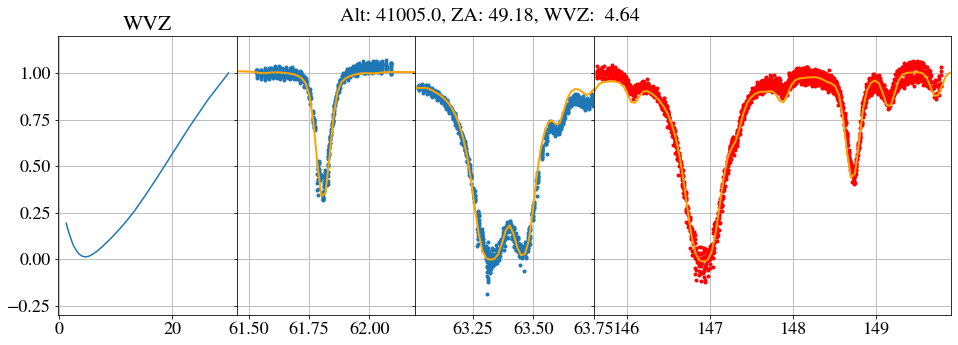

8  /  10


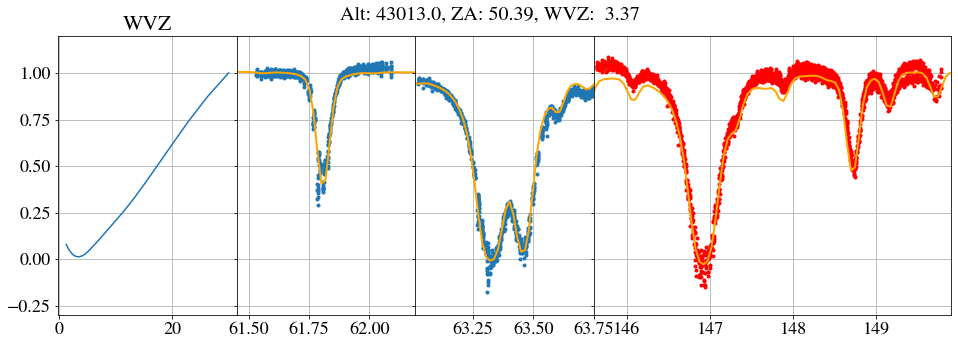

9  /  10


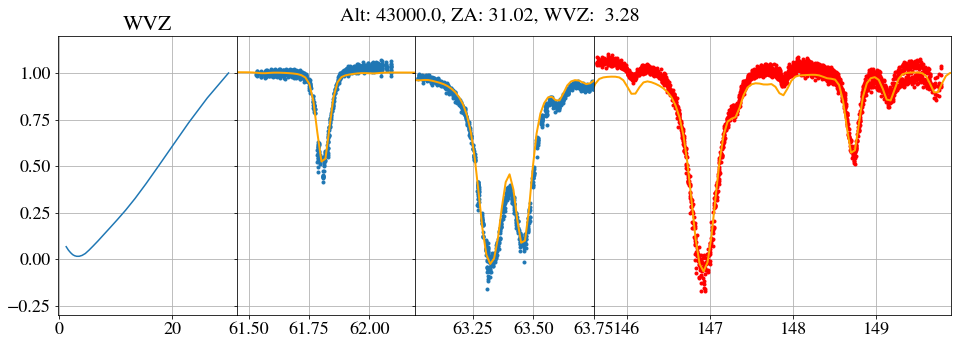

10  /  10


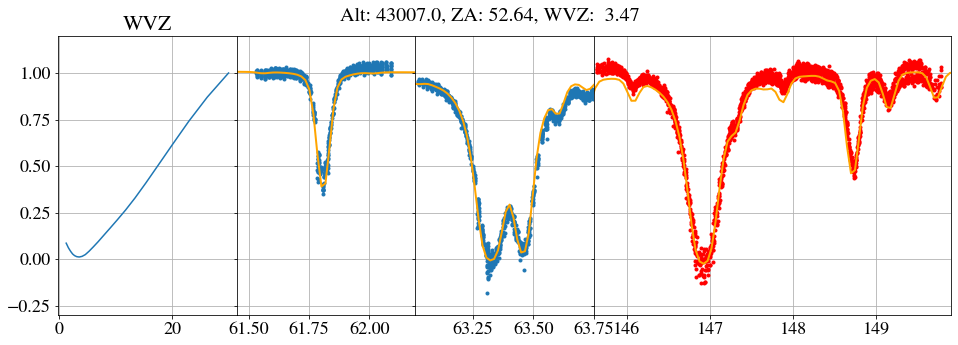

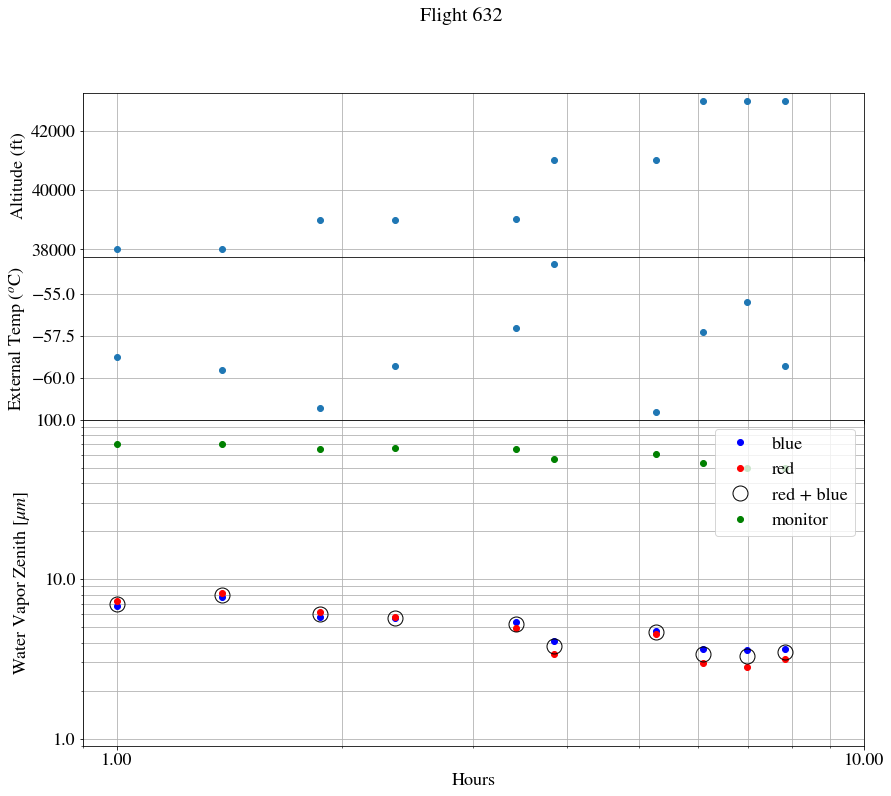

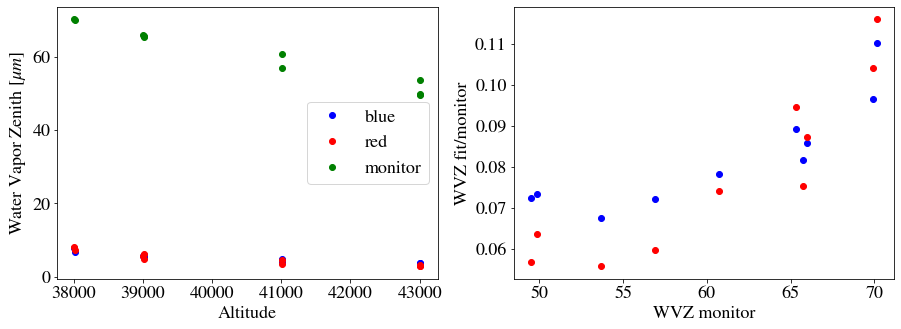

File  00005  Alt  38011.0 ft, WVZ: Blue  6.8  Red  7.3   Tot  7.0 
File  00010  Alt  38009.0 ft, WVZ: Blue  7.7  Red  8.1   Tot  7.9 
File  00052  Alt  39007.0 ft, WVZ: Blue  5.8  Red  6.2   Tot  6.0 
File  00091  Alt  38997.0 ft, WVZ: Blue  5.7  Red  5.7   Tot  5.7 
File  00182  Alt  39010.0 ft, WVZ: Blue  5.4  Red  5.0   Tot  5.2 
File  00213  Alt  41008.0 ft, WVZ: Blue  4.1  Red  3.4   Tot  3.8 
File  00326  Alt  41005.0 ft, WVZ: Blue  4.8  Red  4.5   Tot  4.6 
File  00394  Alt  43011.0 ft, WVZ: Blue  3.6  Red  3.0   Tot  3.4 
File  00452  Alt  43000.0 ft, WVZ: Blue  3.6  Red  2.8   Tot  3.3 
File  00605  Alt  43009.0 ft, WVZ: Blue  3.7  Red  3.2   Tot  3.5 
1  /  17


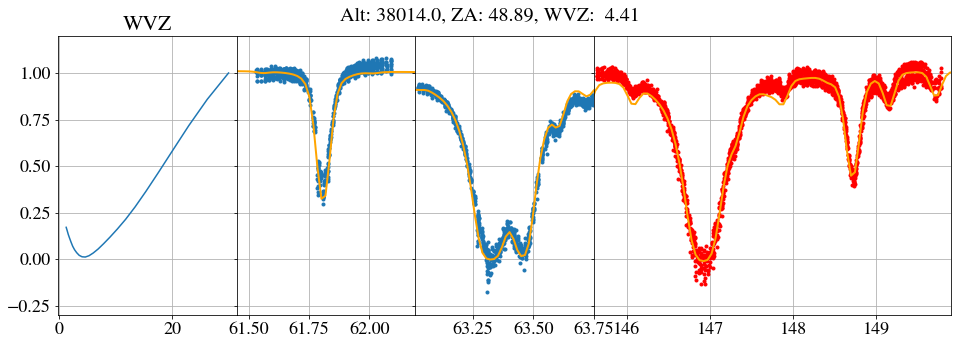

2  /  17


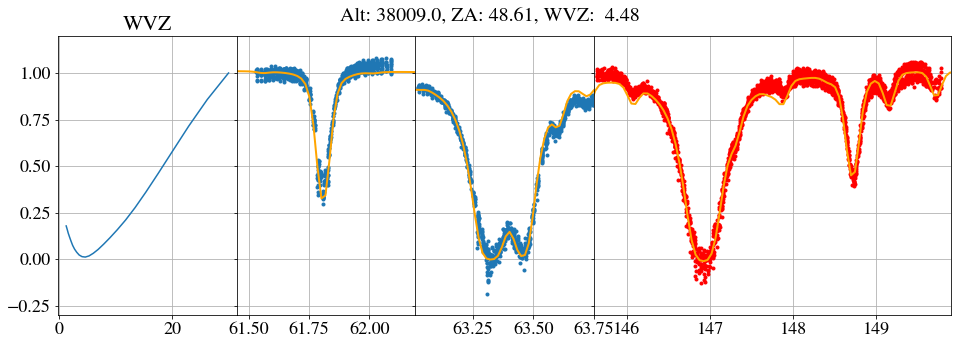

3  /  17


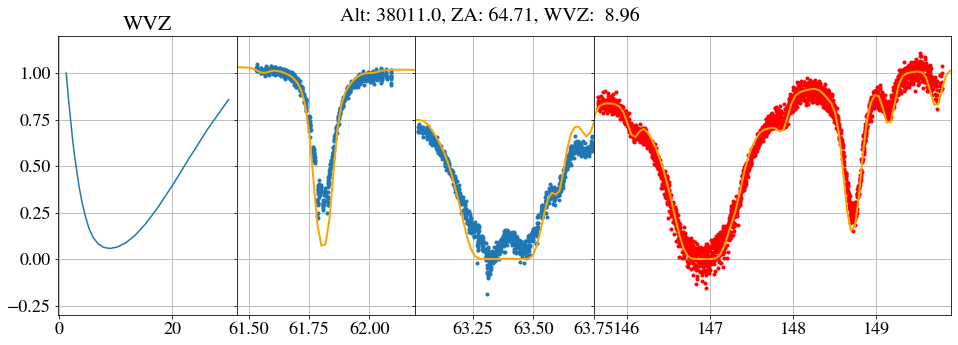

4  /  17


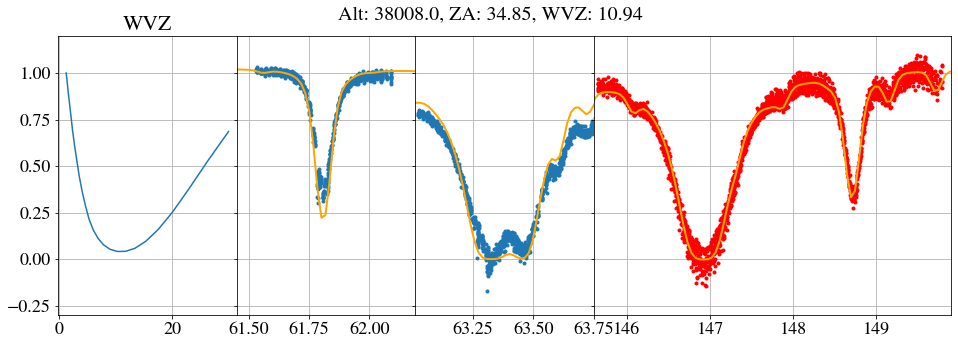

5  /  17


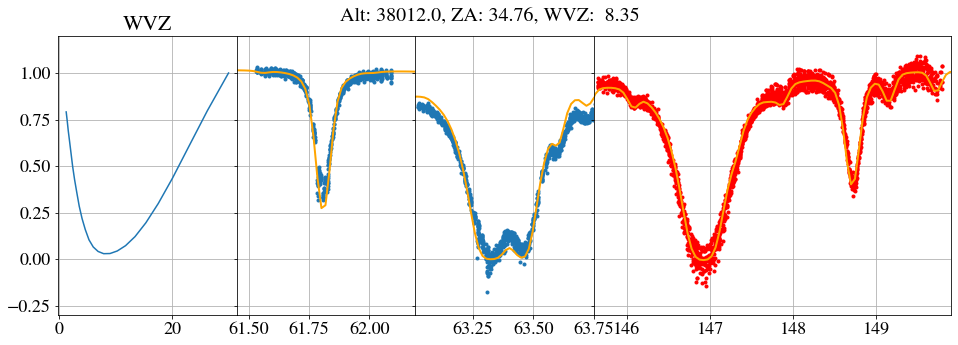

6  /  17


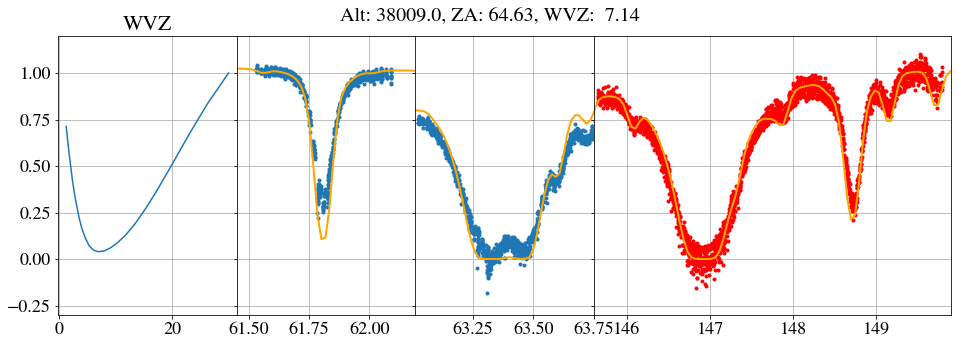

7  /  17


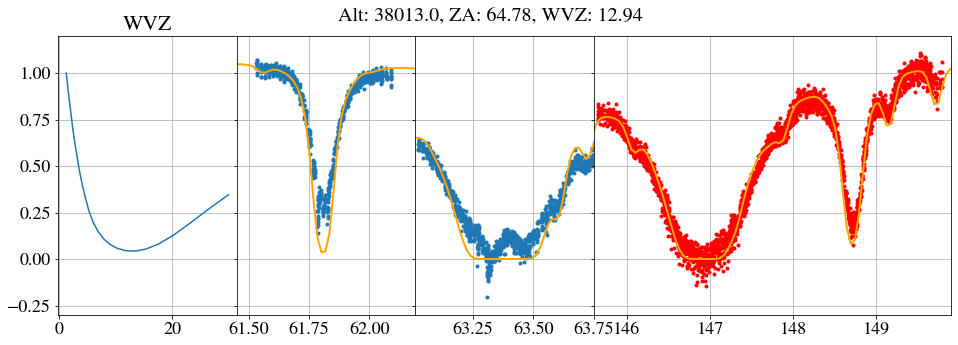

8  /  17


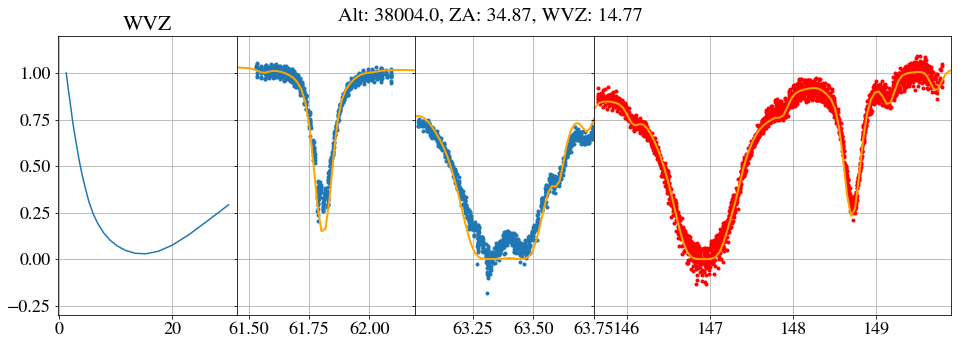

9  /  17


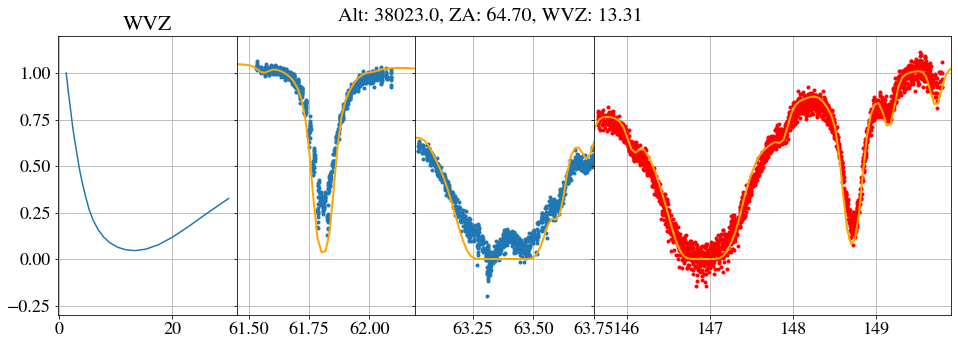

10  /  17


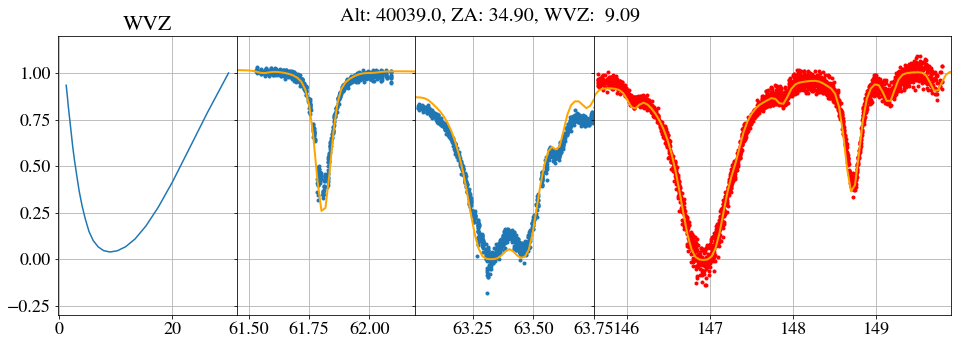

11  /  17


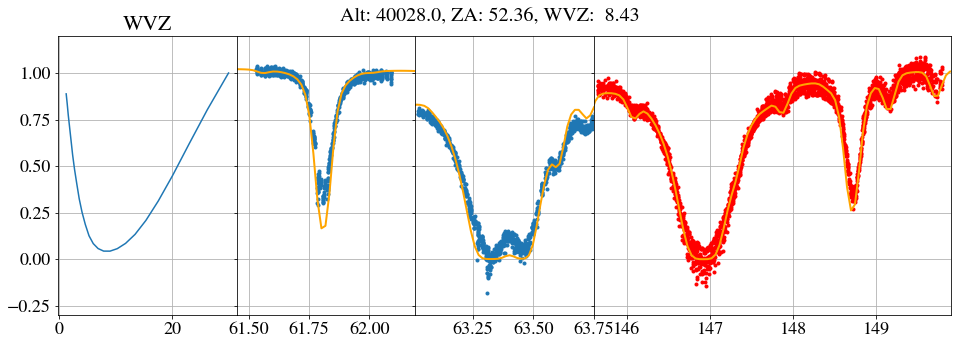

12  /  17


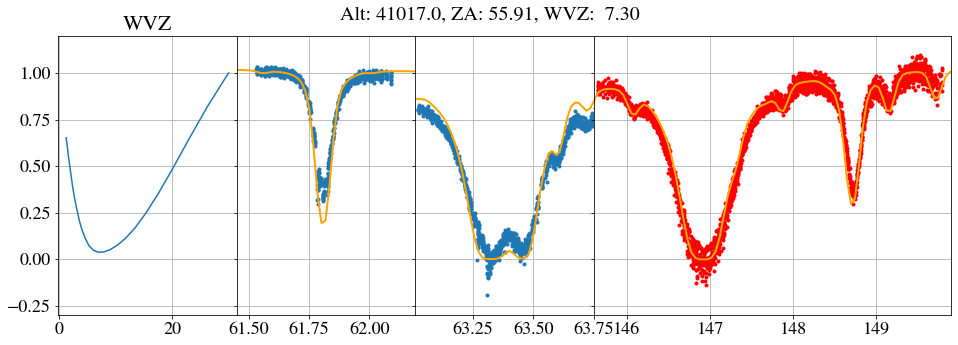

13  /  17


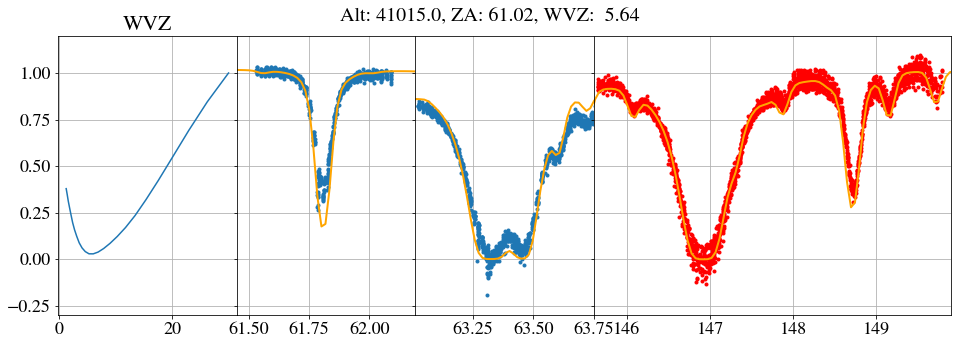

14  /  17


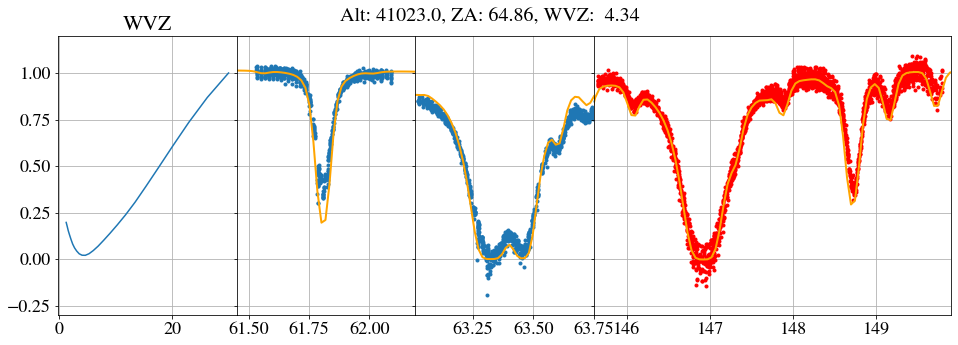

15  /  17


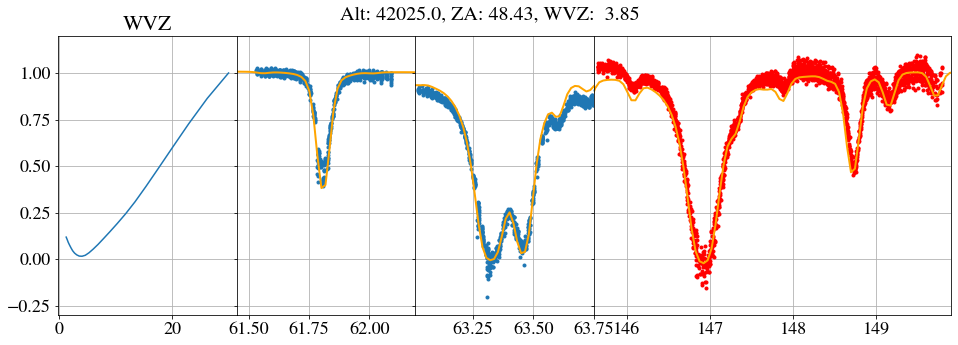

16  /  17


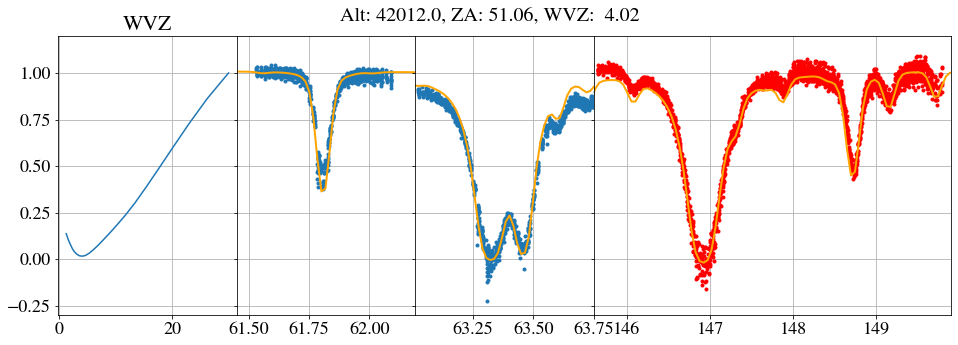

17  /  17


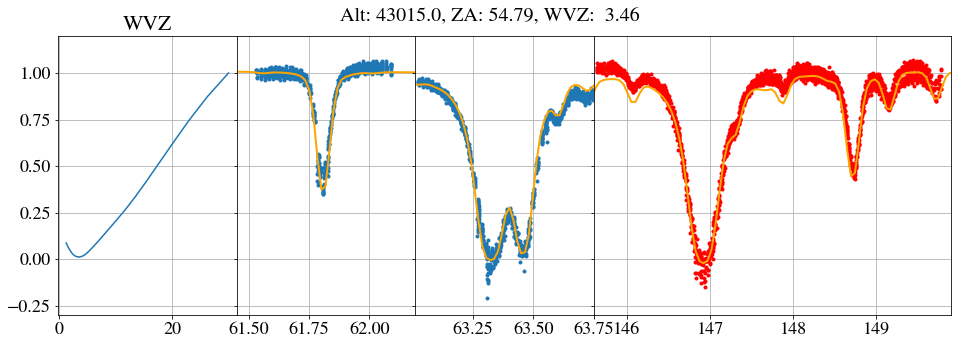

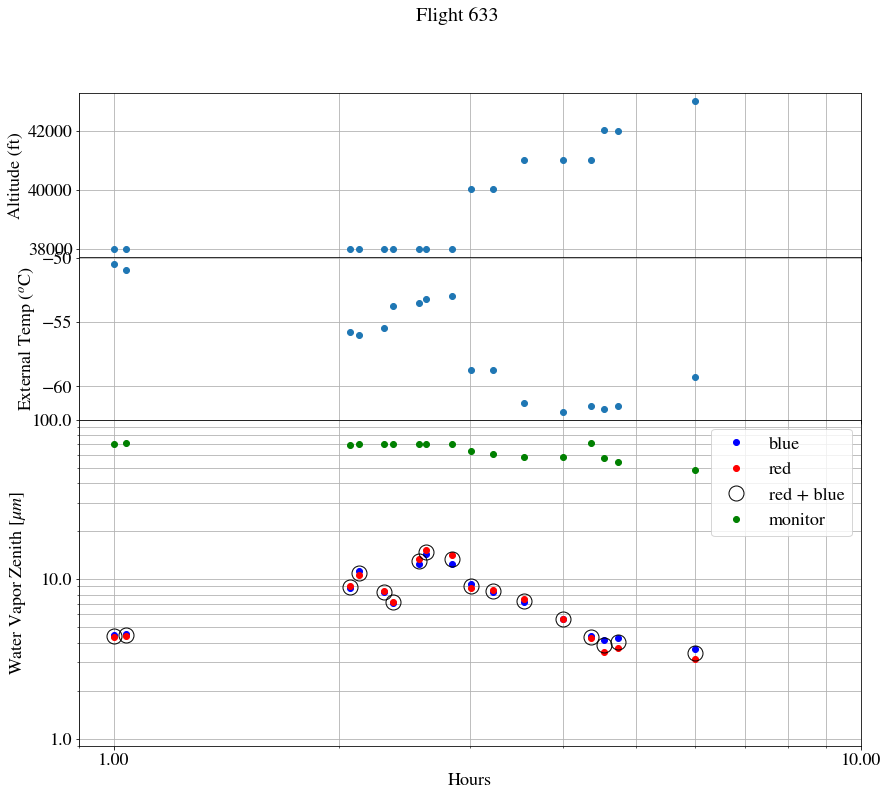

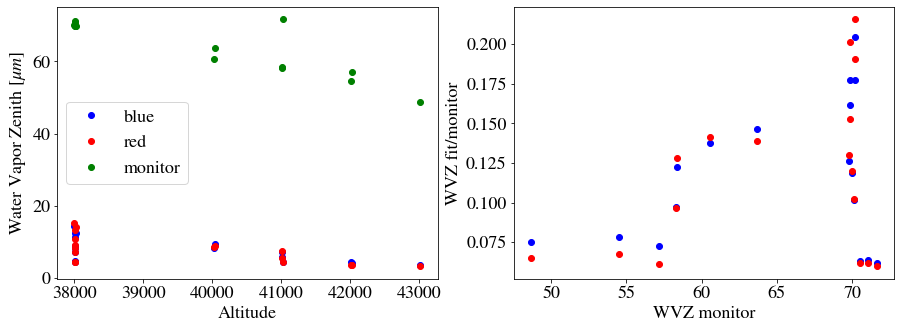

File  00014  Alt  38014.0 ft, WVZ: Blue  4.5  Red  4.4   Tot  4.4 
File  00019  Alt  38009.0 ft, WVZ: Blue  4.5  Red  4.4   Tot  4.5 
File  00181  Alt  38011.0 ft, WVZ: Blue  8.8  Red  9.1   Tot  9.0 
File  00192  Alt  38008.0 ft, WVZ: Blue 11.3  Red 10.7   Tot 10.9 
File  00222  Alt  38012.0 ft, WVZ: Blue  8.3  Red  8.4   Tot  8.3 
File  00233  Alt  38009.0 ft, WVZ: Blue  7.1  Red  7.2   Tot  7.1 
File  00268  Alt  38013.0 ft, WVZ: Blue 12.4  Red 13.4   Tot 12.9 
File  00279  Alt  38004.0 ft, WVZ: Blue 14.4  Red 15.1   Tot 14.8 
File  00317  Alt  38023.0 ft, WVZ: Blue 12.4  Red 14.1   Tot 13.3 
File  00352  Alt  40039.0 ft, WVZ: Blue  9.3  Red  8.8   Tot  9.1 
File  00357  Alt  40028.0 ft, WVZ: Blue  8.3  Red  8.5   Tot  8.4 
File  00386  Alt  41017.0 ft, WVZ: Blue  7.1  Red  7.5   Tot  7.3 
File  00428  Alt  41015.0 ft, WVZ: Blue  5.6  Red  5.6   Tot  5.6 
File  00455  Alt  41023.0 ft, WVZ: Blue  4.4  Red  4.3   Tot  4.3 
File  00466  Alt  42025.0 ft, WVZ: Blue  4.1  Red  3.5   Tot  

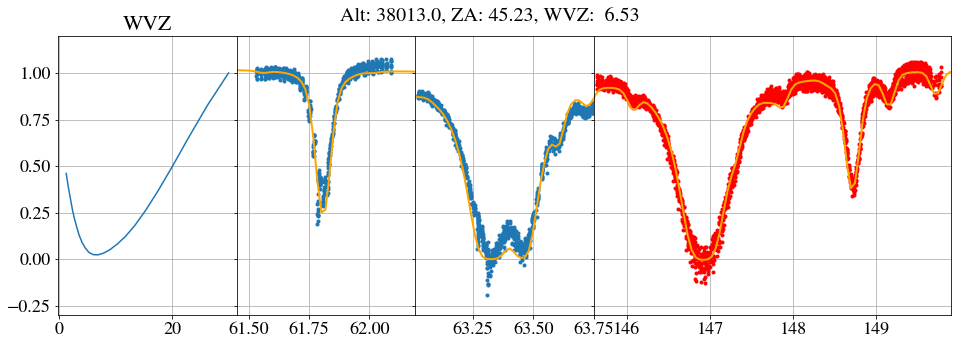

2  /  12


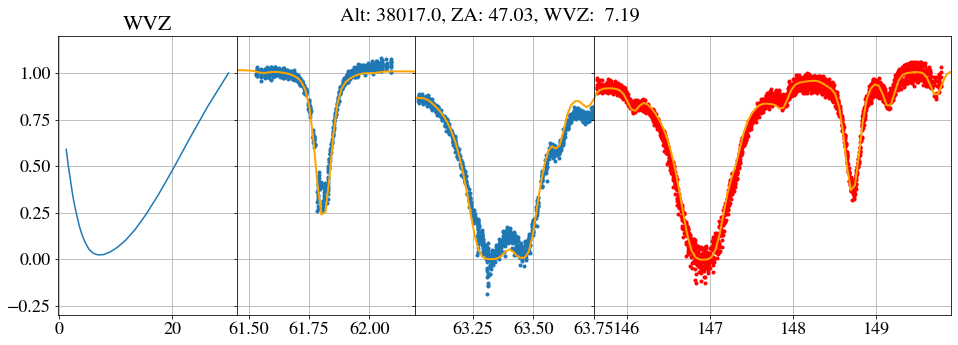

3  /  12


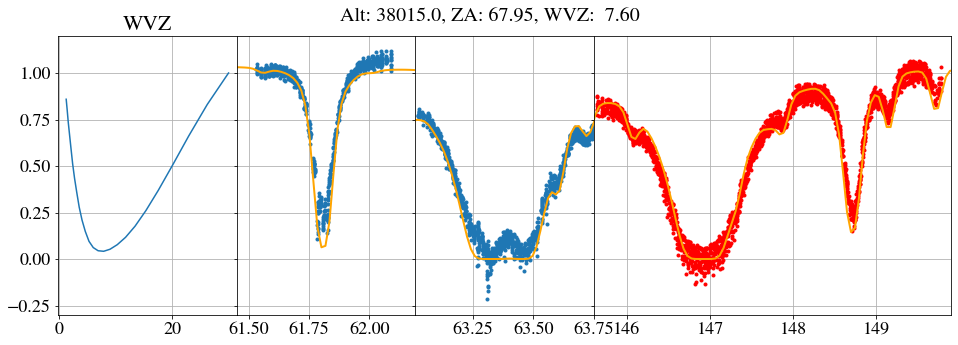

4  /  12


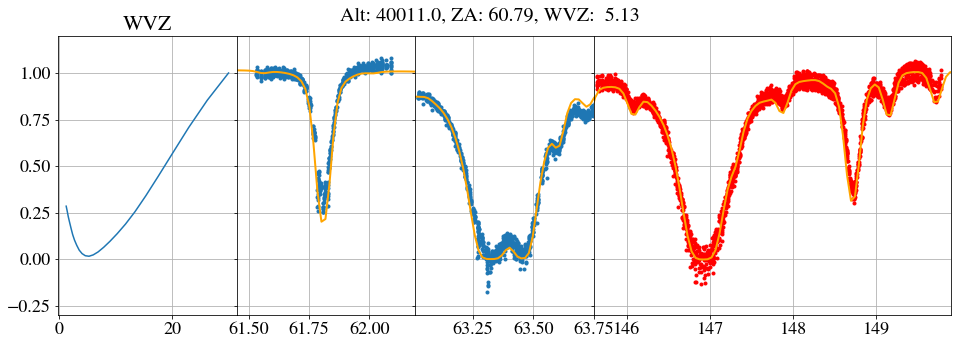

5  /  12


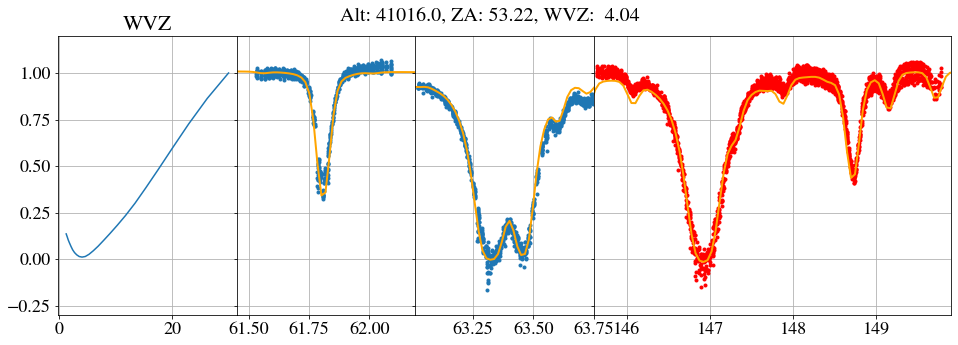

6  /  12


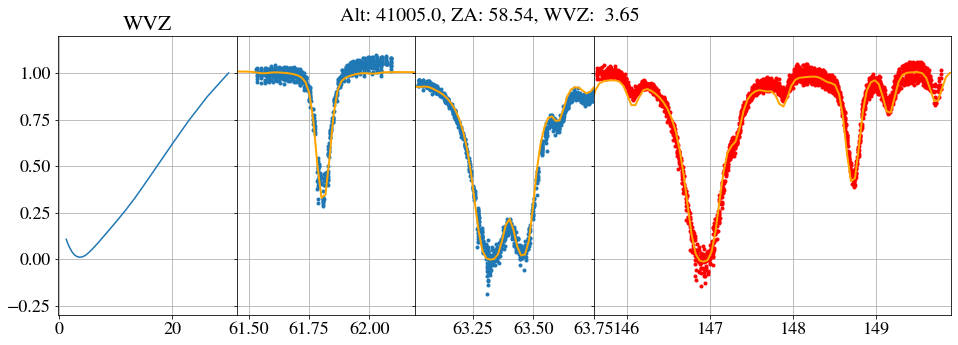

7  /  12


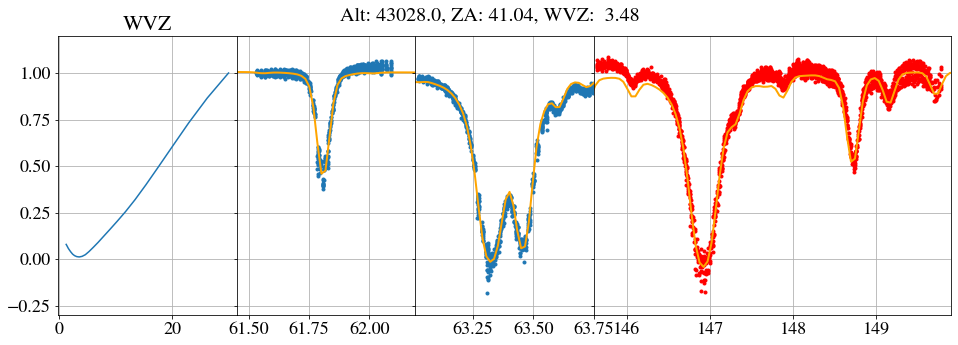

8  /  12


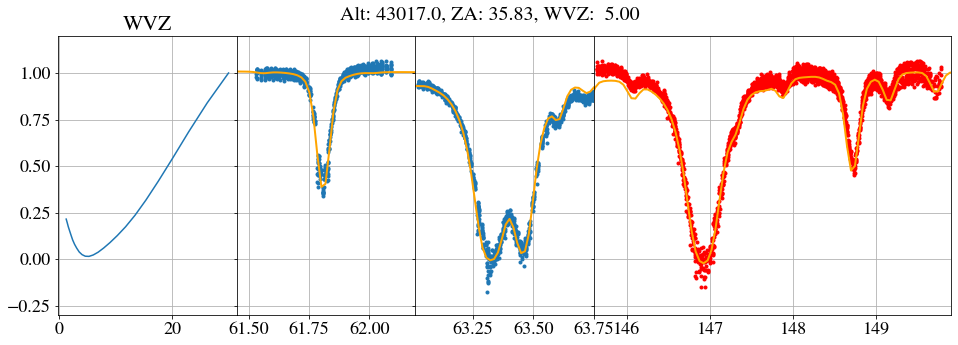

9  /  12


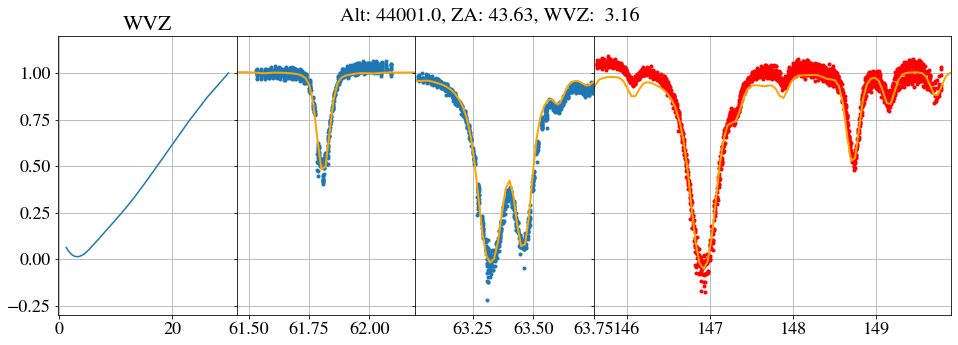

10  /  12


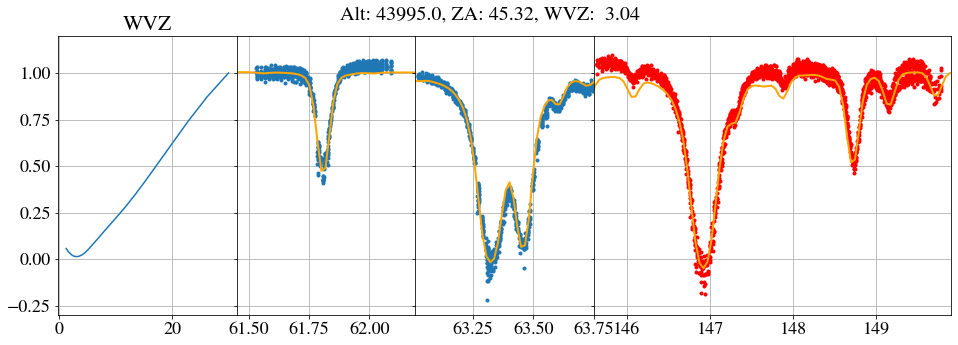

11  /  12


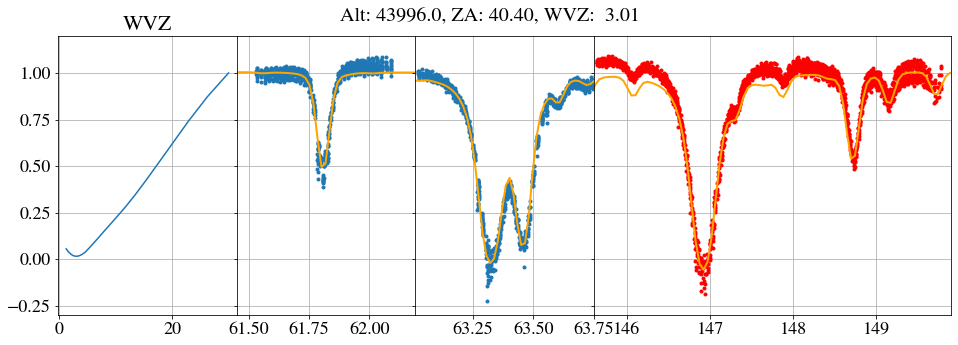

12  /  12


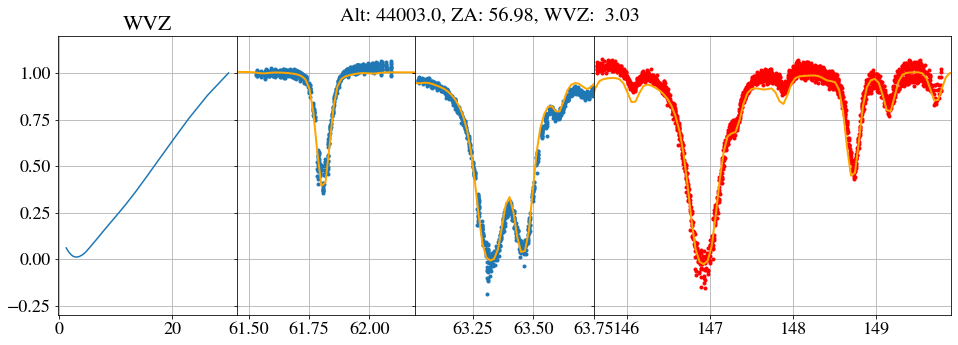

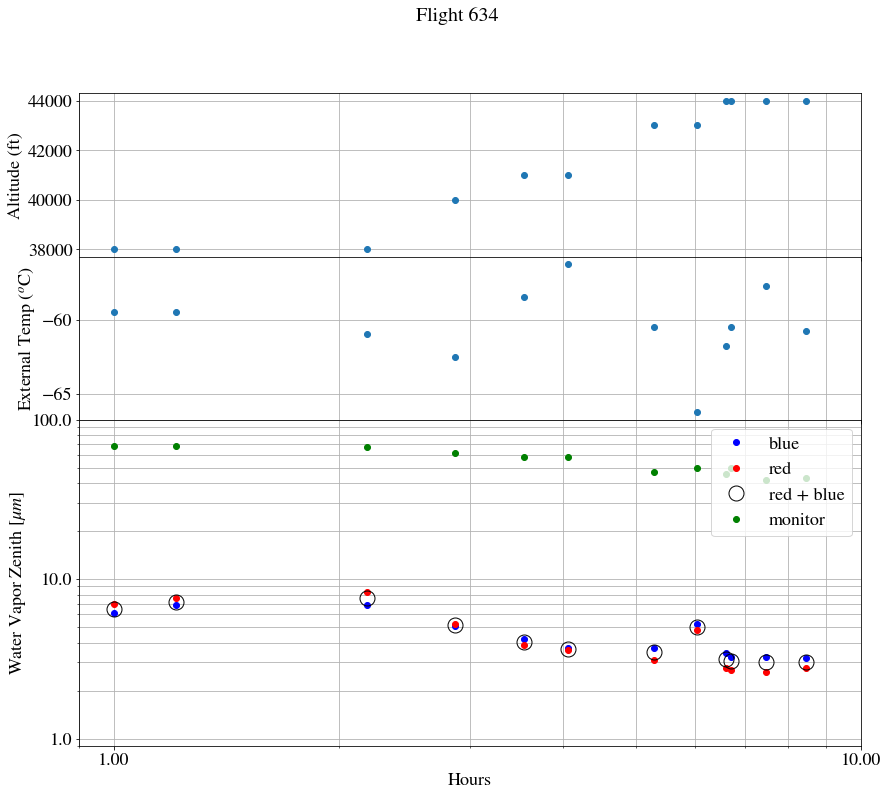

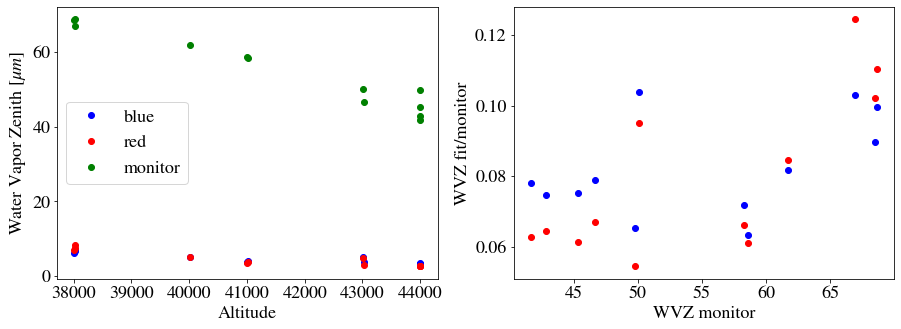

File  00005  Alt  38013.0 ft, WVZ: Blue  6.1  Red  7.0   Tot  6.5 
File  00010  Alt  38017.0 ft, WVZ: Blue  6.8  Red  7.6   Tot  7.2 
File  00081  Alt  38015.0 ft, WVZ: Blue  6.9  Red  8.3   Tot  7.6 
File  00142  Alt  40011.0 ft, WVZ: Blue  5.0  Red  5.2   Tot  5.1 
File  00203  Alt  41016.0 ft, WVZ: Blue  4.2  Red  3.8   Tot  4.0 
File  00244  Alt  41005.0 ft, WVZ: Blue  3.7  Red  3.6   Tot  3.7 
File  00349  Alt  43028.0 ft, WVZ: Blue  3.7  Red  3.1   Tot  3.5 
File  00410  Alt  43017.0 ft, WVZ: Blue  5.2  Red  4.8   Tot  5.0 
File  00457  Alt  44001.0 ft, WVZ: Blue  3.4  Red  2.8   Tot  3.2 
File  00462  Alt  43995.0 ft, WVZ: Blue  3.3  Red  2.7   Tot  3.0 
File  00523  Alt  43996.0 ft, WVZ: Blue  3.3  Red  2.6   Tot  3.0 
File  00586  Alt  44003.0 ft, WVZ: Blue  3.2  Red  2.8   Tot  3.0 
1  /  15


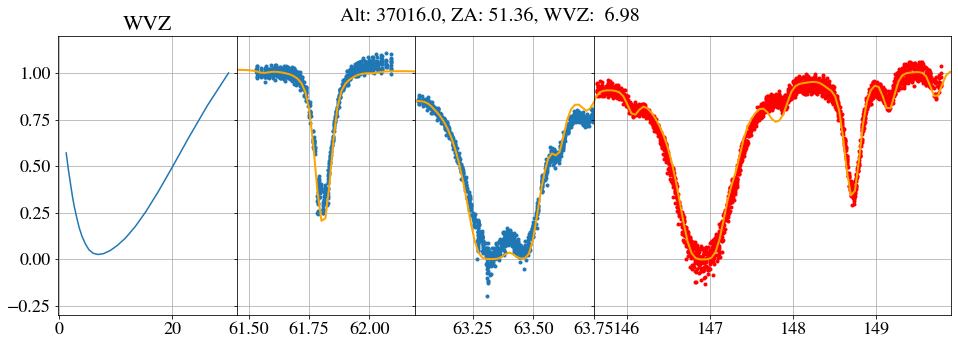

2  /  15


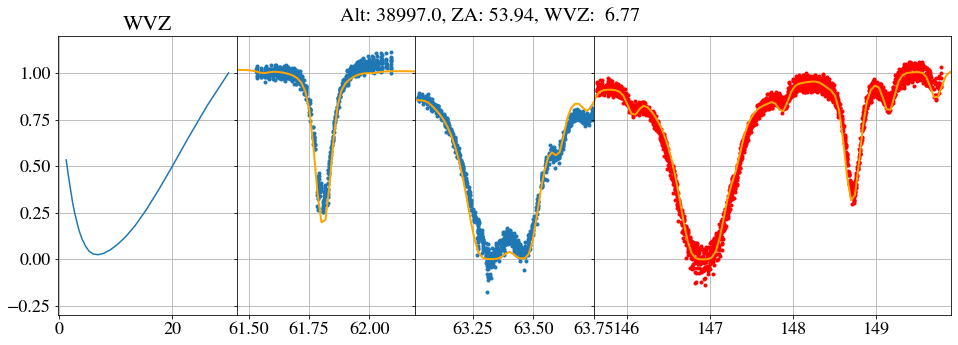

3  /  15


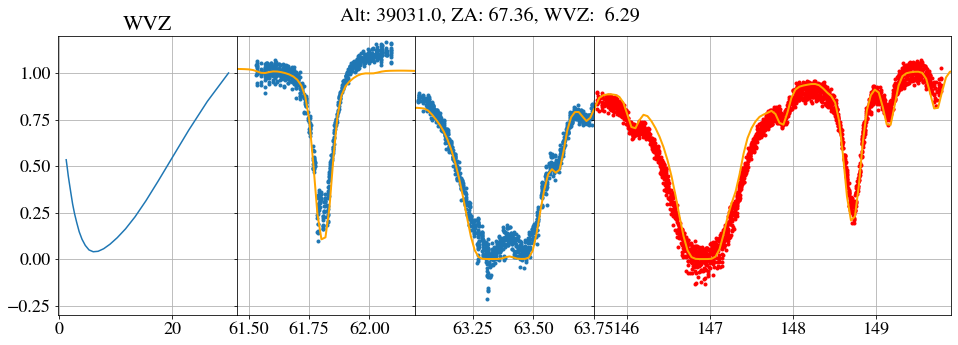

4  /  15


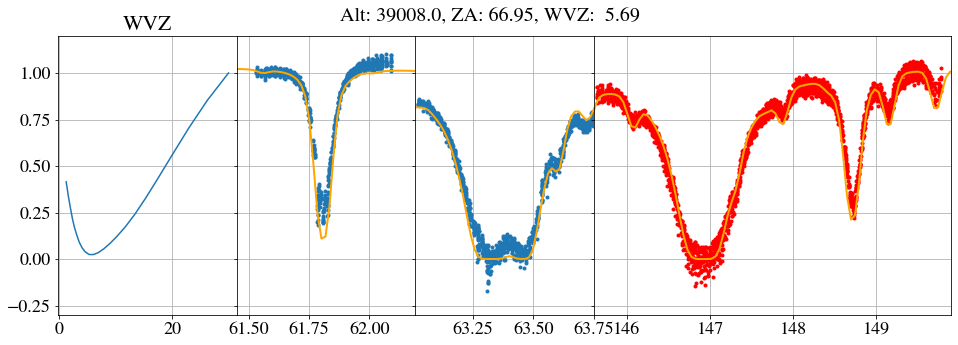

5  /  15


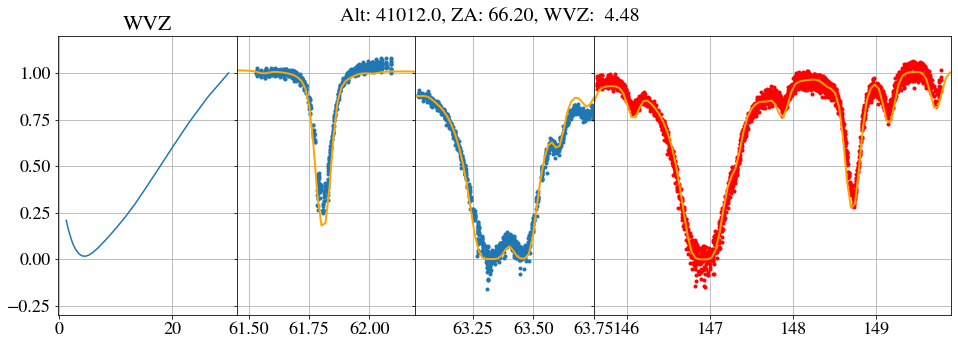

6  /  15


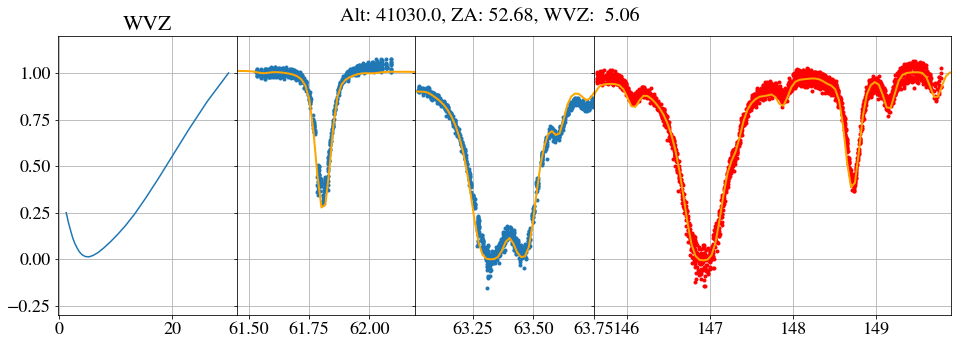

7  /  15


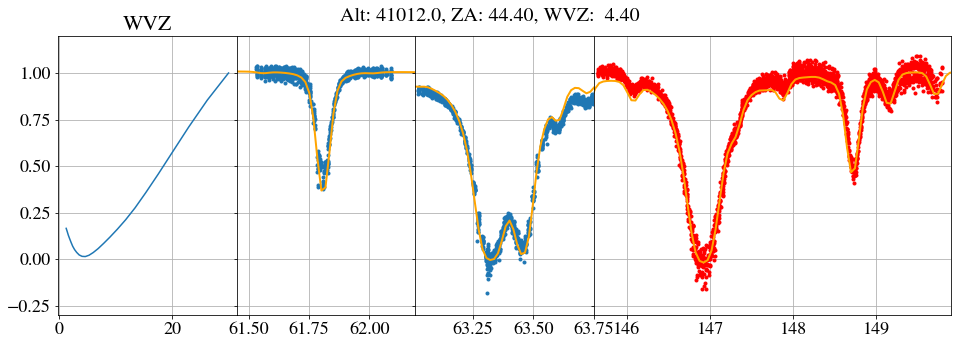

8  /  15


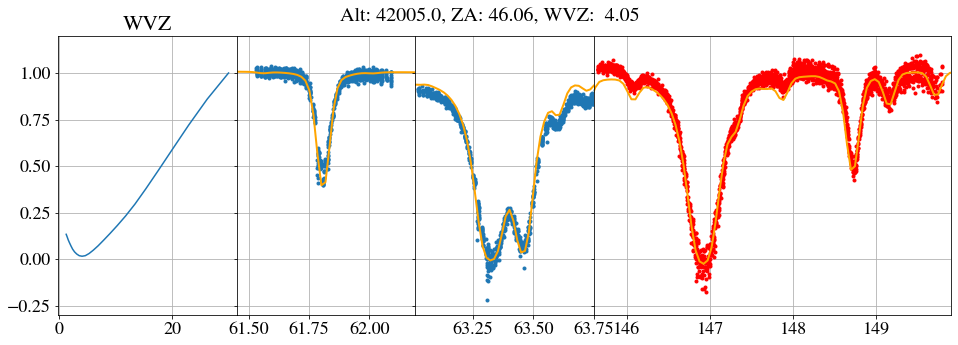

9  /  15


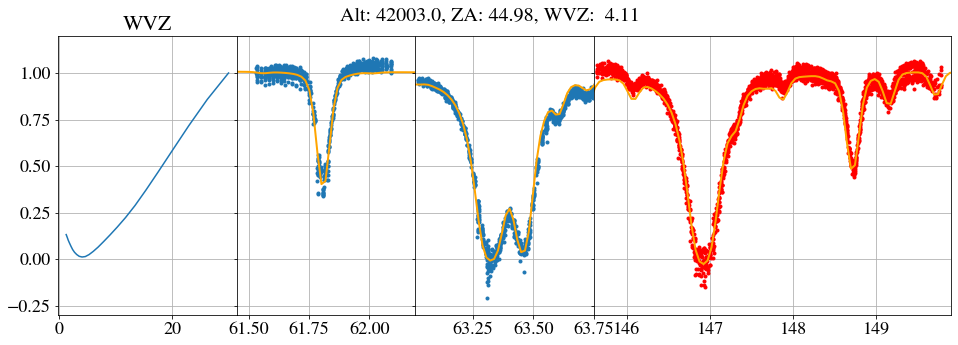

10  /  15


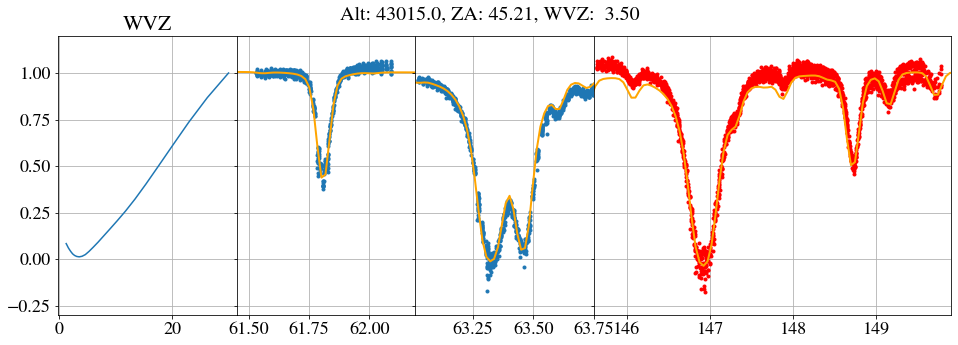

11  /  15


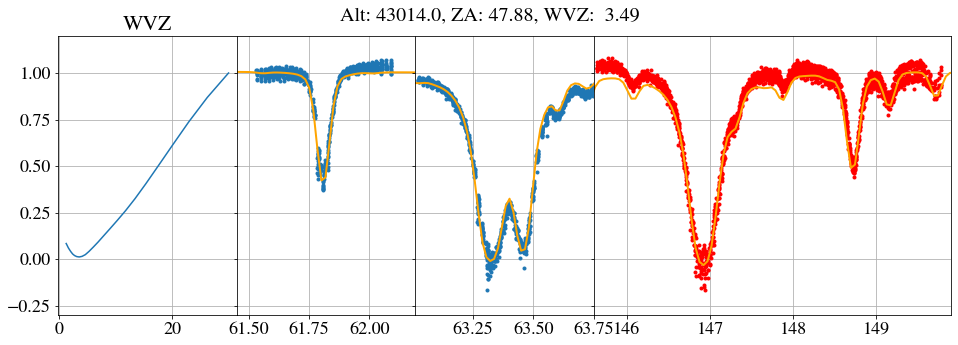

12  /  15


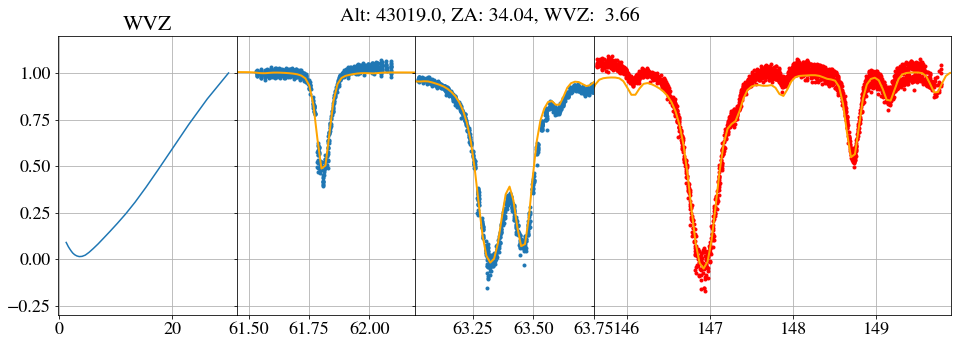

13  /  15


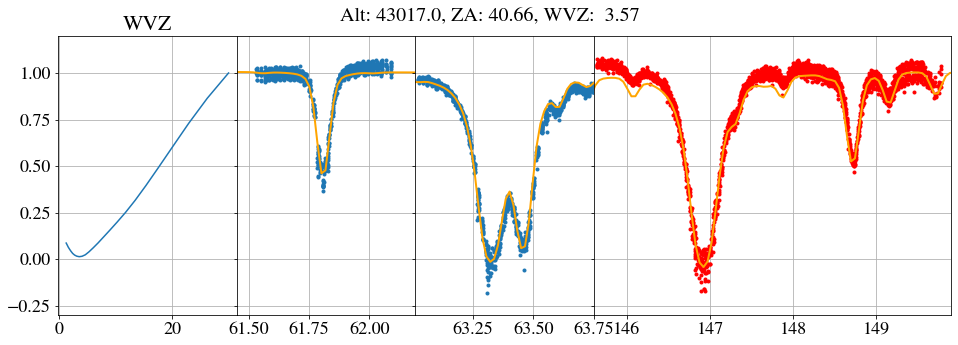

14  /  15


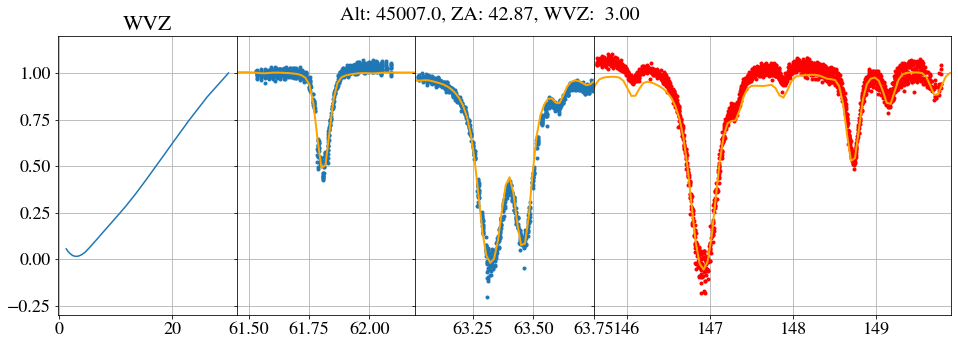

15  /  15


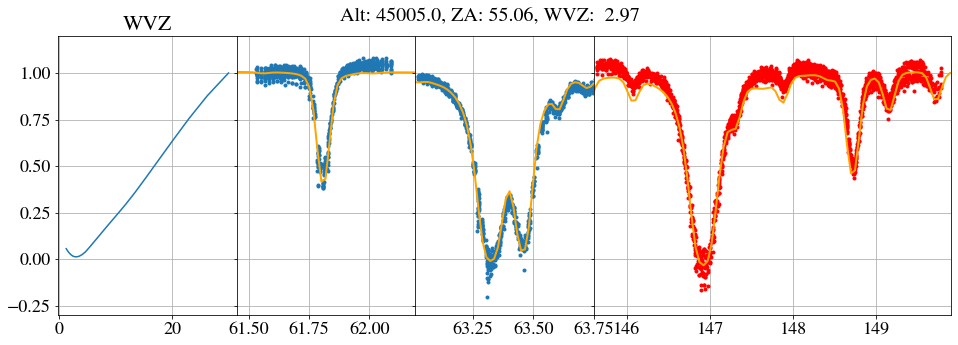

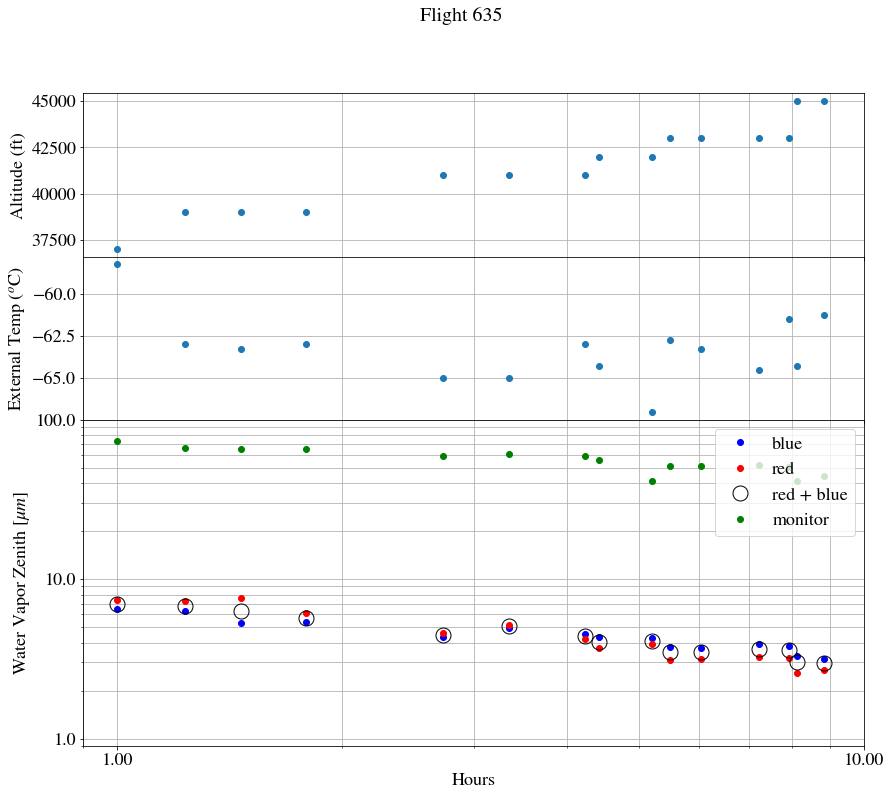

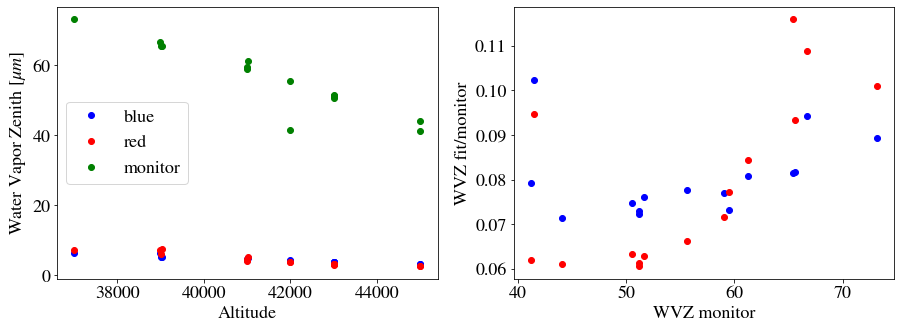

File  00003  Alt  37016.0 ft, WVZ: Blue  6.5  Red  7.4   Tot  7.0 
File  00008  Alt  38997.0 ft, WVZ: Blue  6.3  Red  7.2   Tot  6.8 
File  00037  Alt  39031.0 ft, WVZ: Blue  5.3  Red  7.6   Tot  6.3 
File  00066  Alt  39008.0 ft, WVZ: Blue  5.4  Red  6.1   Tot  5.7 
File  00151  Alt  41012.0 ft, WVZ: Blue  4.4  Red  4.6   Tot  4.5 
File  00200  Alt  41030.0 ft, WVZ: Blue  4.9  Red  5.2   Tot  5.1 
File  00273  Alt  41012.0 ft, WVZ: Blue  4.5  Red  4.2   Tot  4.4 
File  00290  Alt  42005.0 ft, WVZ: Blue  4.3  Red  3.7   Tot  4.1 
File  00356  Alt  42003.0 ft, WVZ: Blue  4.2  Red  3.9   Tot  4.1 
File  00381  Alt  43015.0 ft, WVZ: Blue  3.7  Red  3.1   Tot  3.5 
File  00428  Alt  43014.0 ft, WVZ: Blue  3.7  Red  3.1   Tot  3.5 
File  00527  Alt  43019.0 ft, WVZ: Blue  3.9  Red  3.2   Tot  3.7 
File  00584  Alt  43017.0 ft, WVZ: Blue  3.8  Red  3.2   Tot  3.6 
File  00601  Alt  45007.0 ft, WVZ: Blue  3.3  Red  2.6   Tot  3.0 
File  00660  Alt  45005.0 ft, WVZ: Blue  3.1  Red  2.7   Tot  

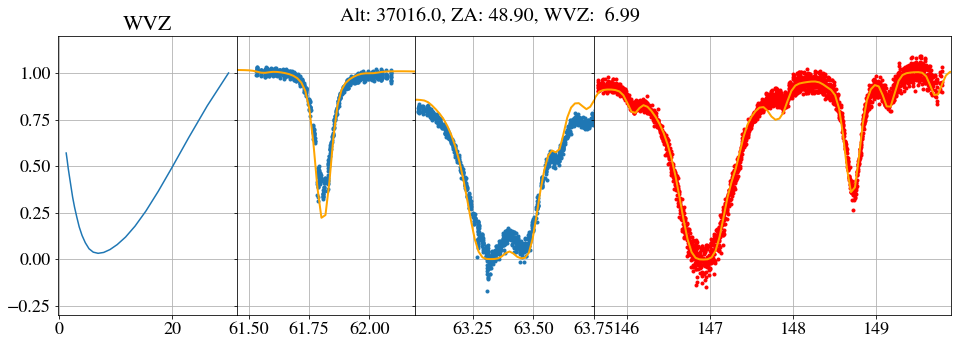

2  /  8


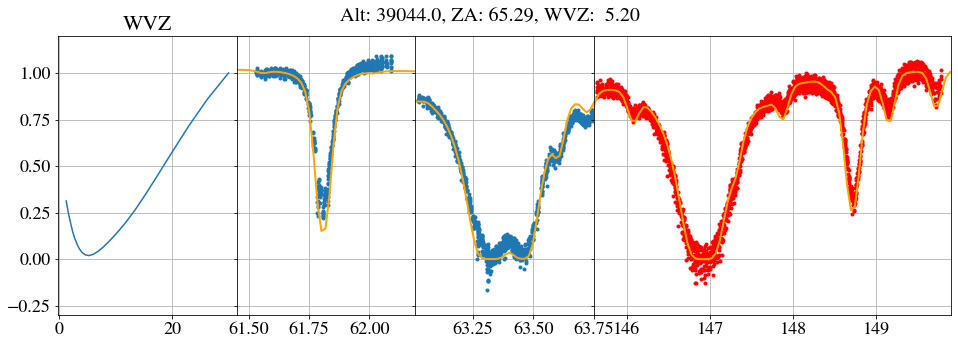

3  /  8


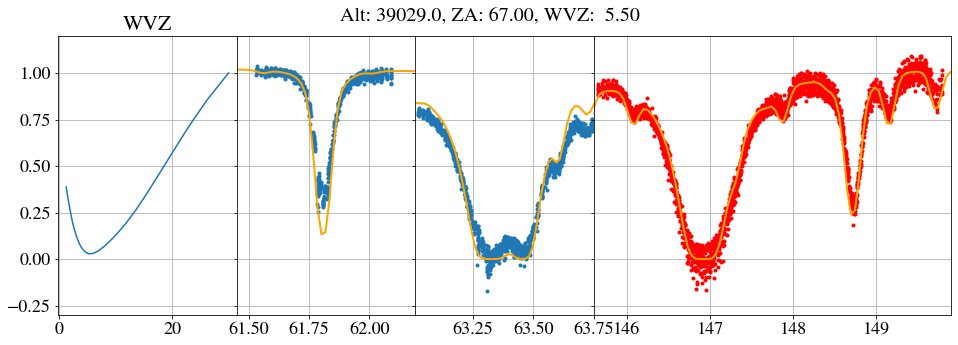

4  /  8


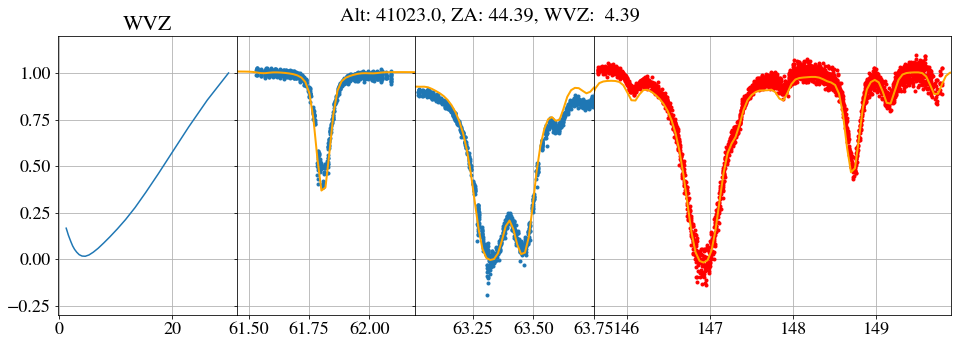

5  /  8


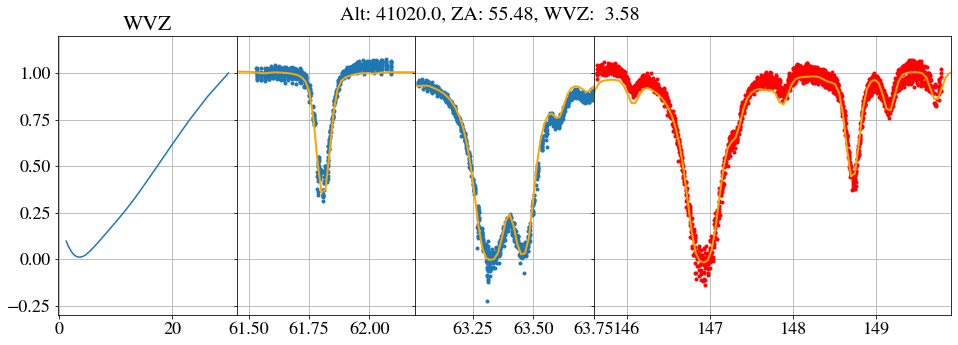

6  /  8


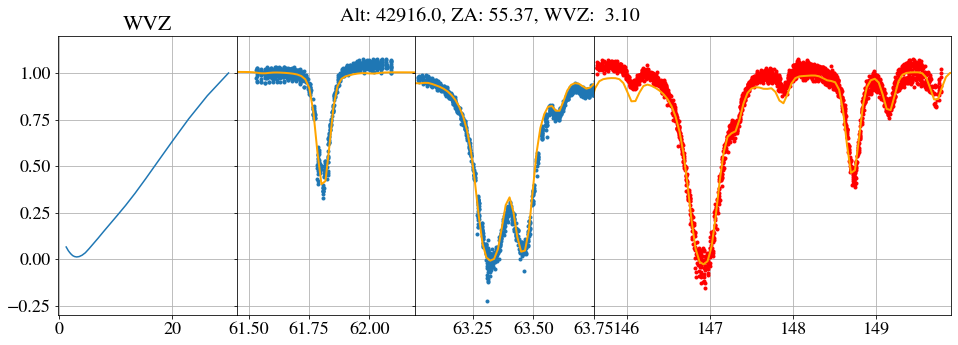

7  /  8


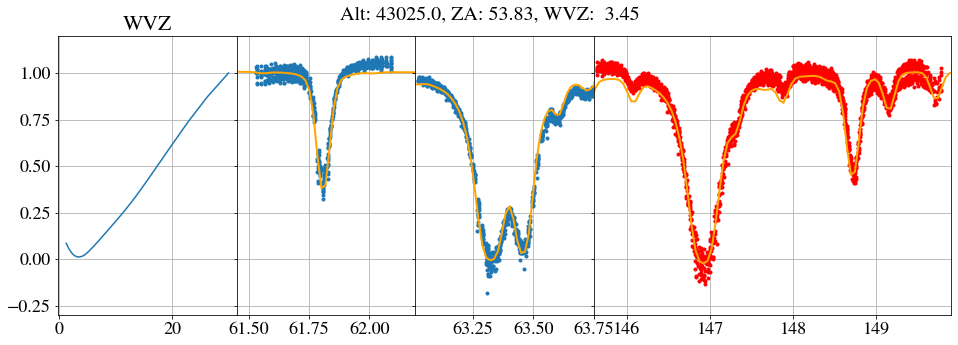

8  /  8


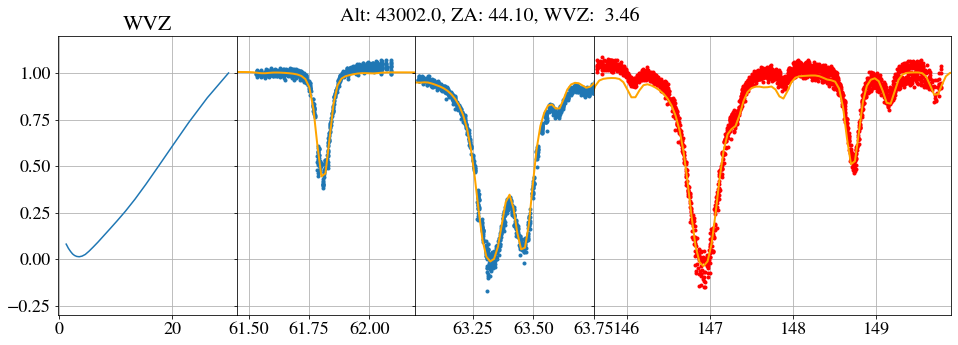

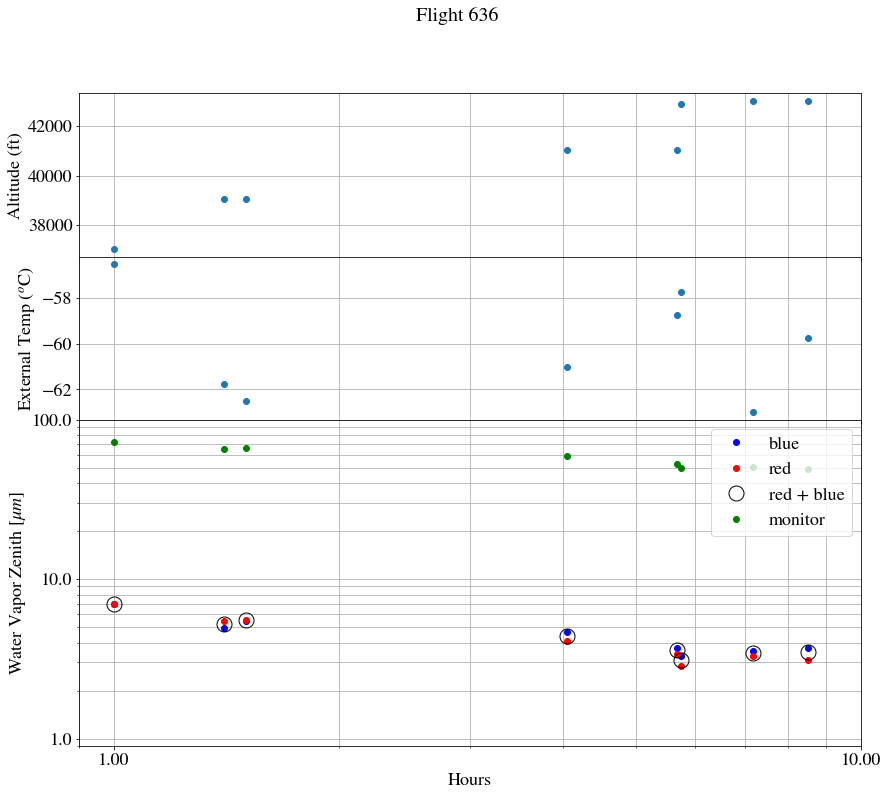

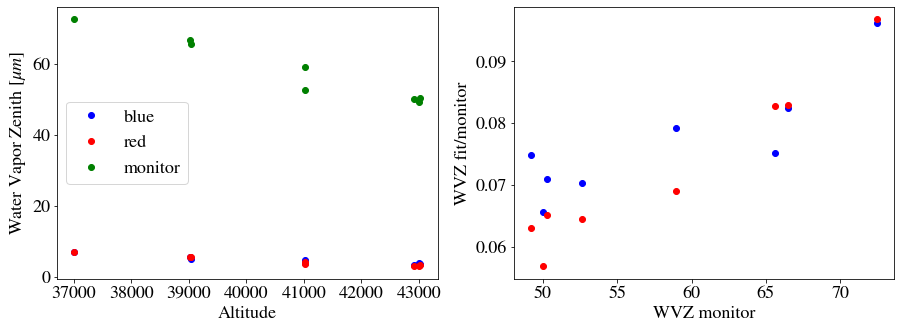

File  00005  Alt  37016.0 ft, WVZ: Blue  7.0  Red  7.0   Tot  7.0 
File  00046  Alt  39044.0 ft, WVZ: Blue  4.9  Red  5.4   Tot  5.2 
File  00051  Alt  39029.0 ft, WVZ: Blue  5.5  Red  5.5   Tot  5.5 
File  00265  Alt  41023.0 ft, WVZ: Blue  4.7  Red  4.1   Tot  4.4 
File  00641  Alt  41020.0 ft, WVZ: Blue  3.7  Red  3.4   Tot  3.6 
File  00646  Alt  42916.0 ft, WVZ: Blue  3.3  Red  2.8   Tot  3.1 
File  00771  Alt  43025.0 ft, WVZ: Blue  3.6  Red  3.3   Tot  3.5 
File  00878  Alt  43002.0 ft, WVZ: Blue  3.7  Red  3.1   Tot  3.5 
1  /  6


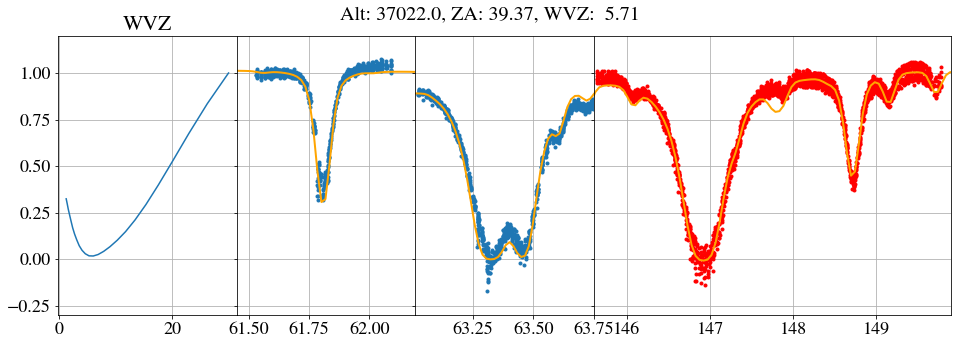

2  /  6


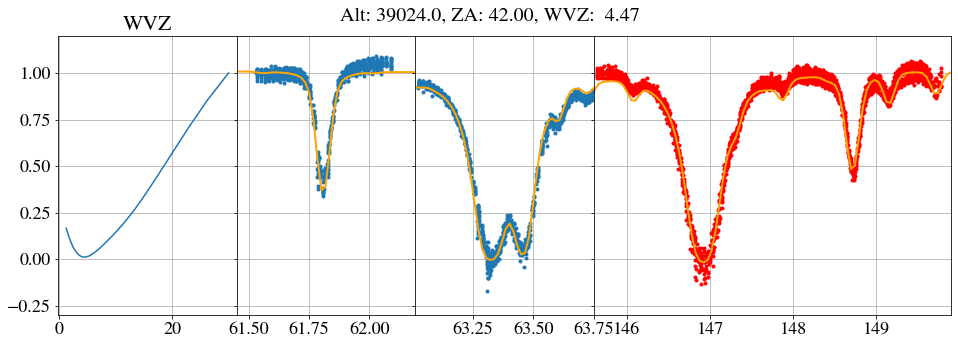

3  /  6


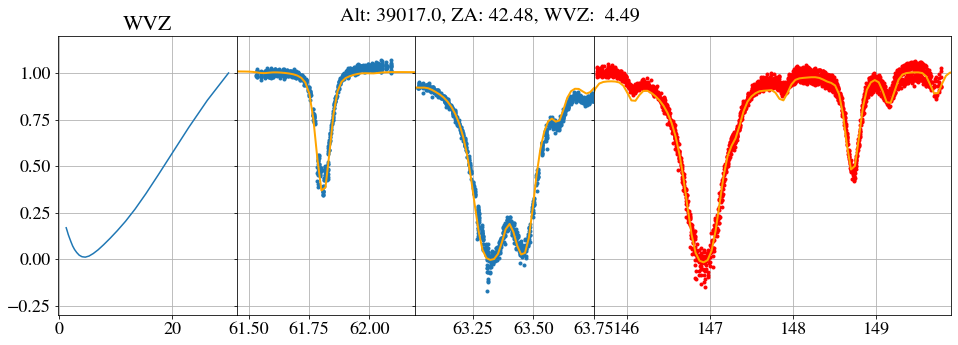

4  /  6


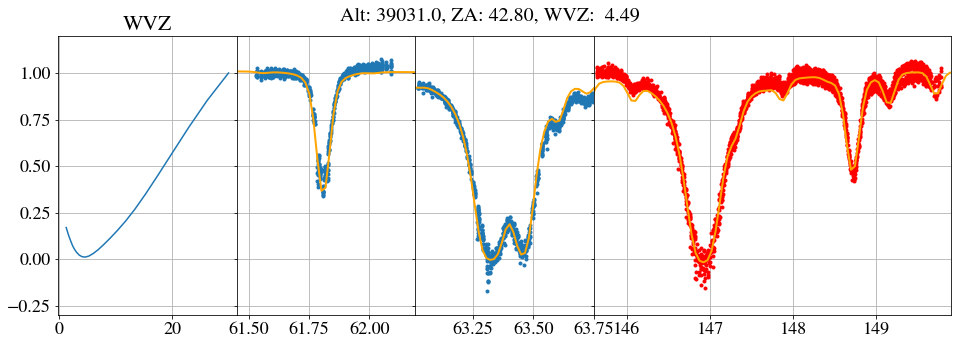

5  /  6


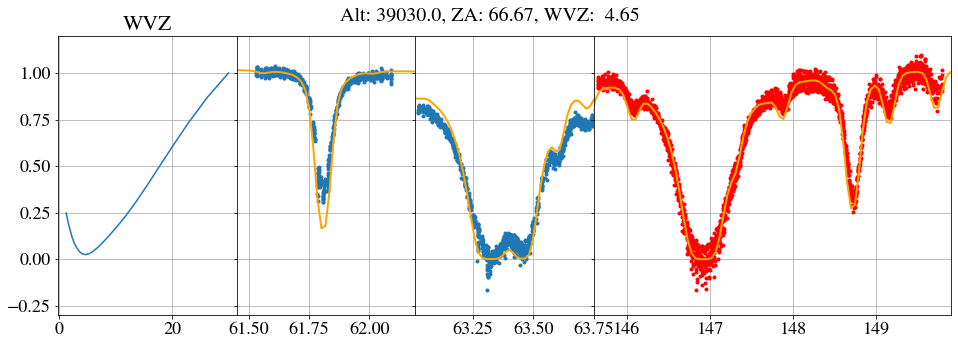

6  /  6


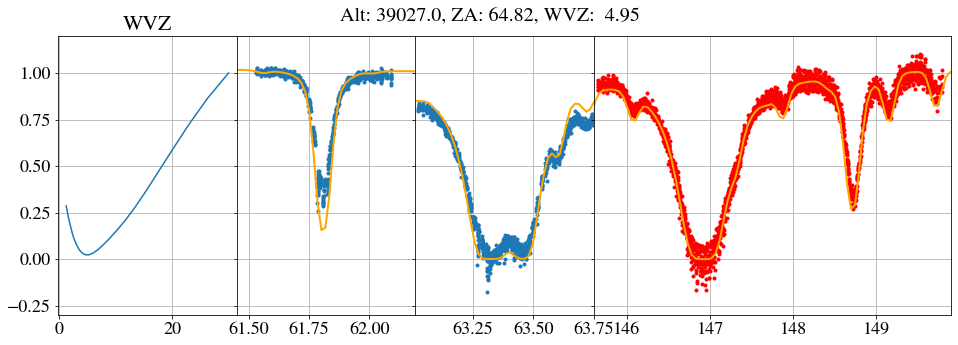

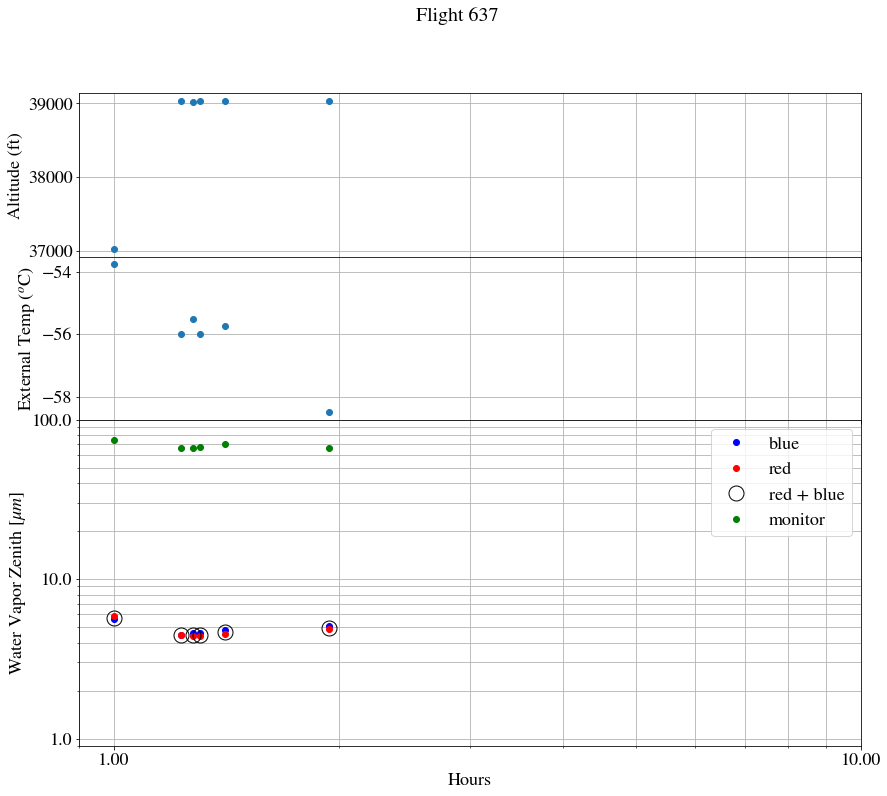

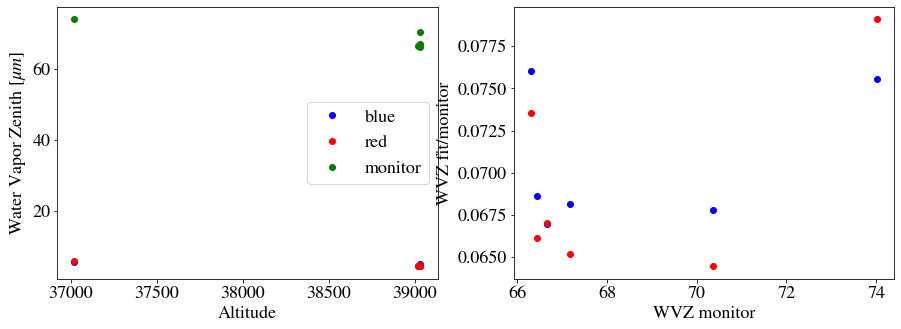

File  00007  Alt  37022.0 ft, WVZ: Blue  5.6  Red  5.9   Tot  5.7 
File  00012  Alt  39024.0 ft, WVZ: Blue  4.5  Red  4.5   Tot  4.5 
File  00017  Alt  39017.0 ft, WVZ: Blue  4.6  Red  4.4   Tot  4.5 
File  00022  Alt  39031.0 ft, WVZ: Blue  4.6  Red  4.4   Tot  4.5 
File  00027  Alt  39030.0 ft, WVZ: Blue  4.8  Red  4.5   Tot  4.7 
File  00076  Alt  39027.0 ft, WVZ: Blue  5.0  Red  4.9   Tot  5.0 
1  /  10


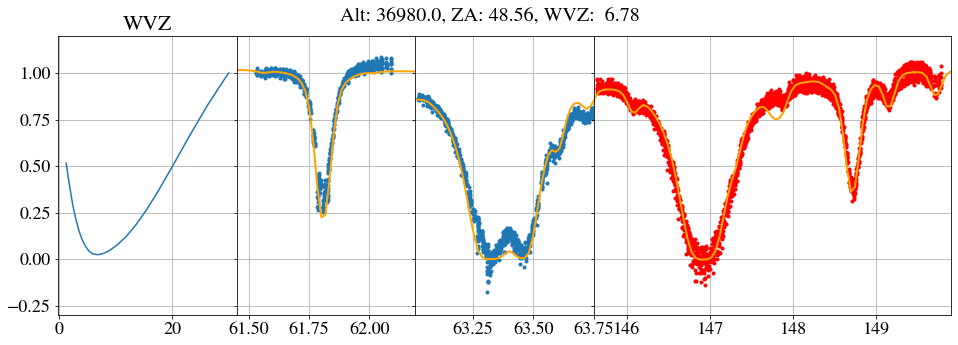

2  /  10


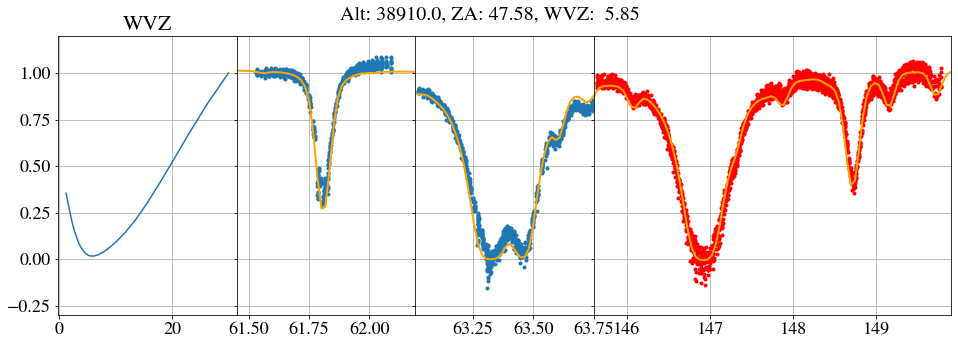

3  /  10


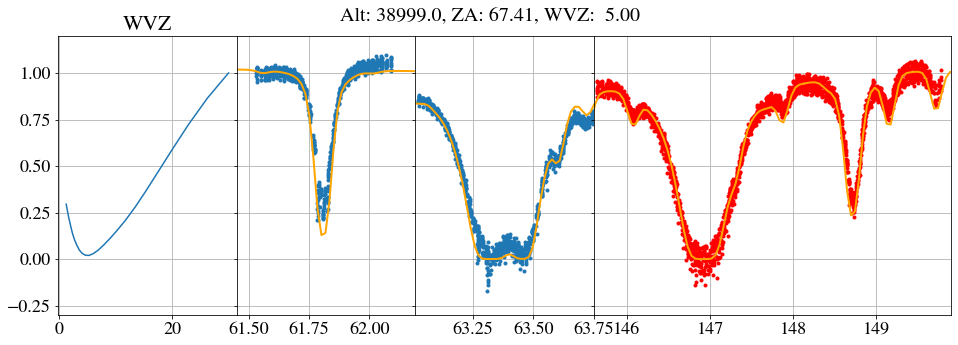

4  /  10


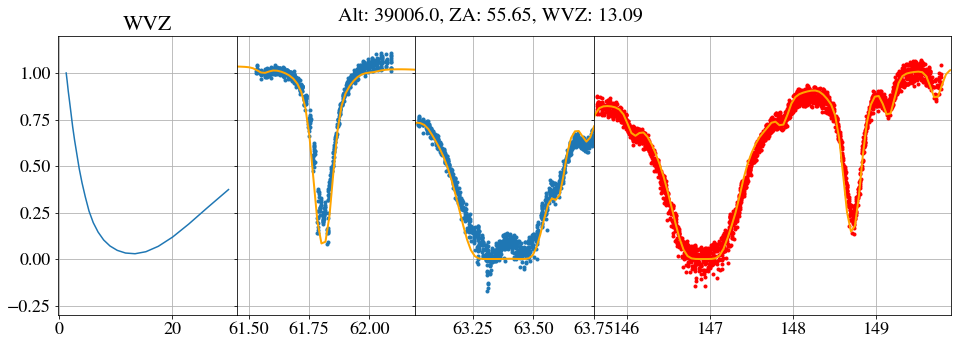

5  /  10


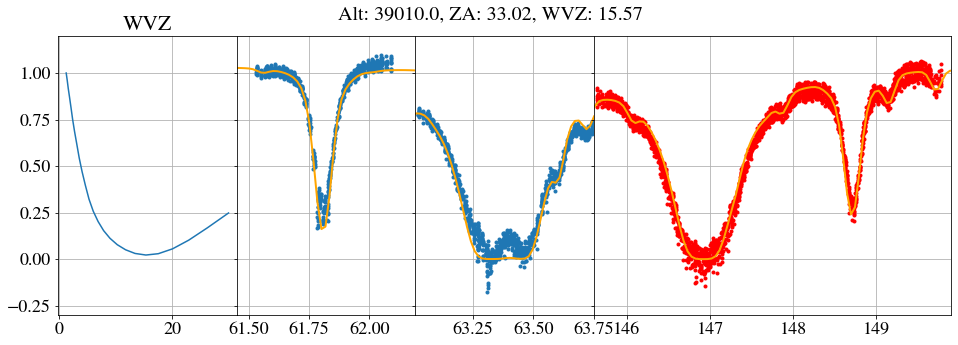

6  /  10


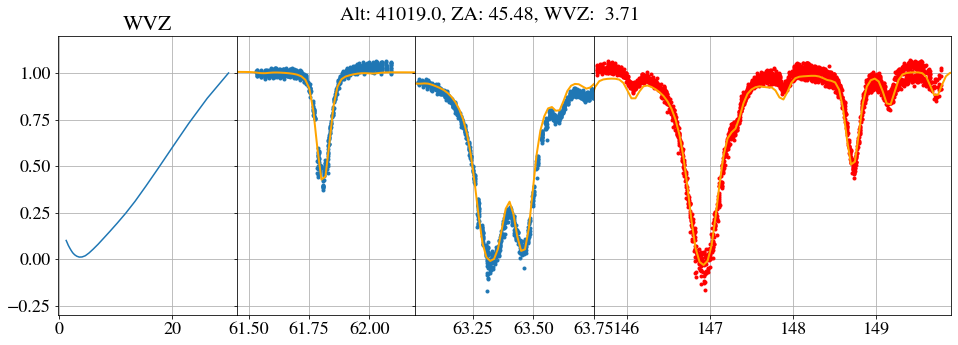

7  /  10


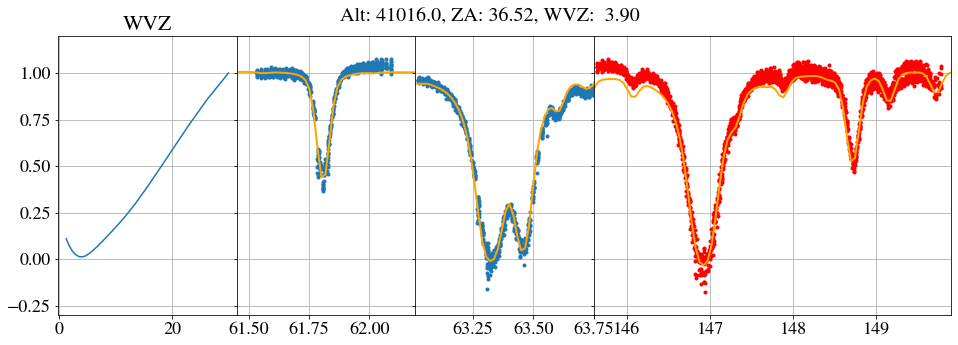

8  /  10


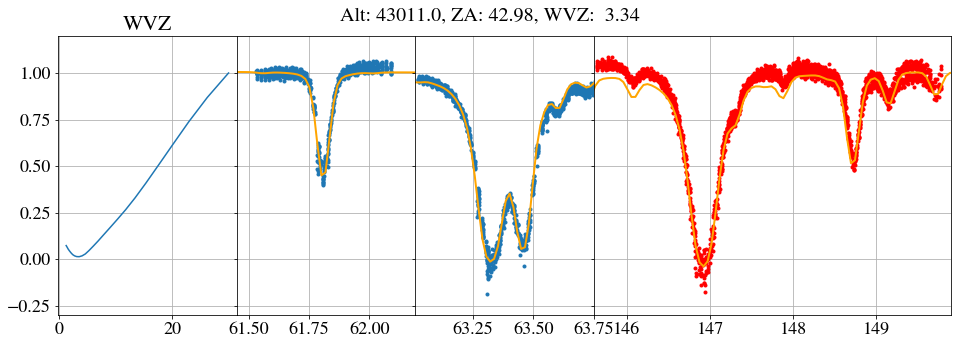

9  /  10


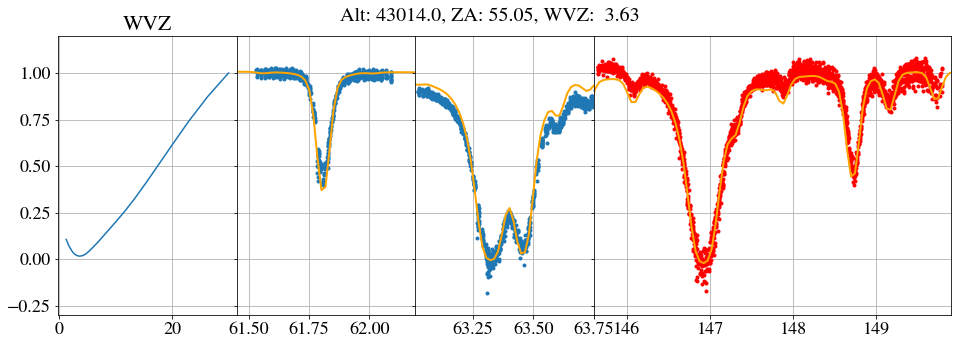

10  /  10


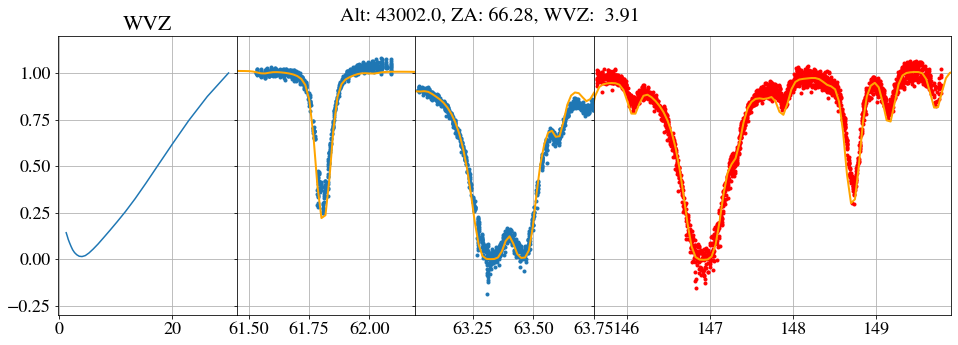

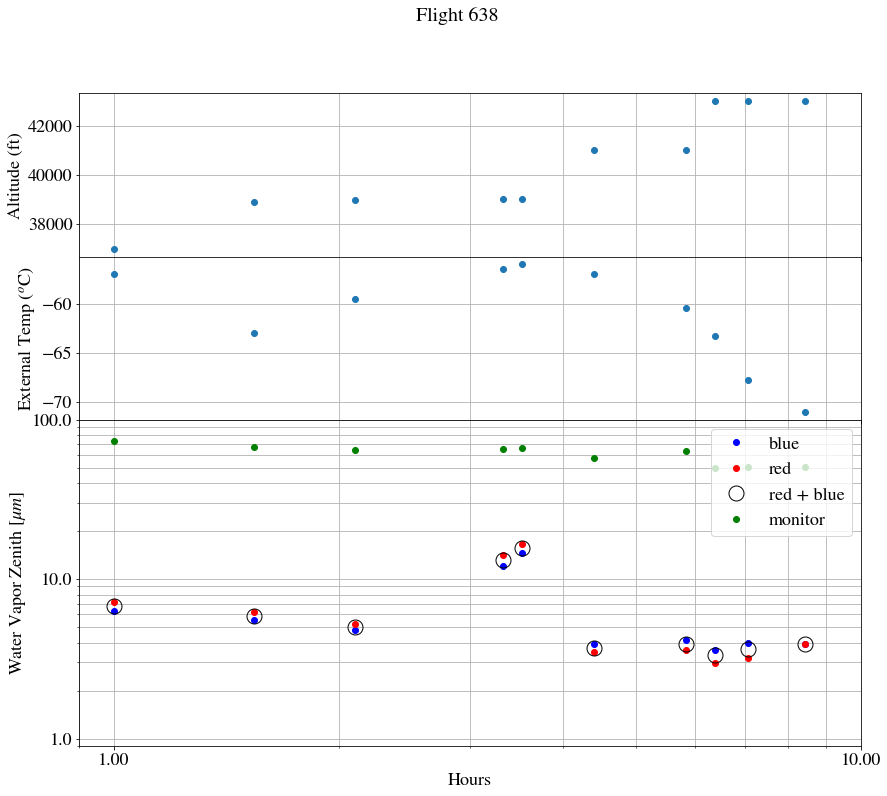

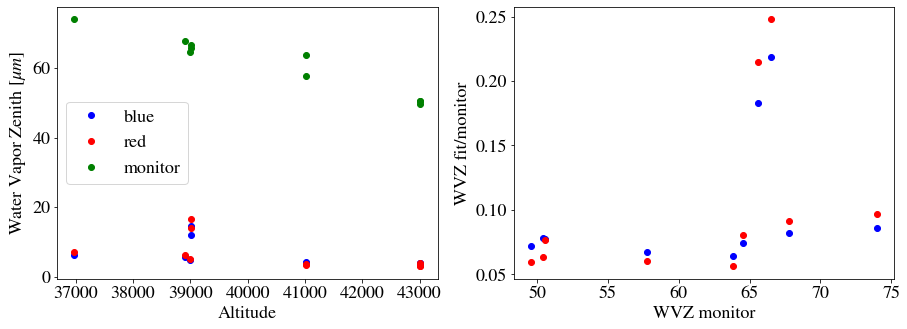

File  00011  Alt  36980.0 ft, WVZ: Blue  6.3  Red  7.2   Tot  6.8 
File  00065  Alt  38910.0 ft, WVZ: Blue  5.5  Red  6.2   Tot  5.9 
File  00112  Alt  38999.0 ft, WVZ: Blue  4.8  Red  5.2   Tot  5.0 
File  00206  Alt  39006.0 ft, WVZ: Blue 12.0  Red 14.1   Tot 13.1 
File  00217  Alt  39010.0 ft, WVZ: Blue 14.5  Red 16.5   Tot 15.6 
File  00408  Alt  41019.0 ft, WVZ: Blue  3.9  Red  3.5   Tot  3.7 
File  00525  Alt  41016.0 ft, WVZ: Blue  4.1  Red  3.6   Tot  3.9 
File  00569  Alt  43011.0 ft, WVZ: Blue  3.6  Red  3.0   Tot  3.3 
File  00624  Alt  43014.0 ft, WVZ: Blue  4.0  Red  3.2   Tot  3.6 
File  00739  Alt  43002.0 ft, WVZ: Blue  3.9  Red  3.9   Tot  3.9 
1  /  14


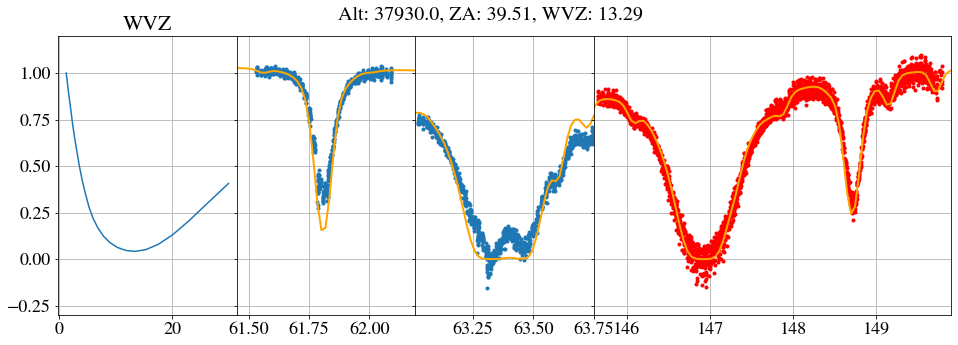

2  /  14


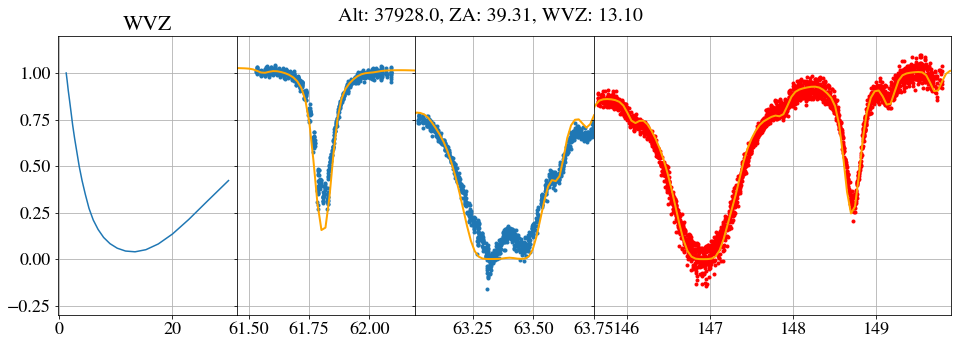

3  /  14


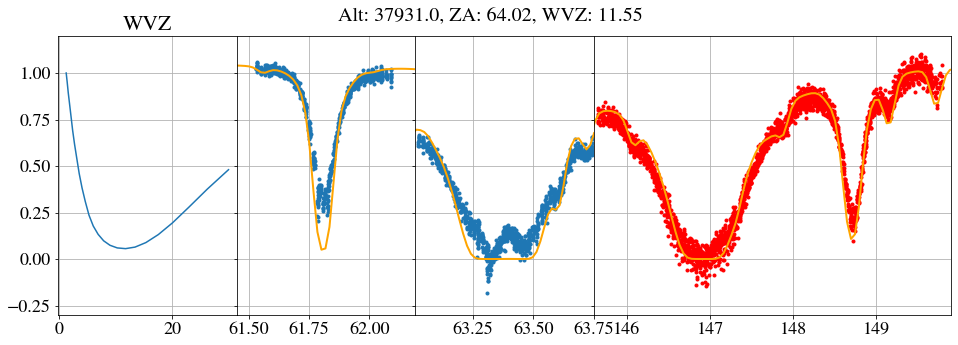

4  /  14


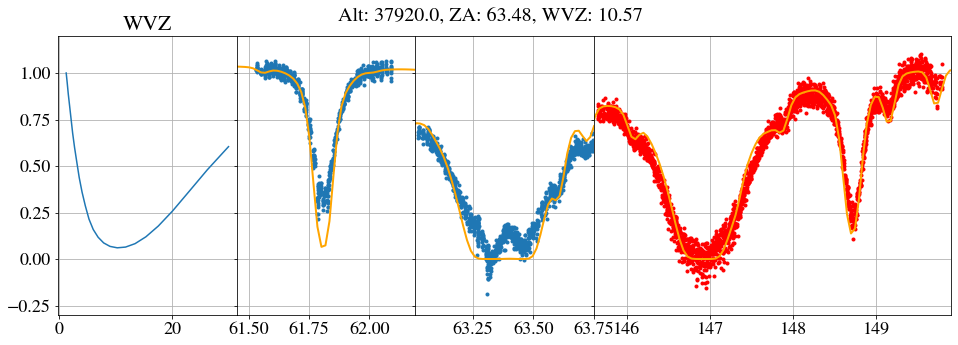

5  /  14


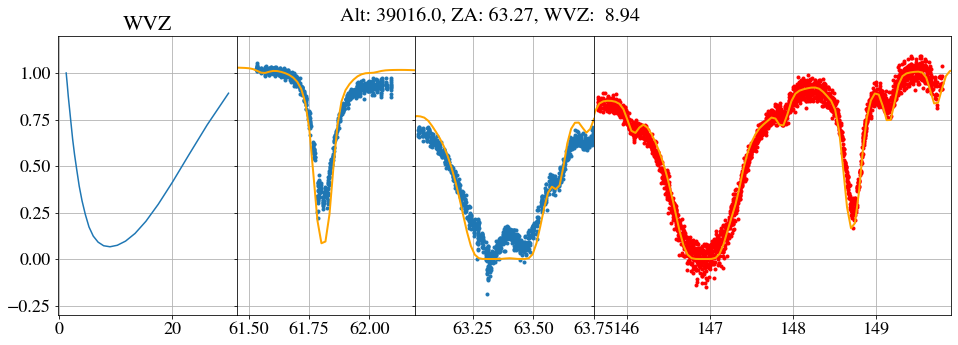

6  /  14


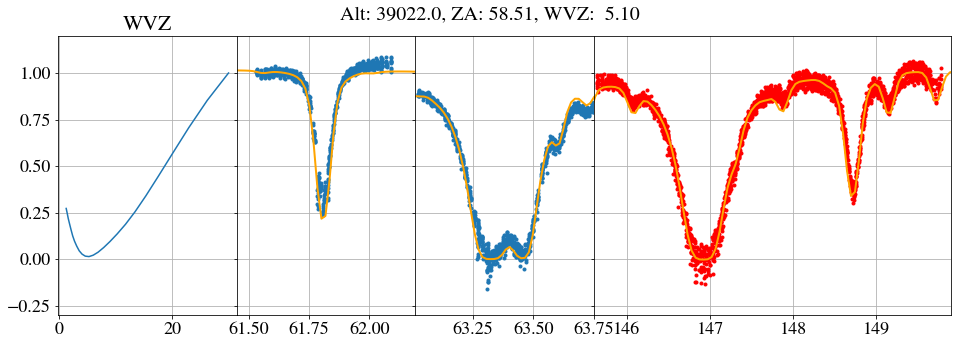

7  /  14


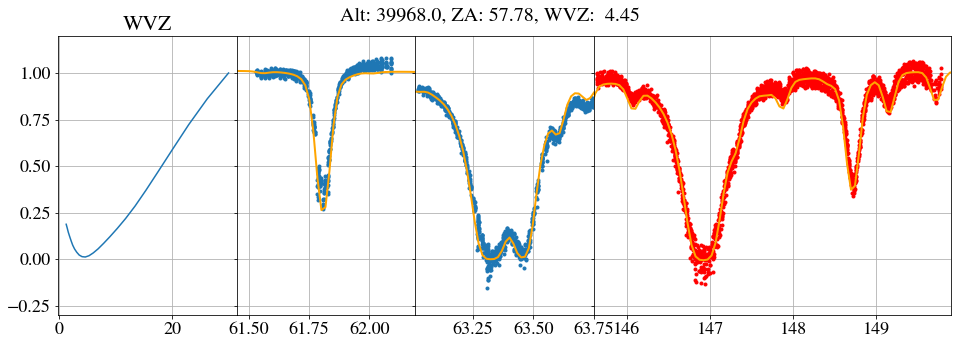

8  /  14


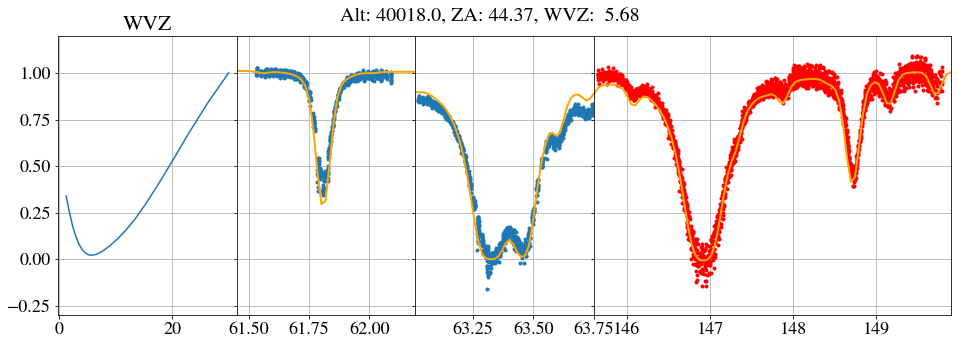

9  /  14


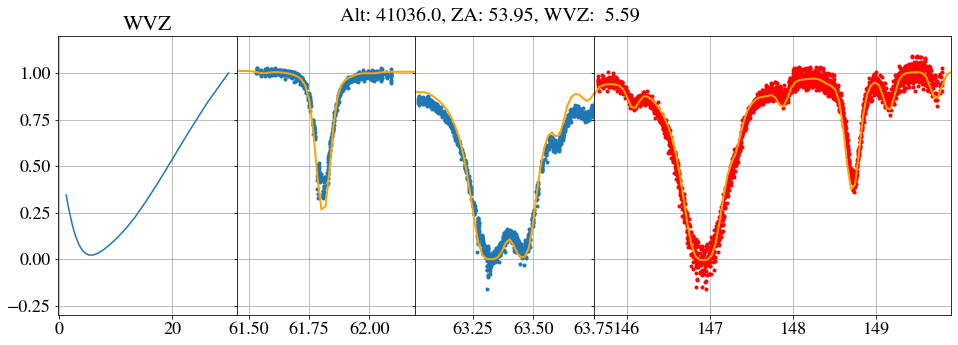

10  /  14


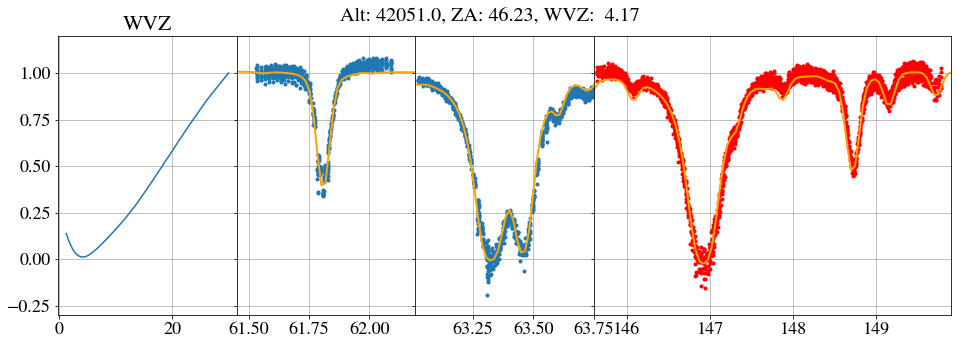

11  /  14


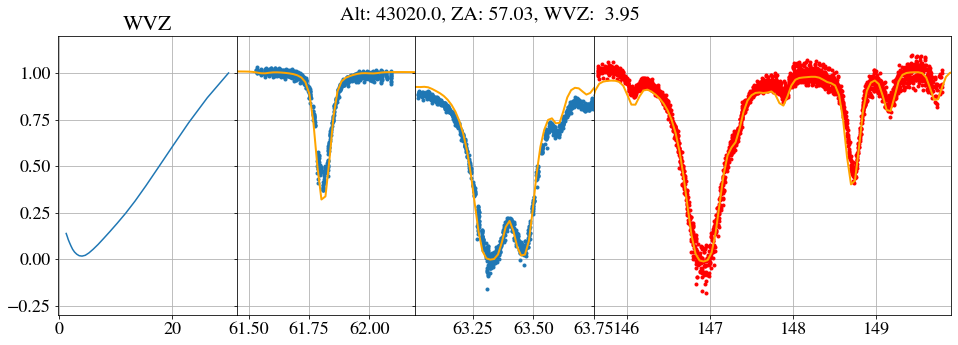

12  /  14


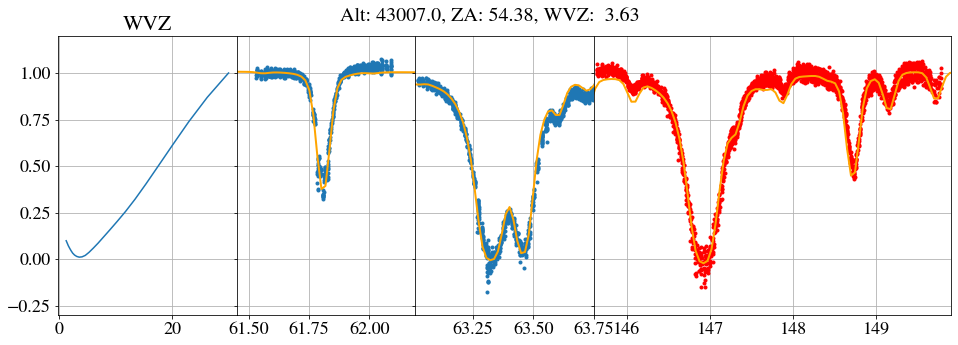

13  /  14


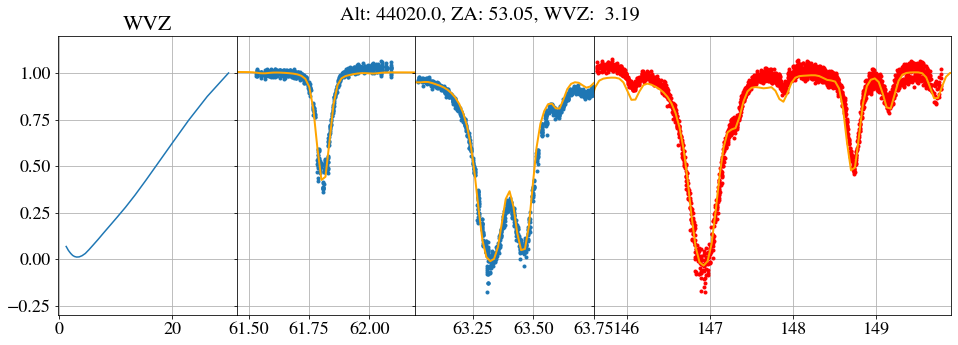

14  /  14


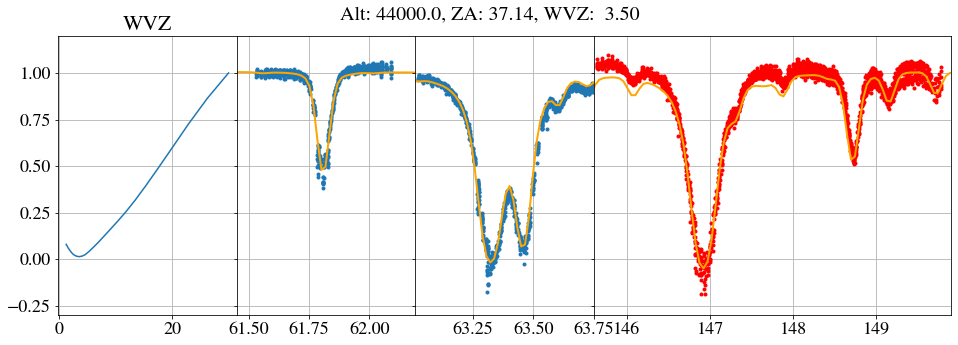

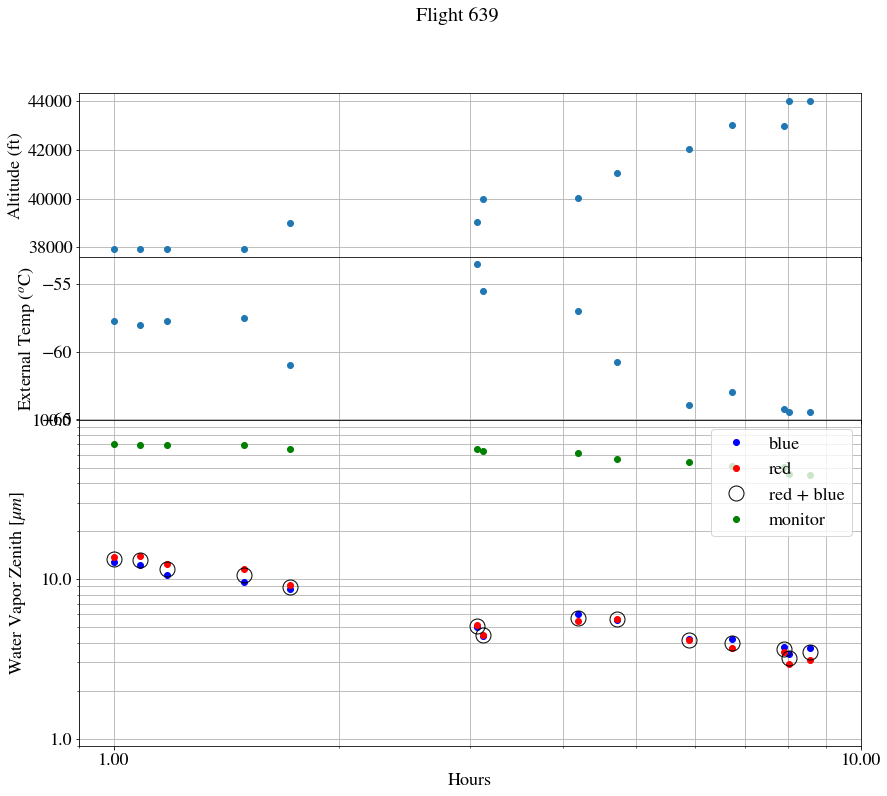

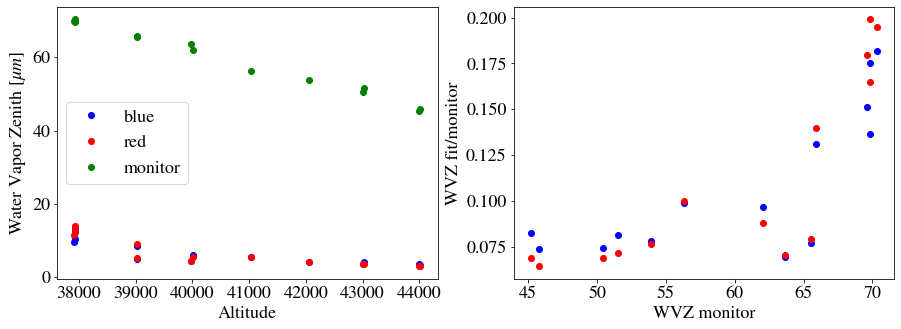

File  00003  Alt  37930.0 ft, WVZ: Blue 12.8  Red 13.7   Tot 13.3 
File  00008  Alt  37928.0 ft, WVZ: Blue 12.2  Red 13.9   Tot 13.1 
File  00013  Alt  37931.0 ft, WVZ: Blue 10.5  Red 12.5   Tot 11.5 
File  00038  Alt  37920.0 ft, WVZ: Blue  9.5  Red 11.5   Tot 10.6 
File  00061  Alt  39016.0 ft, WVZ: Blue  8.6  Red  9.2   Tot  8.9 
File  00174  Alt  39022.0 ft, WVZ: Blue  5.0  Red  5.2   Tot  5.1 
File  00179  Alt  39968.0 ft, WVZ: Blue  4.4  Red  4.5   Tot  4.4 
File  00274  Alt  40018.0 ft, WVZ: Blue  6.0  Red  5.4   Tot  5.7 
File  00315  Alt  41036.0 ft, WVZ: Blue  5.6  Red  5.6   Tot  5.6 
File  00408  Alt  42051.0 ft, WVZ: Blue  4.2  Red  4.1   Tot  4.2 
File  00473  Alt  43020.0 ft, WVZ: Blue  4.2  Red  3.7   Tot  4.0 
File  00568  Alt  43007.0 ft, WVZ: Blue  3.7  Red  3.5   Tot  3.6 
File  00583  Alt  44020.0 ft, WVZ: Blue  3.4  Red  2.9   Tot  3.2 
File  00622  Alt  44000.0 ft, WVZ: Blue  3.7  Red  3.1   Tot  3.5 
1  /  13


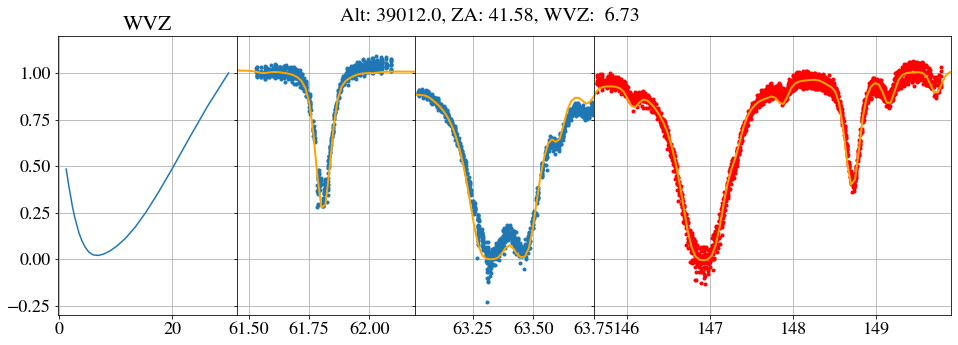

2  /  13


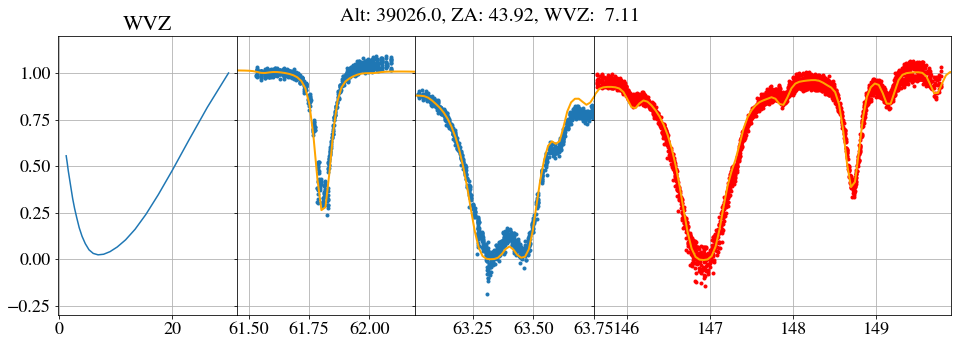

3  /  13


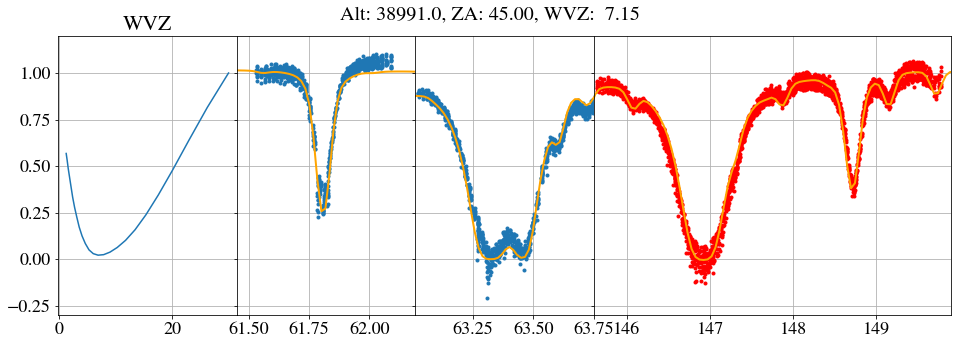

4  /  13


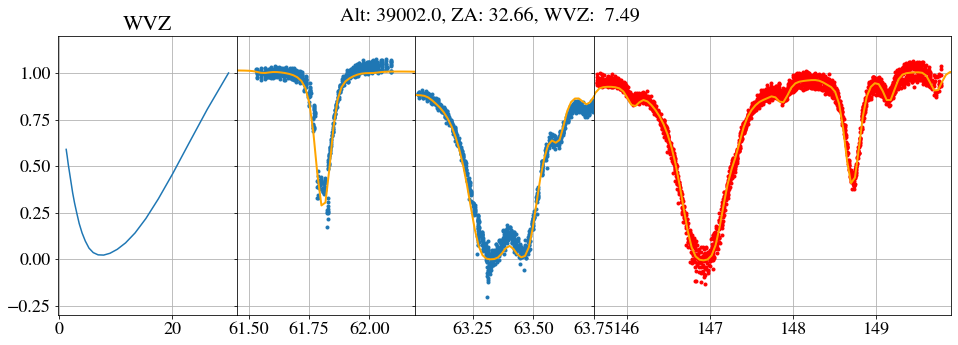

5  /  13


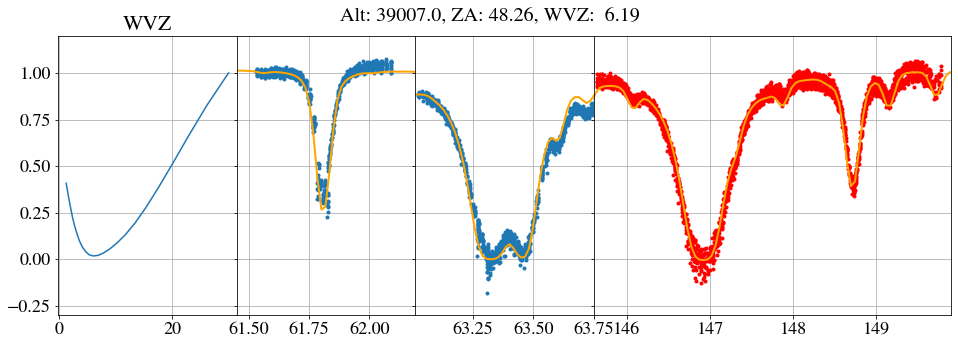

6  /  13


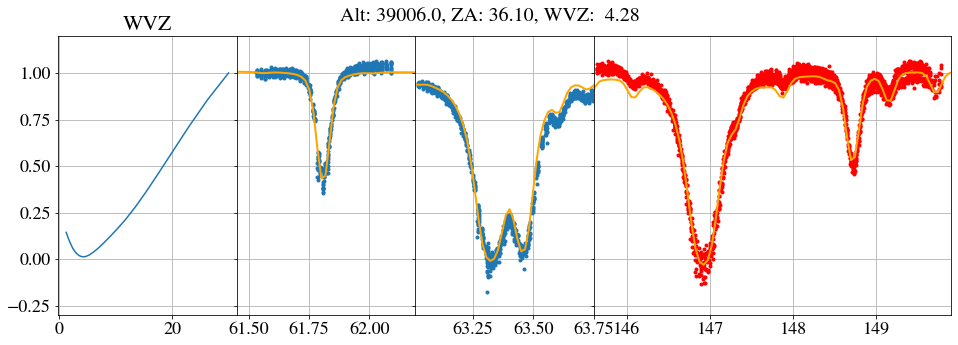

7  /  13


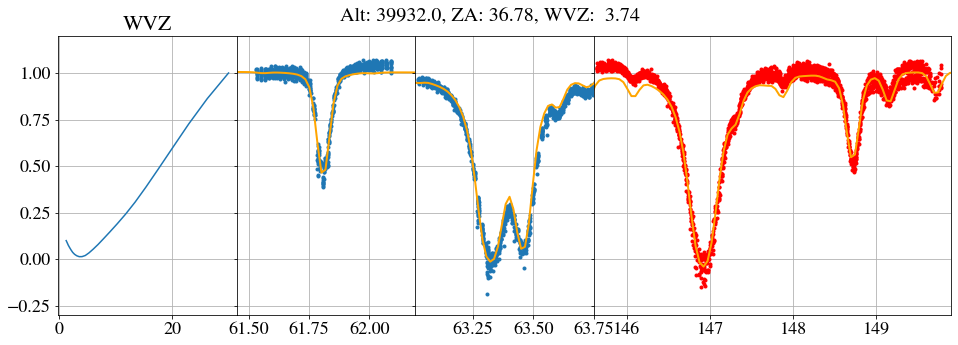

8  /  13


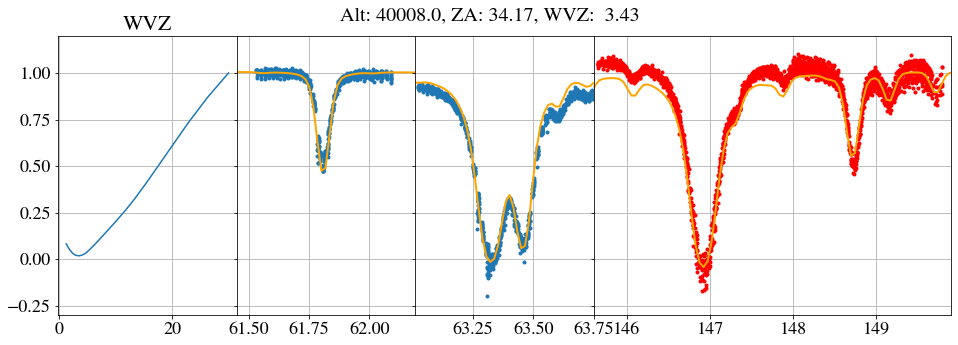

9  /  13


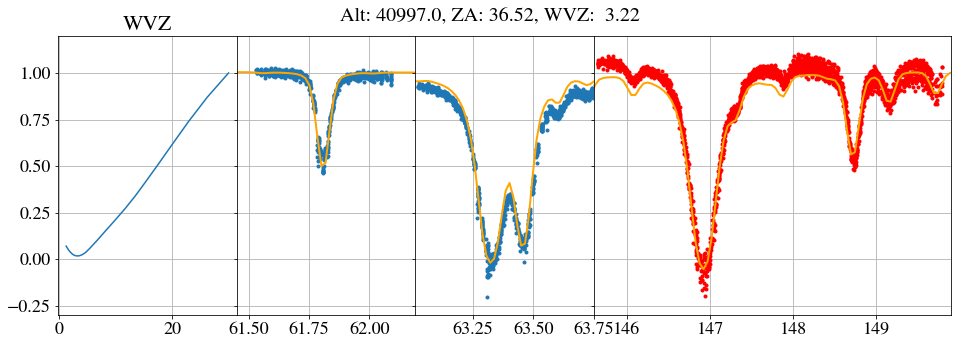

10  /  13


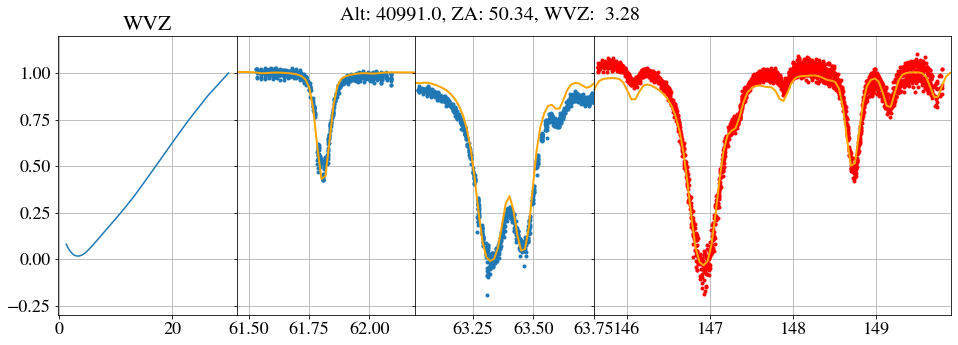

11  /  13


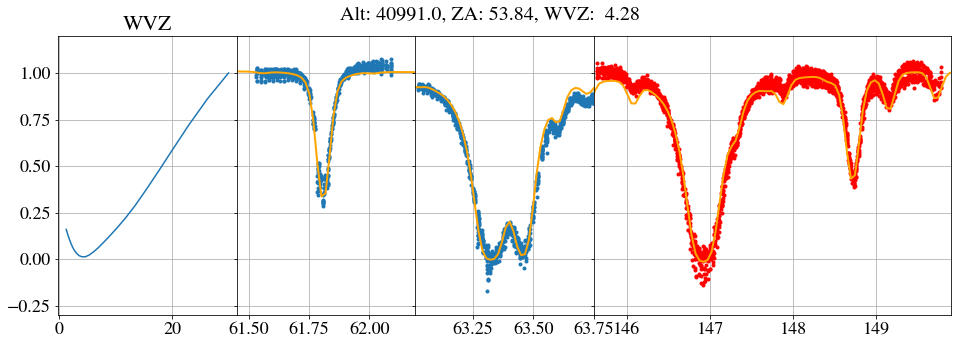

12  /  13


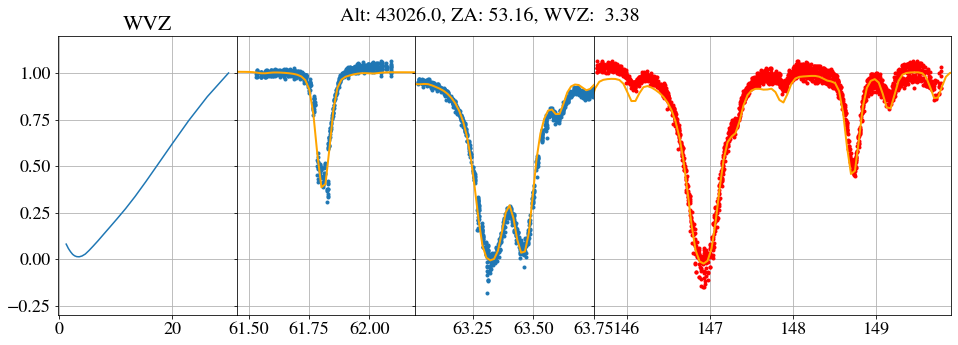

13  /  13


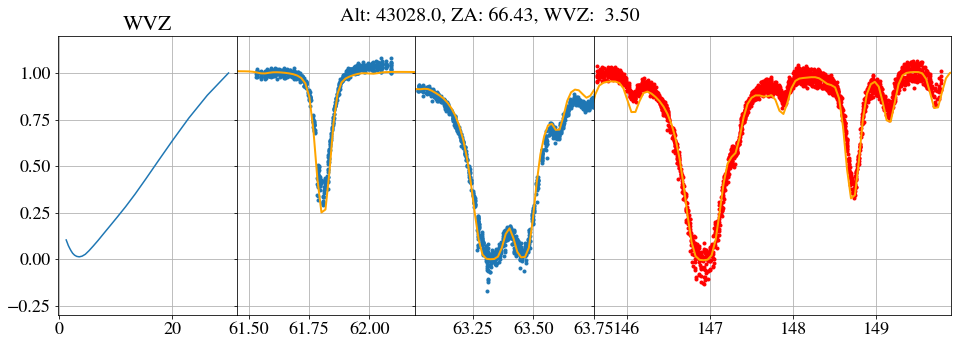

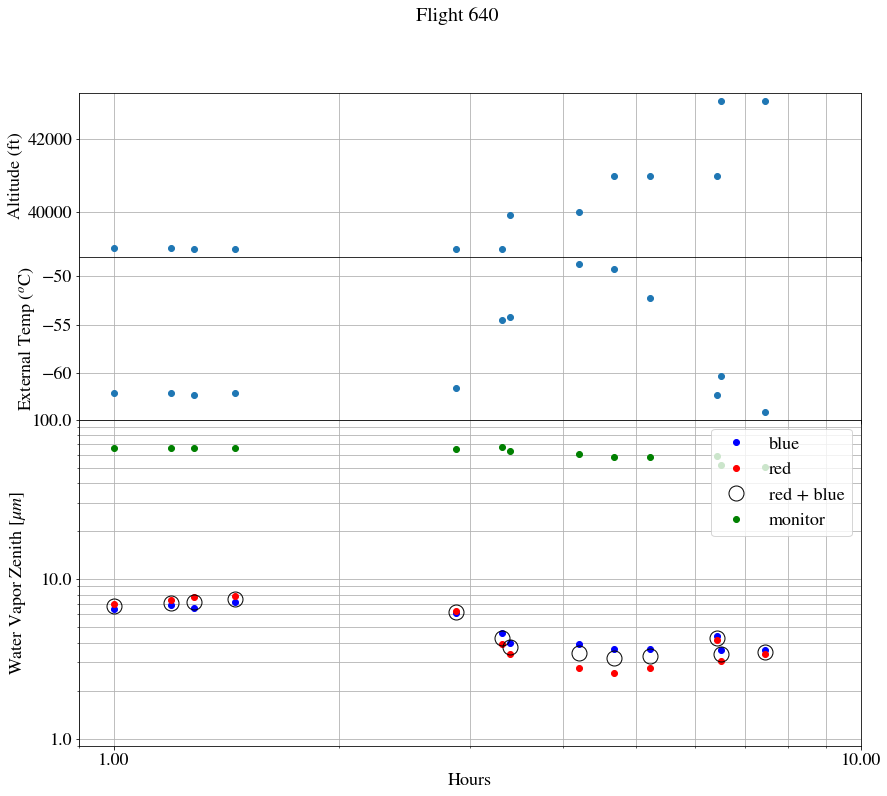

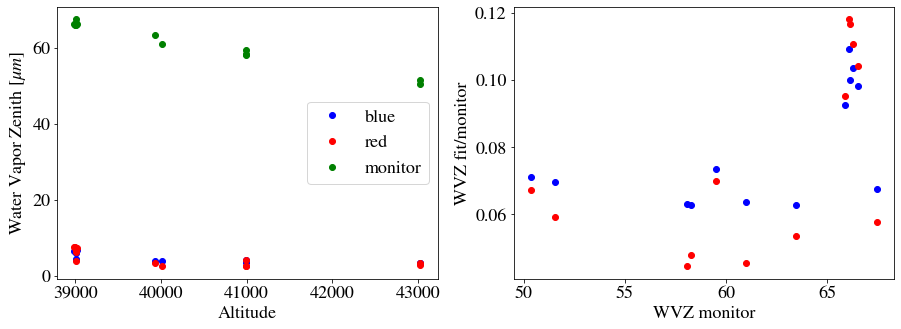

File  00006  Alt  39012.0 ft, WVZ: Blue  6.5  Red  6.9   Tot  6.7 
File  00011  Alt  39026.0 ft, WVZ: Blue  6.9  Red  7.3   Tot  7.1 
File  00016  Alt  38991.0 ft, WVZ: Blue  6.6  Red  7.7   Tot  7.1 
File  00021  Alt  39002.0 ft, WVZ: Blue  7.2  Red  7.8   Tot  7.5 
File  00143  Alt  39007.0 ft, WVZ: Blue  6.1  Red  6.3   Tot  6.2 
File  00176  Alt  39006.0 ft, WVZ: Blue  4.6  Red  3.9   Tot  4.3 
File  00181  Alt  39932.0 ft, WVZ: Blue  4.0  Red  3.4   Tot  3.7 
File  00248  Alt  40008.0 ft, WVZ: Blue  3.9  Red  2.8   Tot  3.4 
File  00291  Alt  40992.0 ft, WVZ: Blue  3.7  Red  2.6   Tot  3.2 
File  00332  Alt  40991.0 ft, WVZ: Blue  3.7  Red  2.8   Tot  3.3 
File  00432  Alt  40991.0 ft, WVZ: Blue  4.4  Red  4.2   Tot  4.3 
File  00437  Alt  43026.0 ft, WVZ: Blue  3.6  Red  3.1   Tot  3.4 
File  00510  Alt  43028.0 ft, WVZ: Blue  3.6  Red  3.4   Tot  3.5 


In [4]:
%matplotlib inline
import numpy as np
from fifipy.wvz import computeMeanFlux, computeAtran, getGroups, flightPlots, computeAtranTot
import time
import os
import pandas as pd
wvzdir = '/Users/dfadda/sofia/FIFI-LS/WaterVapor/'

flights = ['631','632','633','634','635','636','637','638','639','640']

for flight in flights:
    swgroups, lwgroups = getGroups(wvzdir, 'FLT' + flight)
    ngroups = len(lwgroups)
    alt = []
    wmblue = []
    wmred = []
    wmtot = []
    numfile = []
    for i, (swgroup, lwgroup) in enumerate(zip(swgroups, lwgroups)):
        print(i+1 ,' / ', ngroups)
        fileparts = os.path.basename(swgroup[0]).split('_')
        numfile.append(fileparts[0])
        #t0 = time.process_time()
        wavesb, fluxesb, detchanb, orderb, zab, altitudeb = computeMeanFlux(swgroup)
        wvmin, alpha, wblue, fblue = computeAtran(wavesb, fluxesb, detchanb, orderb, zab, altitudeb, atrandata=atran2, plot=False)
        wmblue.append(wvmin)
        wavesr, fluxesr, detchanr, orderr, zar, altituder = computeMeanFlux(lwgroup)
        wvmin, alpha, wred, fred = computeAtran(wavesr, fluxesr, detchanr, orderr, zar, altituder, atrandata=atran1, plot=False)
        wmred.append(wvmin)
        # Two fluxes at same time
        wvmin = computeAtranTot(wred, fred, wblue ,fblue, zar, altituder, atran1, atran2)
        wmtot.append(wvmin)
        #t1 = time.process_time()
        #print('Data processed in ', t1-t0, ' s.')
        alt.append(altitudeb)
    alt = np.array(alt)
    wmblue = np.array(wmblue)
    wmred = np.array(wmred)
    wmtot = np.array(wmtot)
    
    
    date, time, temp, wmon, fig = flightPlots(lwgroups, alt, wmblue, wmred, wmtot, 'Flight '+flight)
    fig.savefig('WVZ_FLT'+flight+'.pdf')
    for n, a, wb, wr, wt in zip(numfile, alt, wmblue, wmred, wmtot):
        print('File ',n,' Alt ', a, 'ft, WVZ: Blue {0:4.1f}'.format(wb),
              ' Red {0:4.1f} '.format(wr), ' Tot {0:4.1f} '.format(wt))
    # Save in a csv file
    df = pd.DataFrame({'Date': date, 'NumFile': numfile, 'Altitude': alt, 'ExtTemp': temp,
                   'WvzBlue': wmblue, 'WvzRed': wmred, 'WvzTot': wmtot, 'WvzMon': wmon})
    df.to_csv('FLT'+flight+'.csv')

# All figures together

In [6]:
from PyPDF2 import PdfFileMerger

merger= PdfFileMerger()
for f in range(631,641,1):
    merger.append('WVZ_FLT'+str(f)+'.pdf')
    
merger.write('WaterVaporNov2019.pdf')   

# Putting everything together

36980.0


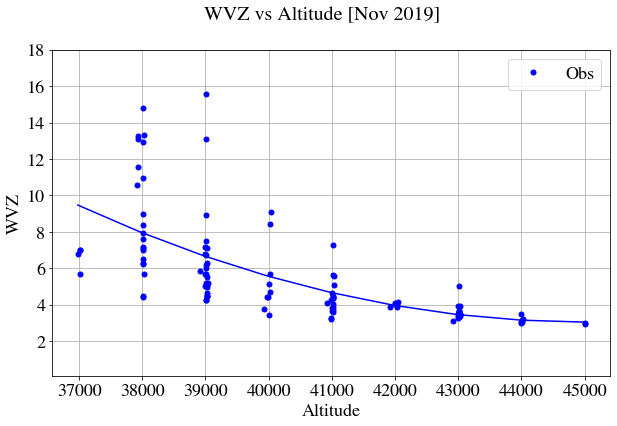

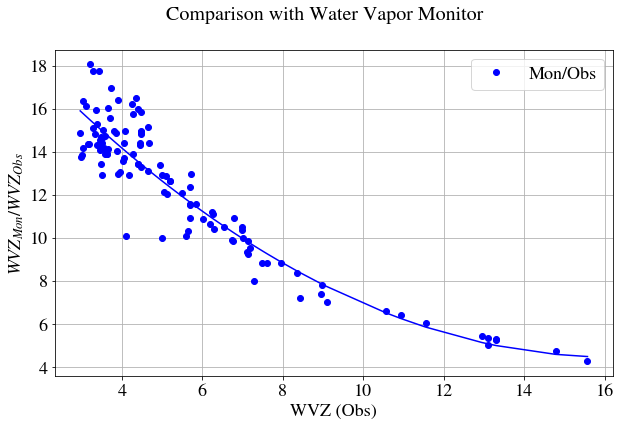

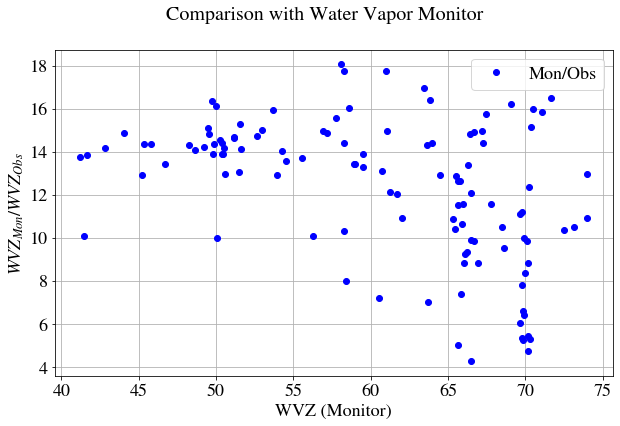

In [39]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams['font.family']='STIXGeneral'
rcParams['font.size']=18
rcParams['mathtext.fontset']='stix'
rcParams['legend.numpoints']=1
from lmfit import Parameters, minimize

def quad(p,w,data=None,eps=None):
    #unpack parameters
    v = p.valuesdict()
    a = v['a']
    b = v['b']
    c = v['c']
    # define model
    model =  a + b * w + c * w *w
    if data is None:
        return model
    else:
        if eps is None:
            return (model-data).flatten() # Using absolute value of deviations as residuals
        else:
            return ((model-data)/eps).flatten()
def fitAlpha(w,s):
    fit_params = Parameters()
    fit_params.add('a',value=np.nanmedian(s))
    fit_params.add('b',value=0)
    fit_params.add('c',value=0)
    out = minimize(quad,fit_params,args=(w,),kws={'data':s},method='Nelder')
    sfit = quad(out.params,w)   
    return sfit


temp = []
alt = []
wmon = []
wmtot = []

for f in range(631,641,1):
    df = pd.read_csv('FLT'+str(f)+'.csv')
    temp.extend(df['ExtTemp'].values)
    alt.extend(df['Altitude'].values)
    wmon.extend(df['WvzMon'].values)
    wmtot.extend(df['WvzTot'].values)
    
temp = np.array(temp)
alt = np.array(alt)
wmon = np.array(wmon)
wmtot = np.array(wmtot)

fig,ax = plt.subplots(figsize=(10,6))
m = (temp < -10)
print(np.min(alt[m]))
ax.plot(alt[m],wmtot[m],'o',color='blue',label='Obs',markersize=5)
#ax.plot(alt[m],wmon[m],'o',color='green',label='Mon')
m = (temp < -10) & (wmtot < 30)
a = alt[m]; wb = wmtot[m]
s = np.argsort(a); a = a[s]; wb = wb[s]
sfit = fitAlpha(a,wb)
ax.plot(a,sfit,color='Blue')
#a = alt[m]; wr = wmred[m]
#s = np.argsort(a); a = a[s]; wr = wr[s]
#sfit = fitAlpha(a,wr)
#ax.plot(a,sfit,color='Red')
ax.set_xlabel('Altitude')
ax.set_ylabel('WVZ')
ax.set_ylim(0.1,18)
ax.grid()
ax.legend()
fig.suptitle('WVZ vs Altitude [Nov 2019]', fontsize=20)
plt.show()
fig.savefig("WVZ_alt_nov2019.pdf")

medtot = np.nanmedian(wmon[m]/wmtot[m])
stdtot = np.nanstd(wmon[m]/wmtot[m])

fig,ax = plt.subplots(figsize=(10,6))
m = (temp < 0)
ax.plot(wmtot[m],wmon[m]/wmtot[m],'o',color='blue',label='Mon/Obs')
#ax.axhspan(medtot-stdtot, medtot+stdtot, alpha=0.5, hatch = "\\", edgecolor='blue',facecolor='none')
#ax.axhline(medtot, color='blue')#, label='Median Mon/Blue')
#ax.axhspan(medred-stdred, medred+stdred, alpha=0.5, edgecolor='red',hatch='//',facecolor='none')
#ax.axhline(medred, color='red')#, label='Median Mon/Red')
a = wmtot[m]; wb = wmon[m]/wmtot[m]
s = np.argsort(a); a = a[s]; wb = wb[s]
sfit = fitAlpha(a,wb)
ax.plot(a,sfit,color='Blue')

ax.set_xlabel('WVZ (Obs)')
ax.set_ylabel('$WVZ_{Mon}/WVZ_{Obs}$')
#ax.set_ylim(-0.49,3.49)
ax.grid()
ax.legend()
fig.suptitle('Comparison with Water Vapor Monitor', fontsize=20)
plt.show()
fig.savefig('WVmon_nov2019.pdf')

fig,ax = plt.subplots(figsize=(10,6))
m = (temp < 0)
ax.plot(wmon[m],wmon[m]/wmtot[m],'o',color='blue',label='Mon/Obs')
ax.set_xlabel('WVZ (Monitor)')
ax.set_ylabel('$WVZ_{Mon}/WVZ_{Obs}$')
#ax.set_ylim(-0.49,3.49)
ax.grid()
ax.legend()
fig.suptitle('Comparison with Water Vapor Monitor', fontsize=20)
plt.show()
fig.savefig('WVmon2_nov2019.pdf')




In [16]:
print(np.min(alt))
print(np.max(temp))
print(np.shape(temp))

38991.0
-48.75
(130,)


# Column of water vapor per flight

In [58]:
def computeWVZfile(Path, Flight, Nfiles):
    import pandas as pd
    import numpy as np
    df = pd.read_csv(Path+'/FLT'+Flight+'.csv')

    nf = df['NumFile'].values
    alt = df['Altitude'].values
    wvz = df['WvzTot'].values

    # Rules
    # 0) Until first number:  no value
    # 1) After first number:  if np.abs(altitude[i] - altitude[i+1]) < 100  interpolate values
    #                          elif > 100 :   wvz[i]
    # 2) After last number    wvz[-1]
    for i in range(len(nf)):
        if i == 0:
            wvzvalues = [''] * (nf[0]-1)
        if i == len(nf) - 1:
            wvzvalues.extend(['{0:5.2f}'.format(wvz[-1])] * (Nfiles-nf[-1]+1))
        else:
            if np.abs(alt[i]-alt[i+1]) > 100.0:
                wvzvalues.extend(['{0:5.2f}'.format(wvz[i])] * (nf[i+1] - nf[i]))
            else:
                wvzi = np.interp(np.arange(nf[i], nf[i+1], 1), [nf[i], nf[i+1]], [wvz[i], wvz[i+1]])
                #wvzi = np.interp(np.arange(nf[i], nf[i+1], 1), [nf[i], nf[i+1]], [wvz[i], wvz[i]])
                for wvzi_ in wvzi:
                    wvzvalues.append('{0:5.2f}'.format(wvzi_))

    wvzvalues = np.array(wvzvalues)
    print(Nfiles, np.shape(wvzvalues))
    wvzvalues = np.repeat(wvzvalues, 2) # duplicate for lw and sw files
    np.savetxt(Path+'/wvz_'+Flight+'.txt', wvzvalues, delimiter='\n', fmt='%s')

In [63]:
Flights = [str(i).zfill(3) for i in range(631,641,1)]
Nfiles = [716,730,668,664,714,965,446,829,688,643]
Path = '/Users/dfadda/sofia/FIFI-LS/WaterVapor/'

for flight, nfiles in zip (Flights, Nfiles):
    computeWVZfile(Path, flight, nfiles)

716 (716,)
730 (730,)
668 (668,)
664 (664,)
714 (714,)
965 (965,)
446 (446,)
829 (829,)
688 (688,)
643 (643,)


In [57]:

df = pd.read_csv('FLT'+Flight+'.csv')
df

,Unnamed: 0,Date,NumFile,Altitude,ExtTemp,WvzBlue,WvzRed,WvzTot,WvzMon
0,0,2019-10-30T04:25:43,5,38006.0,-58.50,5.670405,6.823793,6.241288,69.779
1,1,2019-10-30T04:27:11,10,38007.0,-58.75,5.719298,6.855318,6.269457,69.675
2,2,2019-10-30T05:38:19,102,38020.0,-56.00,5.644265,5.723131,5.682694,70.235
3,3,2019-10-30T06:16:40,233,39002.0,-50.50,4.462873,3.995718,4.259793,69.101
4,4,2019-10-30T07:04:09,300,39990.0,-56.25,4.503109,4.364901,4.442327,63.975
5,5,2019-10-30T07:47:44,305,40018.0,-62.50,4.375772,5.036848,4.676944,67.273
6,6,2019-10-30T07:49:12,310,40917.0,-58.25,4.052434,4.119190,4.083472,61.065
7,7,2019-10-30T08:49:45,375,41923.0,-58.25,4.121537,3.550057,3.869575,54.281
8,8,2019-10-30T10:11:42,489,43012.0,-61.00,3.904198,3.118990,3.584008,49.812
9,9,2019-10-30T11:00:31,552,43007.0,-61.50,3.633606,3.382872,3.532165,52.990
